In [4]:
#load suite2p data
%reset
%whos

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os
from datetime import datetime

%matplotlib inline

#load multiple small scanImage ROIs, for direct comparison.....
roi_names=[]
paths=[]
flag=True
while flag==True:
    roi_names.append(input('Enter brain area name.'))
    paths.append(input("Enter the path to suite2p outputs:"))
    quit=input('Are there more areas (Yes/No)?')
    if quit=='No':
        flag=False
roi_names.append('combined')
par_dir=paths[0].replace('\\plane0','')
paths.append(par_dir)
save_paths=paths.copy()
print("Success!")
#print(roi_names)
#print(paths)

Once deleted, variables cannot be recovered. Proceed (y/[n])?  y


Interactive namespace is empty.


Enter brain area name. rt_M2
Enter the path to suite2p outputs: F:\Mesoscope_Analysis_III_Jul15_2020-Sept01_2020\3056_E235_A1V1M2\3056_200904_E235_4_1_1_all_HAL_Sept0920\suite2p_out\suite2p\plane0
Are there more areas (Yes/No)? Yes
Enter brain area name. rt_S1b
Enter the path to suite2p outputs: F:\Mesoscope_Analysis_III_Jul15_2020-Sept01_2020\3056_E235_A1V1M2\3056_200904_E235_4_1_1_all_HAL_Sept0920\suite2p_out\suite2p\plane1
Are there more areas (Yes/No)? Yes
Enter brain area name. rt_A1
Enter the path to suite2p outputs: F:\Mesoscope_Analysis_III_Jul15_2020-Sept01_2020\3056_E235_A1V1M2\3056_200904_E235_4_1_1_all_HAL_Sept0920\suite2p_out\suite2p\plane2
Are there more areas (Yes/No)? Yes
Enter brain area name. rt_V1
Enter the path to suite2p outputs: F:\Mesoscope_Analysis_III_Jul15_2020-Sept01_2020\3056_E235_A1V1M2\3056_200904_E235_4_1_1_all_HAL_Sept0920\suite2p_out\suite2p\plane3
Are there more areas (Yes/No)? No


In [5]:
#load in behavior and create output directories
path_behav = input("Enter the path for behav npys, all in one folder:")

brate=input("What was the common behavioral sampling rate?")
brate=int(brate)

m_crash=input("Did Matlab crash (Yes/No)?")
lv_crash=input("Did Labview crash (Yes/No)?")

#create save path
dateTimeObj=datetime.now()
dateStampStr = dateTimeObj.strftime("%b%d_%Y_%H_%M_%S")

for i in range(0,len(paths)):
    save_paths[i]=paths[i]+"/"+dateStampStr
                                   
    try:
        os.mkdir(save_paths[i])
    except OSError:
        print ("Creation of the directory %s failed" % save_paths[i])
    else:
        print ("Successfully created the directory %s " % save_paths[i])

#area_name = input("Which cortical area is this?")
rate = input("What common sampling rate do you want? (5, 10, 50, 100, or 500)")
rate=int(rate)

print("Success!")

Enter the path for behav npys, all in one folder: F:\Mesoscope_Analysis_III_Jul15_2020-Sept01_2020\3056_E235_A1V1M2\3056_200904_E235_4_1_1_all_HAL_Sept0920\behavior_mat_npy
What was the common behavioral sampling rate? 5000
Did Matlab crash (Yes/No)? No
Did Labview crash (Yes/No)? No


Successfully created the directory F:\Mesoscope_Analysis_III_Jul15_2020-Sept01_2020\3056_E235_A1V1M2\3056_200904_E235_4_1_1_all_HAL_Sept0920\suite2p_out\suite2p\plane0/Dec12_2020_11_57_06 
Successfully created the directory F:\Mesoscope_Analysis_III_Jul15_2020-Sept01_2020\3056_E235_A1V1M2\3056_200904_E235_4_1_1_all_HAL_Sept0920\suite2p_out\suite2p\plane1/Dec12_2020_11_57_06 
Successfully created the directory F:\Mesoscope_Analysis_III_Jul15_2020-Sept01_2020\3056_E235_A1V1M2\3056_200904_E235_4_1_1_all_HAL_Sept0920\suite2p_out\suite2p\plane2/Dec12_2020_11_57_06 
Successfully created the directory F:\Mesoscope_Analysis_III_Jul15_2020-Sept01_2020\3056_E235_A1V1M2\3056_200904_E235_4_1_1_all_HAL_Sept0920\suite2p_out\suite2p\plane3/Dec12_2020_11_57_06 
Successfully created the directory F:\Mesoscope_Analysis_III_Jul15_2020-Sept01_2020\3056_E235_A1V1M2\3056_200904_E235_4_1_1_all_HAL_Sept0920\suite2p_out\suite2p/Dec12_2020_11_57_06 


What common sampling rate do you want? (5, 10, 50, 100, or 500) 10


Success!


What is the resolution, in micrometers per pixel? 1.25
What size is your FOV (small, medium, or large)? small
What x-axis size in micrometers, for rt_M2? 1320
What y-axis size in micrometers, for rt_M2? 660


Number of cells: 257.0


What is the resolution, in micrometers per pixel? 1.25
What size is your FOV (small, medium, or large)? small
What x-axis size in micrometers, for rt_S1b? 1320
What y-axis size in micrometers, for rt_S1b? 660


Number of cells: 279.0


What is the resolution, in micrometers per pixel? 1.25
What size is your FOV (small, medium, or large)? small
What x-axis size in micrometers, for rt_A1? 1320
What y-axis size in micrometers, for rt_A1? 660


Number of cells: 449.0


What is the resolution, in micrometers per pixel? 1.25
What size is your FOV (small, medium, or large)? small
What x-axis size in micrometers, for rt_V1? 1320
What y-axis size in micrometers, for rt_V1? 660


Number of cells: 387.0


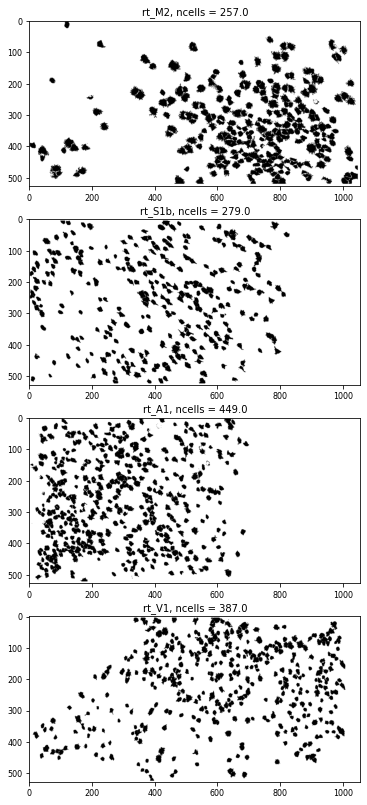

In [6]:
#Load suite2p data
dummy_len=[]
dummy_ncells=[]
max_cells=0
max_length=0
for i in range(len(roi_names)-1):
    F_dummy=np.load(paths[i] + '/F.npy', allow_pickle=True)

    dummy_len.append(len(F_dummy[0,:]))
    if len(F_dummy[0,:])>max_length:
        max_length=len(F_dummy[0,:])
    dummy_ncells.append(len(F_dummy[:,0]))
    if len(F_dummy[:,0])>max_cells:
        max_cells=len(F_dummy[:,0])

F=np.zeros((len(roi_names)-1,max_cells,max_length),dtype=float)
Fneu=np.zeros((len(roi_names)-1,max_cells,max_length),dtype=float)
spks=np.zeros((len(roi_names)-1,max_cells,max_length),dtype=float)
iscell=np.zeros((len(roi_names)-1,max_cells,2),dtype=float)
nROIs=np.zeros((len(roi_names)-1),dtype=float)
npoints=np.zeros((len(roi_names)-1),dtype=float)
ncells=np.zeros((len(roi_names)-1),dtype=float)
dur=np.zeros((len(roi_names)-1),dtype=float)
res=np.zeros((len(roi_names)-1),dtype=float)
res_int=np.zeros((len(roi_names)-1),dtype=float)
fov_size=np.zeros((len(roi_names)-1),dtype=str)
x_size=np.zeros((len(roi_names)-1),dtype=float)
y_size=np.zeros((len(roi_names)-1),dtype=float)

for i in range(len(roi_names)-1):
    F_temp = np.load(paths[i] + '/F.npy', allow_pickle=True)
    Fneu_temp = np.load(paths[i] + '/Fneu.npy', allow_pickle=True)
    spks_temp = np.load(paths[i] + '/spks.npy', allow_pickle=True)
    stat = np.load(paths[i] + '/stat.npy', allow_pickle=True)
    ops = np.load(paths[i] + '/ops.npy', allow_pickle=True).item()
    iscell_temp = np.load(paths[i] + '/iscell.npy', allow_pickle=True)

    for j in range(0,dummy_ncells[i]):
        for k in range(0,dummy_len[i]):
            F[i,j,k] = F_temp[j,k]
            Fneu[i,j,k] = Fneu_temp[j,k]
            spks[i,j,k] = spks_temp[j,k]
            iscell[i,j,:] = iscell_temp[j,:]
            
    stat = np.load(paths[i] + '/stat.npy', allow_pickle=True)
    ops = np.load(paths[i] + '/ops.npy', allow_pickle=True).item()
    nROIs[i]=dummy_ncells[i]
    npoints[i]=dummy_len[i]
    ncells[i]=0
    dur[i]=ops['nframes']/ops['fs']

    res[i]=float(input("What is the resolution, in micrometers per pixel?"))
    res_int[i]=int(res[i])
    fov_size[i]=input("What size is your FOV (small, medium, or large)?")
    x_size[i]=input('What x-axis size in micrometers, for '+roi_names[i]+'?')
    y_size[i]=input('What y-axis size in micrometers, for '+roi_names[i]+'?')
    x_size[i]=int(x_size[i])
    y_size[i]=int(y_size[i])

    im = np.ones((int(ops['Lx']*res_int[i]), int(ops['Ly']*res_int[i]),3))

    for n in range(0,int(nROIs[i])):
        if iscell[i][n,0]==1:
            ncells[i]=ncells[i]+1
            #print(ncells)
            ypix = stat[n]['ypix'][~stat[n]['overlap']]*int(res_int[i])
            xpix = stat[n]['xpix'][~stat[n]['overlap']]*int(res_int[i])
            im[xpix,ypix] = 0

    print("Number of cells: " + str(ncells[i]))
    
    if i==0:
        fig = plt.figure(figsize=(32,14))
    axis_name='ax'+str(i)
    axis_name = fig.add_subplot(len(roi_names)-1,1,i+1)
    plt.imshow(im)
    axis_name.set_title(roi_names[i] + ", ncells = " + str(ncells[i]), fontdict = {'fontsize' : 10})
    axis_name.tick_params(axis='x',labelsize=8)
    axis_name.tick_params(axis='y',labelsize=8)
    #plt.show()

    plt.savefig(save_paths[i]+'/ROI_iscell_map'+roi_names[i]+'.png', dpi=300, bbox_inches='tight')

In [7]:
#if lv_crash=Yes, load rt_whisk data to get length to which to truncate 2P data
if lv_crash=='Yes':
    try:
        rt_whisk = np.load(path_behav + '/rt_whisk.npy', allow_pickle=True)
        rt_whisk_t=np.zeros((rt_whisk.shape[0],1))
        rt_whisk_al=np.zeros((rt_whisk.shape[0],2))

        rt_whisk_t=np.linspace(0,dur[0],num=rt_whisk.shape[0])

        rt_whisk_al[:,0]=rt_whisk_t
        rt_whisk_al[:,1]=rt_whisk[:,0]
        dur3=np.floor(rt_whisk.shape[0]/brate)
        print(dur3)
        npoints=np.floor(dur3*ops['fs'])
        npoints=int(npoints)
        meso_trunc=dur-dur3
        
        print(F.shape)
        F=F[:,:,:-int(np.ceil(meso_trunc*ops['fs']))]
        Fneu=Fneu[:,:,:-int(np.ceil(meso_trunc*ops['fs']))]
        spks=spks[:,:,:-int(np.ceil(meso_trunc*ops['fs']))]
        dur=dur3
        print(F.shape)
    
    except FileNotFoundError:
        print("\nrt_whisk.npy does not exist!!")
print("Success!")

Duration of 2P movie is 5014.481409001956 seconds.


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide


How many cells to test? 10


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide


How many cells to test? 10
How many cells to test? 10


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide


How many cells to test? 10


Success!


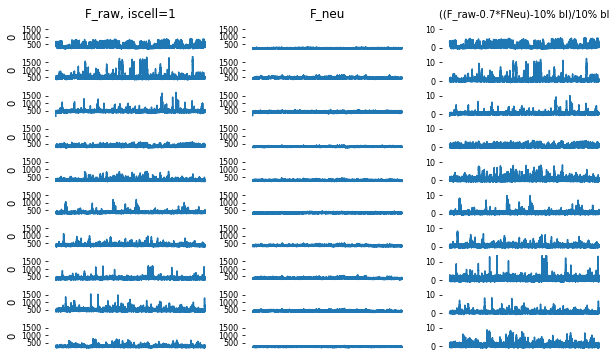

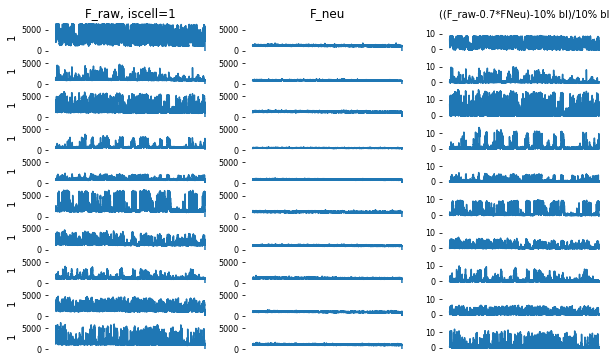

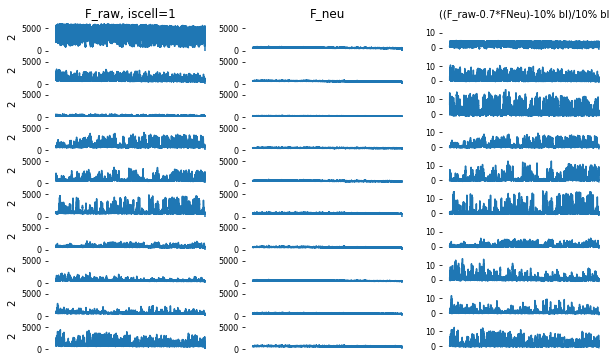

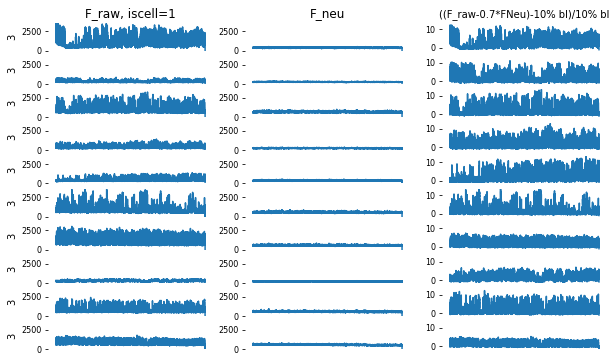

In [8]:
#suite2p data preprocessing
#dur=ops['nframes']/ops['fs']
import scipy.signal
print("Duration of 2P movie is " + str(dur[0]) + " seconds.")

if lv_crash=='Yes':
    print("Duration of behavior is " + str(dur3) + " seconds.")

#Neuropil subtraction
F_sub=F-(0.7*Fneu)

#Baseline as 10th percentile of each subtracted trace
F_bl=np.zeros((len(roi_names)-1,max_cells),dtype=float)
F_sub=np.zeros((len(roi_names)-1,max_cells,max_length),dtype=float)
F_df=np.zeros((len(roi_names)-1,max_cells,max_length),dtype=float)
F_sub=F-(0.7*Fneu)
F_iscell=np.zeros((len(roi_names)-1,int(max(ncells)), int(max(npoints))),dtype=float)
Fneu_iscell=np.zeros((len(roi_names)-1,int(max(ncells)), int(max(npoints))),dtype=float)
F_df_iscell=np.zeros((len(roi_names)-1,int(max(ncells)), int(max(npoints))),dtype=float)
F_df_iscell_upsamp=np.zeros((len(roi_names)-1,int(max(ncells)),int(rate*dur[0])), dtype=np.float16)
F_df_iscell_norm=np.zeros((len(roi_names),int(max(ncells)),int(rate*dur[0])), dtype=np.float16)

for i in range(0,len(roi_names)-1):
    for j in range(0,int(nROIs[i])):
        if iscell[i,j,0]==1:
            F_bl[i,j]=np.percentile(F_sub[i,j],10)

    #DF/F with baseline of entire trace
    for j in range(0,int(nROIs[i])):
        if F_bl[i,j]>0:
            F_df[i,j,:]=(F_sub[i,j,:]-F_bl[i,j])/F_bl[i,j]
        if F_bl[i,j]<=0:
            F_df[i,j,:]=(F_sub[i,j,:]-F_bl[i,j])/np.percentile(F_sub[i,j,:],25)

    #Create array of "real" cells
    c=0
    for n in range(0,int(nROIs[i])):
        if iscell[i,n,0]==1:
            F_iscell[i,c,:]=F[i,n,:]
            Fneu_iscell[i,c,:]=Fneu[i,n,:]
            F_df_iscell[i,c,:]=F_df[i,n,:]
            c=c+1

    #upsample F_df_real to "rate"; might want to use Numba for this part
    for j in range(0,int(max(ncells))):
        F_df_iscell_upsamp[i,j,:]=scipy.signal.resample(F_df_iscell[i,j,:], int(rate*dur[0]), axis=0)
        F_df_iscell_norm[i,j,:]=F_df_iscell_upsamp[i,j,:]/max(F_df_iscell_upsamp[i,j,:])

    #Plot example F, Fneu, etc for iscell
    cell_num = input("How many cells to test?")
    cell_num=int(cell_num)
    cell_start=0

    fig = plt.figure(figsize=(10,6))
    y_min=100000
    y_max=0
    df_min=0
    df_max=0

    for j in range(0,cell_num):
        if max(F_iscell[i,j])>y_max:
            y_max=max(F_iscell[i,j,:])
        if min(F_iscell[i,j])<y_min:
            y_min=min(F_iscell[i,j,:])
        if max(F_df_iscell[i,j,:])>df_max and max(F_df_iscell[i,j,:])<30:
            df_max=max(F_df_iscell[i,j,:])
        if min(F_df_iscell[i,j,:])<df_min:
            df_min=min(F_df_iscell[i,j,:])

    for j in range(0,cell_num):
        k=j+1
        l=j+2
        m=j+3

        axk = fig.add_subplot(cell_num,3,1+(3*j))
        axk.get_xaxis().set_visible(False)
        axk.set_ylim([y_min,y_max])
        axk.set_frame_on(False)
        axk.set_ylabel(i+cell_start)

        if j==0:
            axk.set_title('F_raw, iscell=1', fontsize=12)

        plt.tick_params(labelsize=8)
        plt.plot(F_iscell[i,j,:])

        axl = fig.add_subplot(cell_num,3,2+(3*j))
        axl.get_xaxis().set_visible(False)
        axl.set_ylim([y_min,y_max])
        axl.set_frame_on(False)

        if j==0:
            axl.set_title('F_neu',fontsize=12)

        plt.tick_params(labelsize=8)
        plt.plot(Fneu_iscell[i,j,:])

        axm = fig.add_subplot(cell_num,3,3+(3*j))
        axm.get_xaxis().set_visible(False)
        axm.set_ylim([df_min,df_max])
        axm.set_frame_on(False)

        if j==0:
            axm.set_title('((F_raw-0.7*FNeu)-10% bl)/10% bl',fontsize=10)

        plt.tick_params(labelsize=8)
        plt.plot(F_df_iscell[i,j])

    plt.savefig(save_paths[i]+'/'+roi_names[i]+'_F_Fneu_dFF_ex_traces.png', dpi=300, bbox_inches='tight')

F_df_iscell_upsamp.astype(np.float32)
F_df_iscell_norm.astype(np.float32)

print("Success!")

In [9]:
#Load behavioral variables

try:
    fl_cam = np.load(path_behav + '/fl_cam.npy', allow_pickle=True)
    fl_cam_t=np.zeros((fl_cam.shape[0],1))
    fl_cam_al=np.zeros((fl_cam.shape[0],2))

    fl_cam_t=np.linspace(0,dur[0],num=fl_cam.shape[0])

    fl_cam_al[:,0]=fl_cam_t
    fl_cam_al[:,1]=fl_cam[:,0]
    
    fl_cam_exist=True
    
except FileNotFoundError:
    fl_cam_exist=False
    print("\nfl_cam.npy does not exist!!")

    
try:
    lft_ex = np.load(path_behav + '/lft_ex.npy', allow_pickle=True)
    lft_ex_t=np.zeros((lft_ex.shape[0],1))
    lft_ex_al=np.zeros((lft_ex.shape[0],2))

    lft_ex_t=np.linspace(0,dur[0],num=lft_ex.shape[0])

    lft_ex_al[:,0]=lft_ex_t
    lft_ex_al[:,1]=lft_ex[:,0]
    
except FileNotFoundError:
    print("\nlft_ex.npy does not exist!!")

    
try:
    lft_ppl = np.load(path_behav + '/lft_ppl.npy', allow_pickle=True)
    lft_ppl_t=np.zeros((lft_ppl.shape[0],1))
    lft_ppl_al=np.zeros((lft_ppl.shape[0],2))

    lft_ppl_t=np.linspace(0,dur[0],num=lft_ppl.shape[0])

    lft_ppl_al[:,0]=lft_ppl_t
    lft_ppl_al[:,1]=lft_ppl[:,0]

except FileNotFoundError:
    print("\nlft_ppl.npy does not exist!!")

    
try:
    lft_whisk = np.load(path_behav + '/lft_whisk.npy', allow_pickle=True)
    lft_whisk_t=np.zeros((lft_whisk.shape[0],1))
    lft_whisk_al=np.zeros((lft_whisk.shape[0],2))

    lft_whisk_t=np.linspace(0,dur[0],num=lft_whisk.shape[0])

    lft_whisk_al[:,0]=lft_whisk_t
    lft_whisk_al[:,1]=lft_whisk[:,0]
    
except FileNotFoundError:
    print("\nlft_whisk.npy does not exist!!")

    
try:
    lick = np.load(path_behav + '/lick.npy', allow_pickle=True)
    
except FileNotFoundError:
    print("\nlick.npy does not exist")

    
try:
    lpup_fc = np.load(path_behav + '/lpup_fc.npy', allow_pickle=True)
    lpup_fc_t=np.zeros((lpup_fc.shape[0],1))
    lpup_fc_al=np.zeros((lpup_fc.shape[0],2))

    lpup_fc_t=np.linspace(0,dur[0],num=lpup_fc.shape[0])

    lpup_fc_al[:,0]=lpup_fc_t
    lpup_fc_al[:,1]=lpup_fc[:,0]
    
except FileNotFoundError:
    print("\nlpup_fc.npy does not exist!!")

    
try:
    ni_pzo = np.load(path_behav + '/ni_pzo.npy', allow_pickle=True)
    ni_pzo_t=np.zeros((ni_pzo.shape[0],1))
    ni_pzo_al=np.zeros((ni_pzo.shape[0],2))

    ni_pzo_t=np.linspace(0,dur[0],num=ni_pzo.shape[0])

    ni_pzo_al[:,0]=ni_pzo_t
    ni_pzo_al[:,1]=ni_pzo[:,0]
    
    ni_pzo_exist=True
    
except FileNotFoundError:
    ni_pzo_exist=False
    print("\nni_pzo.npy does not exist!!")

    
try:
    p_diode = np.load(path_behav + '/p_diode.npy', allow_pickle=True)
    p_diode_t=np.zeros((p_diode.shape[0],1))
    p_diode_al=np.zeros((p_diode.shape[0],2))

    p_diode_t=np.linspace(0,dur[0],num=p_diode.shape[0])

    p_diode_al[:,0]=p_diode_t
    p_diode_al[:,1]=p_diode[:,0]
    
except FileNotFoundError:
    print("\np_diode.npy does not exist!!")

    
try:
    piezo_co = np.load(path_behav + '/piezo_co.npy', allow_pickle=True)
    piezo_co_t=np.zeros((piezo_co.shape[0],1))
    piezo_co_al=np.zeros((piezo_co.shape[0],2))

    piezo_co_t=np.linspace(0,dur[0],num=piezo_co.shape[0])

    piezo_co_al[:,0]=piezo_co_t
    piezo_co_al[:,1]=piezo_co[:,0]
    
    piezo_co_exist=True
    
except FileNotFoundError:
    piezo_co_exist=False
    print("\npiezo_co.npy does not exist!!")


try:
    rpup_fc = np.load(path_behav + '/rpup_fc.npy', allow_pickle=True)
    rpup_fc_t=np.zeros((rpup_fc.shape[0],1))
    rpup_fc_al=np.zeros((rpup_fc.shape[0],2))

    rpup_fc_t=np.linspace(0,dur[0],num=rpup_fc.shape[0])

    rpup_fc_al[:,0]=rpup_fc_t
    rpup_fc_al[:,1]=rpup_fc[:,0]
    
except FileNotFoundError:
    print("\nrpup_fc.npy does not exist!!")


try:
    rt_ex = np.load(path_behav + '/rt_ex.npy', allow_pickle=True)
    rt_ex_t=np.zeros((rt_ex.shape[0],1))
    rt_ex_al=np.zeros((rt_ex.shape[0],2))

    rt_ex_t=np.linspace(0,dur[0],num=rt_ex.shape[0])

    rt_ex_al[:,0]=rt_ex_t
    rt_ex_al[:,1]=rt_ex[:,0]
    
except FileNotFoundError:
    print("\nrt_ex.npy does not exist!!")


try:
    rt_ppl = np.load(path_behav + '/rt_ppl.npy', allow_pickle=True)
    rt_ppl_t=np.zeros((rt_ppl.shape[0],1))
    rt_ppl_al=np.zeros((rt_ppl.shape[0],2))

    rt_ppl_t=np.linspace(0,dur[0],num=rt_ppl.shape[0])

    rt_ppl_al[:,0]=rt_ppl_t
    rt_ppl_al[:,1]=rt_ppl[:,0]
    
except FileNotFoundError:
    print("\nrt_ppl.npy does not exist!!")

if lv_crash=='No':
    try:
        rt_whisk = np.load(path_behav + '/rt_whisk.npy', allow_pickle=True)
        rt_whisk_t=np.zeros((rt_whisk.shape[0],1))
        rt_whisk_al=np.zeros((rt_whisk.shape[0],2))

        rt_whisk_t=np.linspace(0,dur[0],num=rt_whisk.shape[0])

        rt_whisk_al[:,0]=rt_whisk_t
        rt_whisk_al[:,1]=rt_whisk[:,0]
    
    except FileNotFoundError:
        print("\nrt_whisk.npy does not exist!!")


try:
    sound = np.load(path_behav + '/sound.npy', allow_pickle=True)
    sound_t =np.zeros((sound.shape[0],1))
    sound_al=np.zeros((sound.shape[0],2))

    sound_t=np.linspace(0,dur[0],num=sound.shape[0])

    sound_al[:,0]=sound_t
    sound_al[:,1]=sound[:,0]
    
except FileNotFoundError:
    print("\nsound.npy does not exist!!")


try:
    walk = np.load(path_behav + '/walk.npy', allow_pickle=True)
    walk_t=np.zeros((walk.shape[0],1))
    walk_al=np.zeros((walk.shape[0],2))

    walk_t=np.linspace(0,dur[0],num=walk.shape[0])

    walk_al[:,0]=walk_t
    walk_al[:,1]=walk[:,0]
    
except FileNotFoundError:
    print("\nwalk.npy does not exist!!")

try:
    fr_cl_2p = np.load(path_behav + '/fr_cl_2p.npy', allow_pickle=True)
    fr_cl_2p_t=np.zeros((fr_cl_2p.shape[0],1))
    fr_cl_2p_al=np.zeros((fr_cl_2p.shape[0],2))

    fr_cl_2p_t=np.linspace(0,dur[0],num=fr_cl_2p.shape[0])

    fr_cl_2p_al[:,0]=fr_cl_2p_t
    fr_cl_2p_al[:,1]=fr_cl_2p[:,0]
    
except FileNotFoundError:
    print("\nfr_cl_2p.npy does not exist!!")
    
print(lft_whisk.shape)
print("Success!")

(27109208, 1)
Success!


In [10]:
import math as m

#assuming spike2 acq was triggered on fr_cl_2p, truncate and resample behav traces
dwn=int(brate/rate)

if lv_crash=='No':
    dur2=(rt_whisk.shape[0]/brate)
    behav_trunc=dur2-dur[0]
else:
    #dur2=dur3
    dur2=(lft_whisk.shape[0]/brate)
    behav_trunc=dur2-dur[0]

if fl_cam_exist!=False:
    if fl_cam.shape[0]>1000:
        if behav_trunc>0:
            fl_cam_trunc=fl_cam[:-int(np.ceil(behav_trunc*(fl_cam.shape[0]/dur2))),:]
        else:
            fl_cam_trunc=fl_cam
        fl_cam_upsamp=scipy.signal.resample(fl_cam_trunc, int(rate*dur[0]), axis=0)

if behav_trunc>0:
    lft_ex_trunc=lft_ex[:-int(np.ceil(behav_trunc*(lft_ex.shape[0]/dur2))),:]
else:
    lft_ex_trunc=lft_ex
lft_ex_upsamp=scipy.signal.resample(lft_ex_trunc, int(rate*dur[0]), axis=0)

if behav_trunc>0:
    lft_ppl_trunc=lft_ppl[:-int(np.ceil(behav_trunc*(lft_ppl.shape[0]/dur2))),:]
else:
    lft_ppl_trunc=lft_ppl
lft_ppl_upsamp=scipy.signal.resample(lft_ppl_trunc, int(rate*dur[0]), axis=0)

if behav_trunc>0:
    lft_whisk_trunc=lft_whisk[:-int(np.ceil(behav_trunc*(lft_whisk.shape[0]/dur2))),:]
    #lft_whisk_trunc=lft_whisk[:-int((np.ceil(behav_trunc*(lft_whisk.shape[0]/dur2)-80))),:]
    #print(lft_whisk.shape)
    #print(dur2)
    #print(behav_trunc)
    #print(lft_whisk_trunc.shape)
else:
    lft_whisk_trunc=lft_whisk
lft_whisk_dwnsamp=lft_whisk_trunc[::dwn]

if behav_trunc>0:
    lpup_fc_trunc=lpup_fc[:-int(np.ceil(behav_trunc*(lpup_fc.shape[0]/dur2))),:]
else:
    lpup_fc_trunc=lpup_fc
lpup_fc_upsamp=scipy.signal.resample(lpup_fc_trunc, int(rate*dur[0]), axis=0)

if ni_pzo_exist!=False:
    if behav_trunc>0:
        ni_pzo_trunc=ni_pzo[:-int(np.ceil(behav_trunc*(ni_pzo.shape[0]/dur2))),:]
    else:
        ni_pzo_trunc=ni_pzo
    ni_pzo_dwnsamp=ni_pzo_trunc[::dwn]

if behav_trunc>0:
    p_diode_trunc=p_diode[:-int(np.ceil(behav_trunc*(p_diode.shape[0]/dur2))),:]
else:
    p_diode_trunc=p_diode
p_diode_dwnsamp=p_diode_trunc[::dwn]

if piezo_co_exist!=False:
    if behav_trunc>0:
        piezo_co_trunc=piezo_co[:-int(np.ceil(behav_trunc*(piezo_co.shape[0]/dur2))),:]
    else:
        piezo_co_trunc=piezo_co
    piezo_co_dwnsamp=piezo_co_trunc[::dwn]

if behav_trunc>0:
    rpup_fc_trunc=rpup_fc[:-int(np.ceil(behav_trunc*(rpup_fc.shape[0]/dur2))),:]
else:
    rpup_fc_trunc=rpup_fc
rpup_fc_upsamp=scipy.signal.resample(rpup_fc_trunc, int(rate*dur[0]), axis=0)

if behav_trunc>0:
    rt_ex_trunc=rt_ex[:-int(np.ceil(behav_trunc*(rt_ex.shape[0]/dur2))),:]
else:
    rt_ex_trunc=rt_ex
rt_ex_dwnsamp=rt_ex_trunc[::dwn]

if behav_trunc>0:
    rt_ppl_trunc=rt_ppl[:-int(np.ceil(behav_trunc*(rt_ppl.shape[0]/dur2))),:]
else:
    rt_ppl_trunc=rt_ppl
rt_ppl_upsamp=scipy.signal.resample(rt_ppl_trunc, int(rate*dur[0]), axis=0)

if behav_trunc>0:
    rt_whisk_trunc=rt_whisk[:-int(np.ceil(behav_trunc*(rt_whisk.shape[0]/dur2))),:]
else:
    rt_whisk_trunc=rt_whisk
rt_whisk_dwnsamp=rt_whisk_trunc[::dwn]

if behav_trunc>0:
    sound_trunc=sound[:-int(np.ceil(behav_trunc*(sound.shape[0]/dur2))),:]
else:
    sound_trunc=sound
sound_dwnsamp=sound_trunc[::dwn]

if behav_trunc>0:
    walk_trunc=walk[:-int(np.ceil(behav_trunc*(walk.shape[0]/dur2))),:]
else:
    walk_trunc=walk
walk_dwnsamp=walk_trunc[::dwn]

if behav_trunc>0:
    #fr_cl_2p_trunc=fr_cl_2p[:-int(np.ceil(behav_trunc*(fr_cl_2p.shape[0]/dur2)-(3.06*8))),:]
    fr_cl_2p_trunc=fr_cl_2p[:-int(np.ceil(behav_trunc*(fr_cl_2p.shape[0]/dur2))),:]
else:
    fr_cl_2p_trunc=fr_cl_2p
fr_cl_2p_dwnsamp=fr_cl_2p_trunc[::dwn]


#F_df_iscell_upsamp=F_df_iscell_upsamp[:-int(np.ceil(meso_trunc*(F_df_iscell_upsamp.shape[0]/dur))),:]
#F_df_iscell_norm=F_df_iscell_norm[:-int(np.ceil(meso_trunc*(F_df_iscell_norm.shape[0]/dur))),:]

print("Total resampled 2P points is: ", F_df_iscell_upsamp.shape[2])
#print(lft_whisk_dwnsamp[0].shape[0])

if m_crash=="Yes":
    fr_cl_2p_dwnsamp=fr_cl_2p_dwnsamp[:-7,:]
    #walk_dwnsamp=walk_dwnsamp[:-1,:]
    sound_dwnsamp=sound_dwnsamp[:-1,:]
    #rt_whisk_dwnsamp=rt_whisk_dwnsamp[:-1,:]
    #rt_ppl_upsamp=rt_ppl_upsamp[:-1,:]
    rt_ex_dwnsamp=rt_ex_dwnsamp[:-1,:]
    #rpup_fc_upsamp=rpup_fc_upsamp[:-1,:]
    if piezo_co_exist==True:
        piezo_co_dwnsamp=piezo_co_dwnsamp[:-1,:]
    p_diode_dwnsamp=p_diode_dwnsamp[:-1,:]
    if ni_pzo_exist==True:
        ni_pzo_dwnsamp=ni_pzo_dwnsamp[:-1,:]
    lpup_fc_upsamp=lpup_fc_upsamp[:-1,:]
    lft_whisk_dwnsamp=lft_whisk_dwnsamp[:-7,:]
    #lft_ppl_upsamp=lft_ppl_upsamp[:-1,:]
    lft_ex_upsamp=lft_ex_upsamp[:-1,:]
    if fl_cam_exist==True:
        fl_cam_upsamp=fl_cam_upsamp[:-1,:]

print("Total resampled behavior points is: ", lft_whisk_dwnsamp.shape[0])
w_offset=input('Is there a weird one point offset (Yes/No)?')
if w_offset=='Yes':
    lft_whisk_dwnsamp=lft_whisk_dwnsamp[:-1,:]
    rt_whisk_dwnsamp=rt_whisk_dwnsamp[:-1,:]
    walk_dwnsamp=walk_dwnsamp[:-1,:]
print("Success!")

Total resampled 2P points is:  50144
Total resampled behavior points is:  50145


Is there a weird one point offset (Yes/No)? Yes


Success!


Cell start? 0
Cell stop? 10


<Figure size 720x432 with 0 Axes>

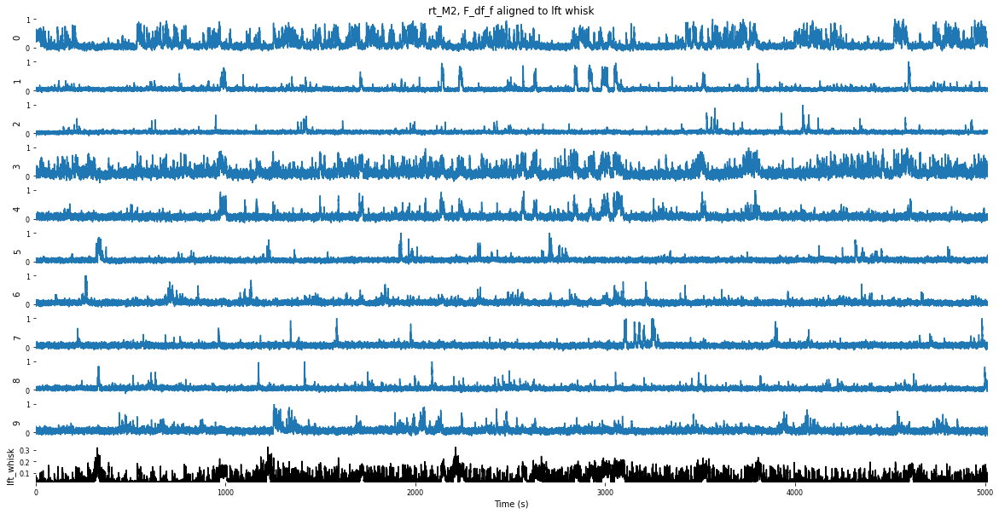

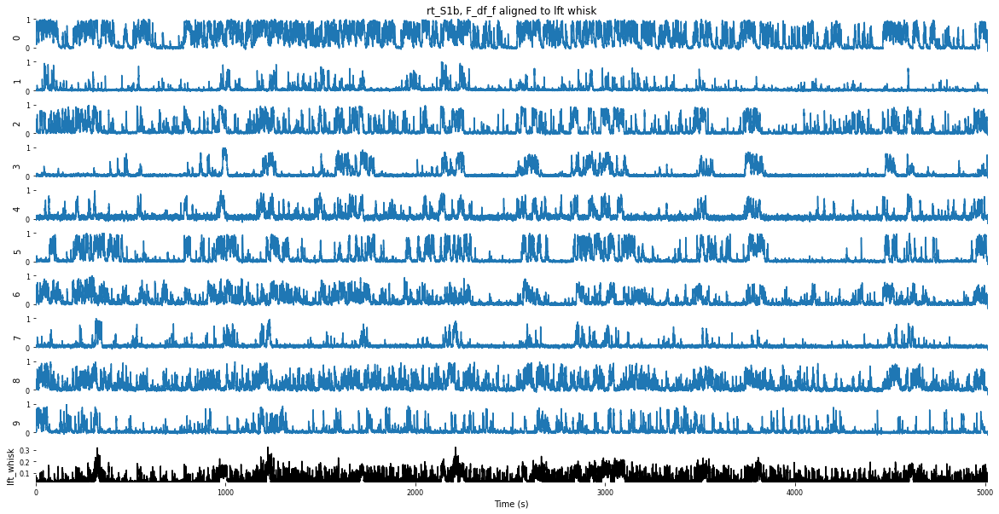

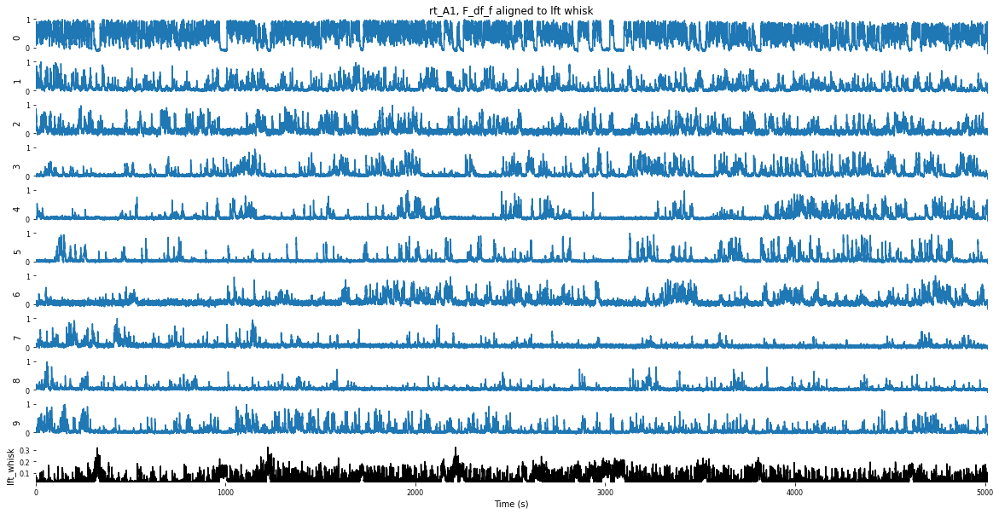

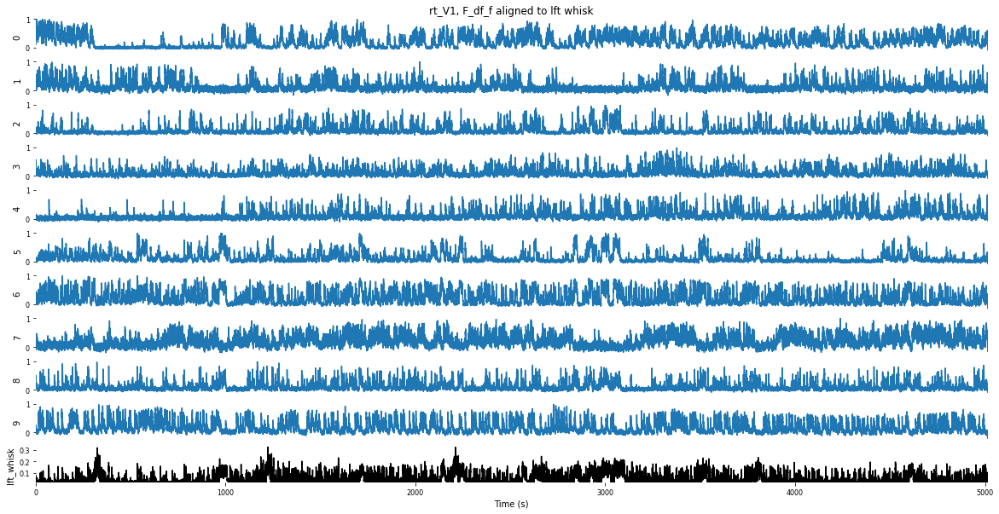

In [11]:
#test plot 2P traces and left whisker
import math as m

fig = plt.figure(figsize=(10,6))

cell_start=int(input("Cell start?"))
cell_stop=int(input("Cell stop?"))
y_min=0
y_max=0
#cell_start=30
#cell_stop=40
cell_range=cell_stop-cell_start
x_values=np.linspace(0,dur[0],num=int(m.floor(dur[0]*rate)))
x_val_t=ops['nframes']/ops['fs']

for k in range(0,len(roi_names)-1):
    i=0
    j=1
    
    fig = plt.figure(figsize=(20,10))
    
    for i in range(cell_range):
        if max(F_df_iscell_norm[k,i+cell_start])>y_max:
            y_max=max(F_df_iscell_norm[k,i+cell_start])
        if min(F_df_iscell_norm[k,i+cell_start])<y_min:
            y_min=min(F_df_iscell_norm[k,i])

    for i in range(cell_range):
        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        #axj.get_yaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        axj.set_ylabel(i+cell_start)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_iscell_norm[k,i+cell_start])
        if i == cell_start:
            plt.title(roi_names[k] + ", F_df_f aligned to lft whisk")
        j=j+1
        #print(j)

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(lft_whisk_dwnsamp),max(lft_whisk_dwnsamp))
    axj.set_ylabel('lft_whisk')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, lft_whisk_dwnsamp, color='k')
    #plt.plot(x_values, trunc_lft_whisk_dwnsamp, color='k')

    plt.savefig(save_paths[k]+'/'+roi_names[k]+'_pick_n_iscell_traces_lft_whisk_align.png', dpi=300, bbox_inches='tight')

In [12]:
#Switch to pandas dataframes
F_df_frame_list=[]
behav_arr_list=[]
behav_corr_list=[]
behav_corr_frame_list=[]
behav_frame_list=[]
F_df_behav_frame_list=[]

norm_set=input("Do you want to use normalized df/f (Yes/No)?")
for i in range(0,len(roi_names)-1):
    if norm_set=="Yes":
        F_df_frame=pd.DataFrame(F_df_iscell_norm[i,0:int(ncells[i]),:]).T
    else:
        F_df_frame=pd.DataFrame(F_df_iscell_upsamp[i,0:int(ncells[i]),:]).T

    F_df_frame.index.name='cell #'; F_df_frame.columns.name='Timepoints at '+ str(rate)
    F_df_frame_list.append(F_df_frame)
    print("2P dataframe shape is:",F_df_frame.shape)

    behav=['lft_whisk','rt_whisk','lft_ppl','rt_ppl','walk']
    behav_arr=np.zeros((len(behav),F_df_iscell_upsamp.shape[2]))
    print("Behavioral array shape is:", behav_arr.shape)

    behav_arr[0,:]=lft_whisk_dwnsamp[:,0]
    behav_arr[1,:]=rt_whisk_dwnsamp[:,0]
    behav_arr[2,:]=lft_ppl_upsamp[:,0]
    behav_arr[3,:]=rt_ppl_upsamp[:,0]
    behav_arr[4,:]=walk_dwnsamp[:,0]
    
    behav_arr_list.append(behav_arr)

    behav_frame=pd.DataFrame(behav_arr,index=behav).T
    behav_frame_list.append(behav_frame)
    print("Behavioral dataframe shape is:",behav_frame.shape)

    #compute correlations of behavior and 2P data
    lft_whisk_corr=F_df_frame_list[i].corrwith(behav_frame['lft_whisk'])
    rt_whisk_corr=F_df_frame_list[i].corrwith(behav_frame['rt_whisk'])
    lft_ppl_corr=F_df_frame_list[i].corrwith(behav_frame['lft_ppl'])
    rt_ppl_corr=F_df_frame_list[i].corrwith(behav_frame['rt_ppl'])
    walk_corr=F_df_frame_list[i].corrwith(behav_frame['walk'])

    behav_corr=np.zeros((int(ncells[i]),5))
    behav_corr[:,0]=lft_whisk_corr[:]
    behav_corr[:,1]=rt_whisk_corr[:]
    behav_corr[:,2]=lft_ppl_corr[:]
    behav_corr[:,3]=rt_ppl_corr[:]
    behav_corr[:,4]=walk_corr[:]
    behav_corr_list.append(behav_corr)

    behav_corr_frame=pd.DataFrame(behav_corr, columns=behav)
    behav_corr_frame_list.append(behav_corr_frame)
    behav_corr_frame

    F_df_behav_frame=pd.merge(behav_corr_frame,F_df_frame.T, left_index=True, right_index=True)
    F_df_behav_frame_list.append(F_df_behav_frame)
    print("Success!")

Do you want to use normalized df/f (Yes/No)? Yes


2P dataframe shape is: (50144, 257)
Behavioral array shape is: (5, 50144)
Behavioral dataframe shape is: (50144, 5)
Success!
2P dataframe shape is: (50144, 279)
Behavioral array shape is: (5, 50144)
Behavioral dataframe shape is: (50144, 5)
Success!
2P dataframe shape is: (50144, 449)
Behavioral array shape is: (5, 50144)
Behavioral dataframe shape is: (50144, 5)
Success!
2P dataframe shape is: (50144, 387)
Behavioral array shape is: (5, 50144)
Behavioral dataframe shape is: (50144, 5)
Success!


In [52]:
import copy as cp

F_df_lft_whisk_list=[]
F_df_rt_whisk_list=[]
F_df_lft_ppl_list=[]
F_df_rt_ppl_list=[]
F_df_walk_list=[]
cell_loc_real_frame_list=[]
behav_corr_cell_loc_frame_list=[]
cell_loc_yflip_scale_frame_list=[]
behav_corr_cell_loc_yflip_scale_frame_list=[]

bcloc_lft_whisk_sort_list=[]
bcloc_rt_whisk_sort_list=[]
bcloc_lft_ppl_sort_list=[]
bcloc_rt_ppl_sort_list=[]
bcloc_walk_sort_list=[]

cell_loc=np.zeros((int(len(roi_names)-1),int(max(nROIs)), 2))
cell_loc_real=np.zeros((int(len(roi_names)-1),int(max(ncells)), 2))

for k in range(0,len(roi_names)-1):
    #create dataframes of 2P traces sorted by behavioral correlations
    F_df_lft_whisk=F_df_behav_frame_list[k].sort_values(by=['lft_whisk'])
    F_df_rt_whisk=F_df_behav_frame_list[k].sort_values(by=['rt_whisk'])
    F_df_lft_ppl=F_df_behav_frame_list[k].sort_values(by=['lft_ppl'])
    F_df_rt_ppl=F_df_behav_frame_list[k].sort_values(by=['rt_ppl'])
    F_df_walk=F_df_behav_frame_list[k].sort_values(by=['walk'])
    
    F_df_lft_whisk_list.append(F_df_lft_whisk)
    F_df_rt_whisk_list.append(F_df_rt_whisk)
    F_df_lft_ppl_list.append(F_df_lft_ppl)
    F_df_rt_ppl_list.append(F_df_rt_ppl)
    F_df_walk_list.append(F_df_walk)
    
    #create single array map of ROI locations
    stat = np.load(paths[k] + '/stat.npy', allow_pickle=True)
    
    for n in range(0,int(nROIs[k])):
        stat_array=np.array(stat[n]['med'])
        cell_loc[k,n,0]=stat_array[0]
        cell_loc[k,n,1]=stat_array[1]

    #create cell location map for "real" cells
    i=0
    j=0

    for i in range(0,int(nROIs[k])):
        if iscell[k,i,0]==1:
            cell_loc_real[k,j,0]=cell_loc[k,i,0]
            cell_loc_real[k,j,1]=cell_loc[k,i,1]
            j=j+1

    cell_loc_real_frame=pd.DataFrame(cell_loc_real[k,:,:])
    cell_loc_real_frame_list.append(cell_loc_real_frame)
    
    cell_loc_yflip=cp.copy(cell_loc_real)
    cell_loc_yflip[k,:,1]=max(cell_loc_yflip[k,:,1])-cell_loc_yflip[k,:,1]
    cell_loc_yflip_scale=cp.copy(cell_loc_yflip)
    cell_loc_yflip_scale[k,:,0]=cell_loc_yflip_scale[k,:,0]*res[k]
    cell_loc_yflip_scale[k,:,1]=cell_loc_yflip_scale[k,:,1]*res[k]
    
    cell_loc_yflip_scale_frame=pd.DataFrame(cell_loc_yflip_scale[k,:,:])
    cell_loc_yflip_scale_frame_list.append(cell_loc_yflip_scale[k,:,:])

    behav_corr_cell_loc_frame=pd.merge(behav_corr_frame_list[k], cell_loc_real_frame, left_index=True,
                                      right_index=True)
    behav_corr_cell_loc_frame_list.append(behav_corr_cell_loc_frame)
    
    behav_corr_cell_loc_yflip_scale_frame=pd.merge(behav_corr_frame_list[k], cell_loc_yflip_scale_frame, left_index=True,
                                      right_index=True)
    behav_corr_cell_loc_yflip_scale_frame_list.append(behav_corr_cell_loc_yflip_scale_frame)

for k in range(0,len(roi_names)-1):    
    
    bcloc_lft_whisk_sort=behav_corr_cell_loc_frame_list[k].sort_values(by=['lft_whisk'])
    bcloc_rt_whisk_sort=behav_corr_cell_loc_frame_list[k].sort_values(by=['rt_whisk'])
    bcloc_lft_ppl_sort=behav_corr_cell_loc_frame_list[k].sort_values(by=['lft_ppl'])
    bcloc_rt_ppl_sort=behav_corr_cell_loc_frame_list[k].sort_values(by=['rt_ppl'])
    bcloc_walk_sort=behav_corr_cell_loc_frame_list[k].sort_values(by=['walk'])
    
    bcloc_lft_whisk_sort_list.append(bcloc_lft_whisk_sort)
    bcloc_rt_whisk_sort_list.append(bcloc_rt_whisk_sort)
    bcloc_lft_ppl_sort_list.append(bcloc_lft_ppl_sort)
    bcloc_rt_ppl_sort_list.append(bcloc_rt_ppl_sort)
    bcloc_walk_sort_list.append(bcloc_walk_sort)

    print("Success!")

Success!
Success!
Success!
Success!


What z-score cutoff would you like to use? 1.5
How many x bins do you want? 10
How many y bins do you want 10


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:129: RuntimeWarning: invalid value encountered in true_divide
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:178: RuntimeWarning: invalid value encountered in true_divide


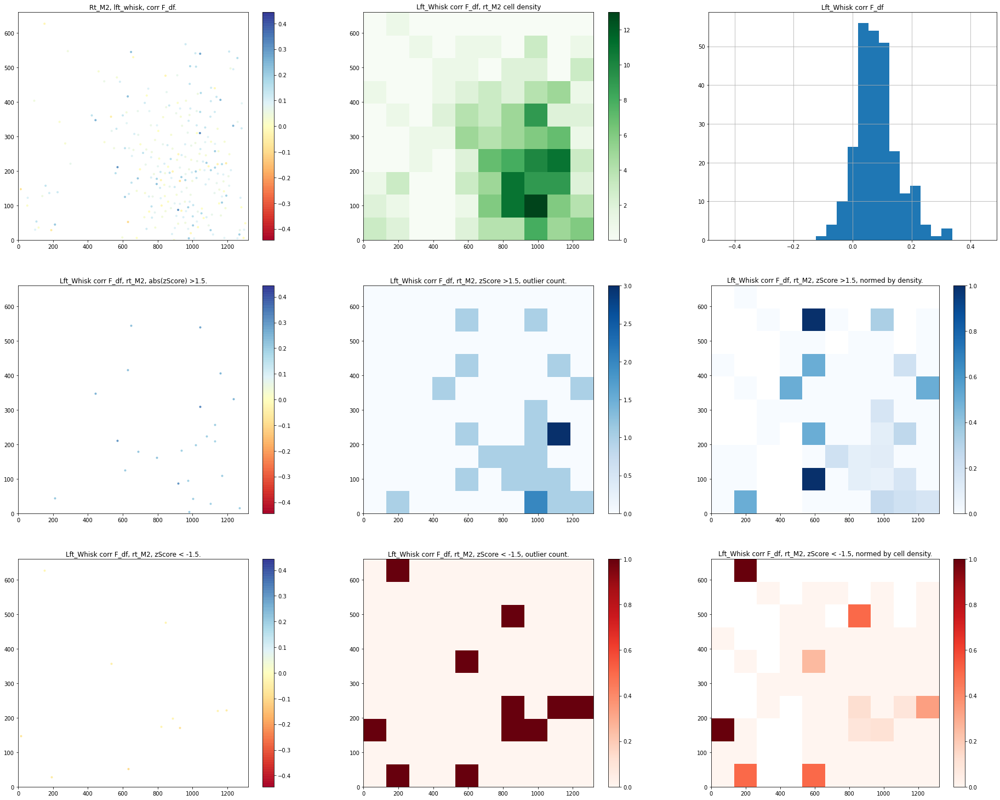

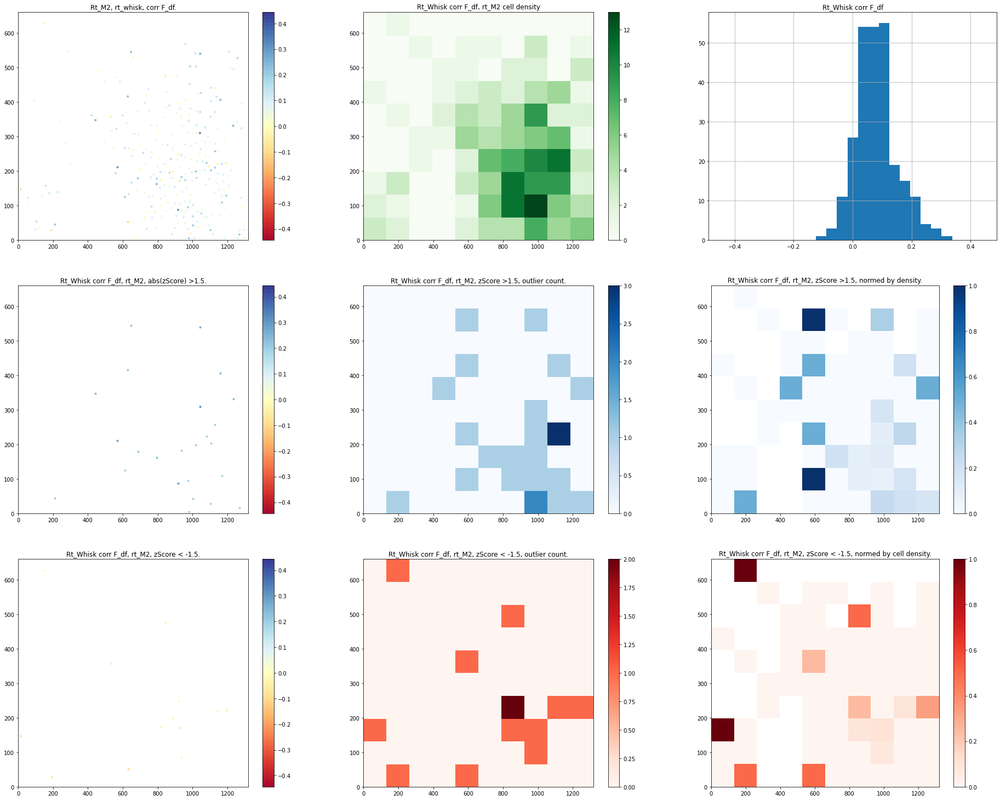

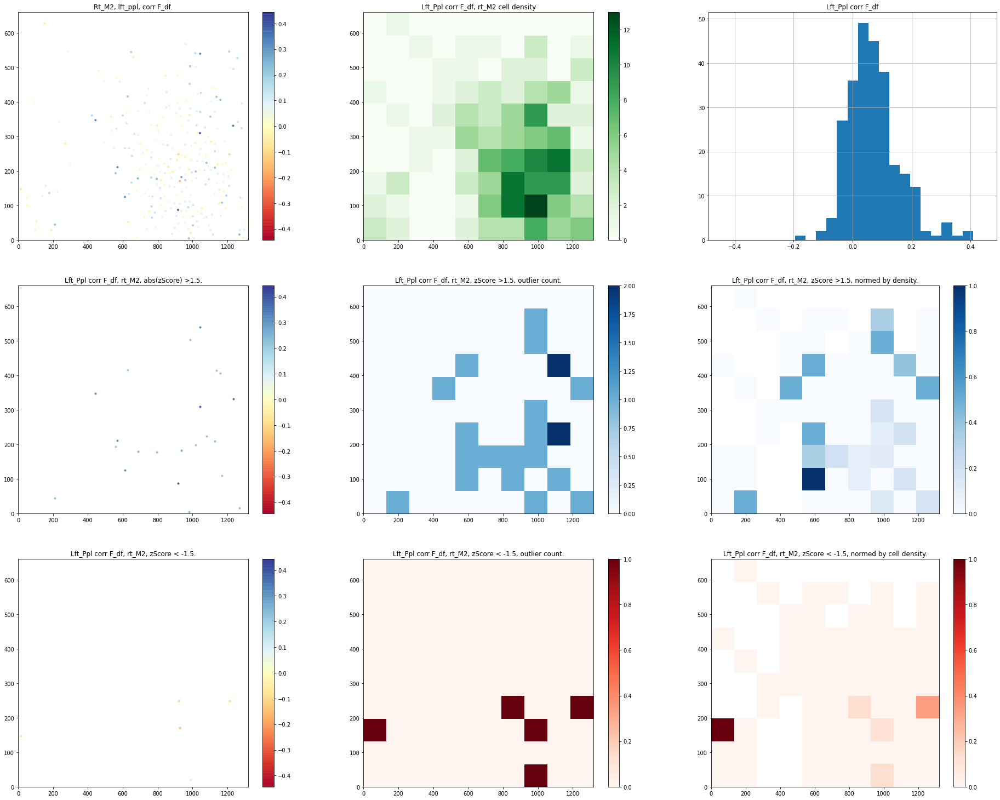

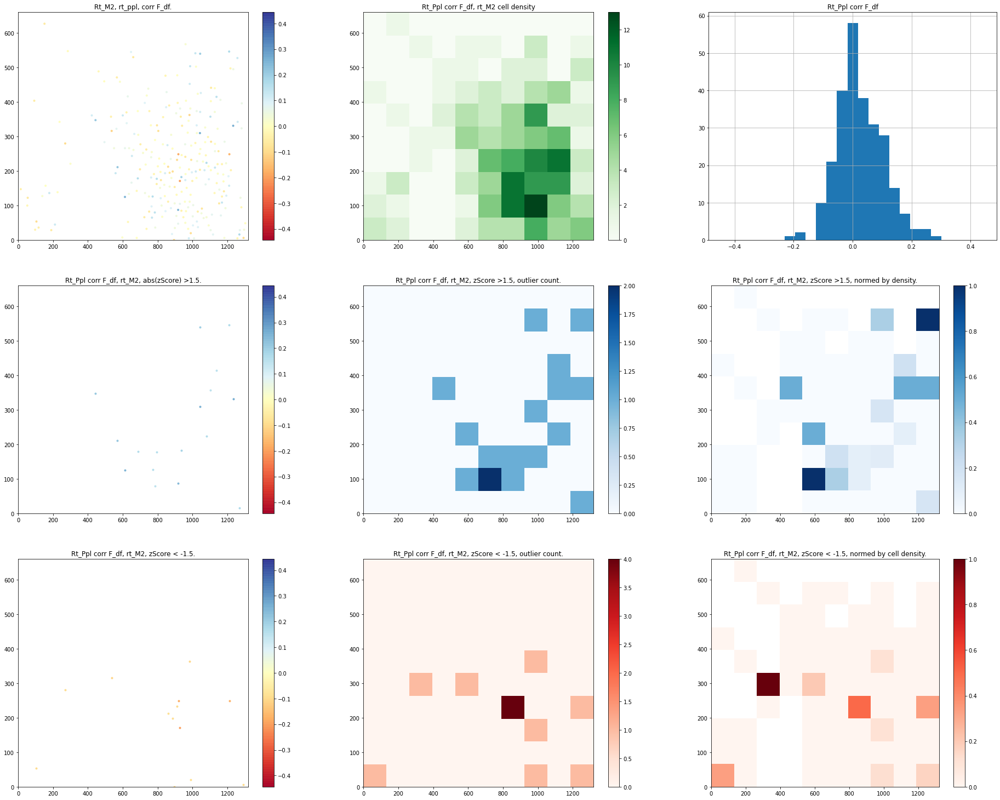

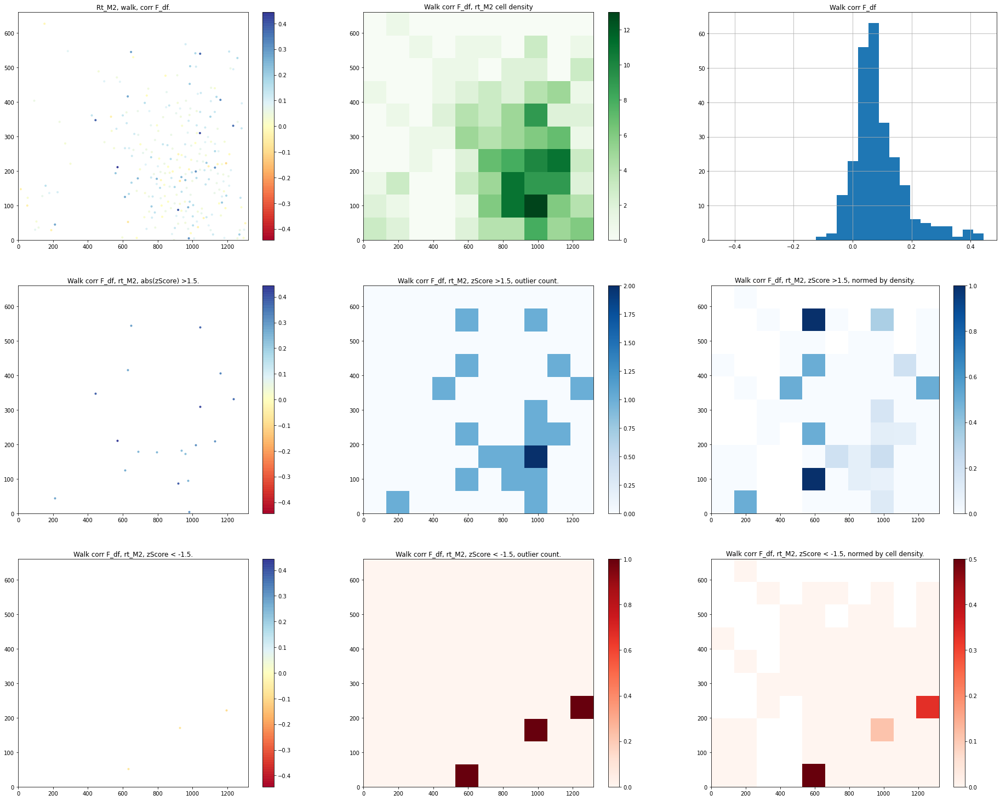

...

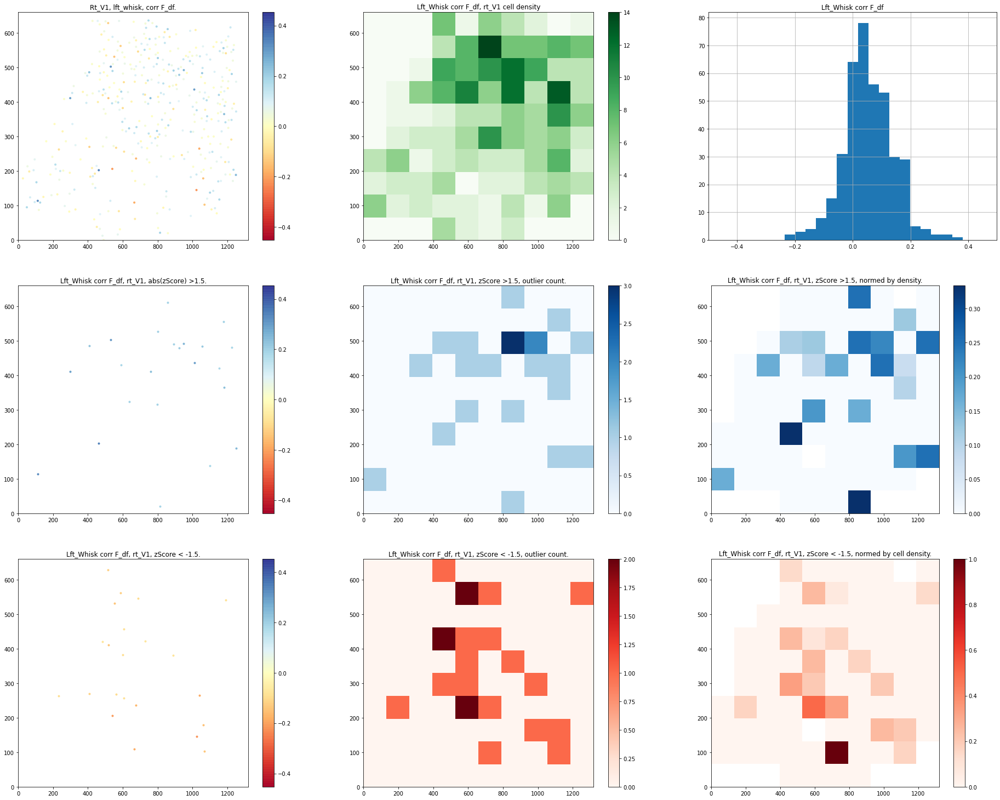

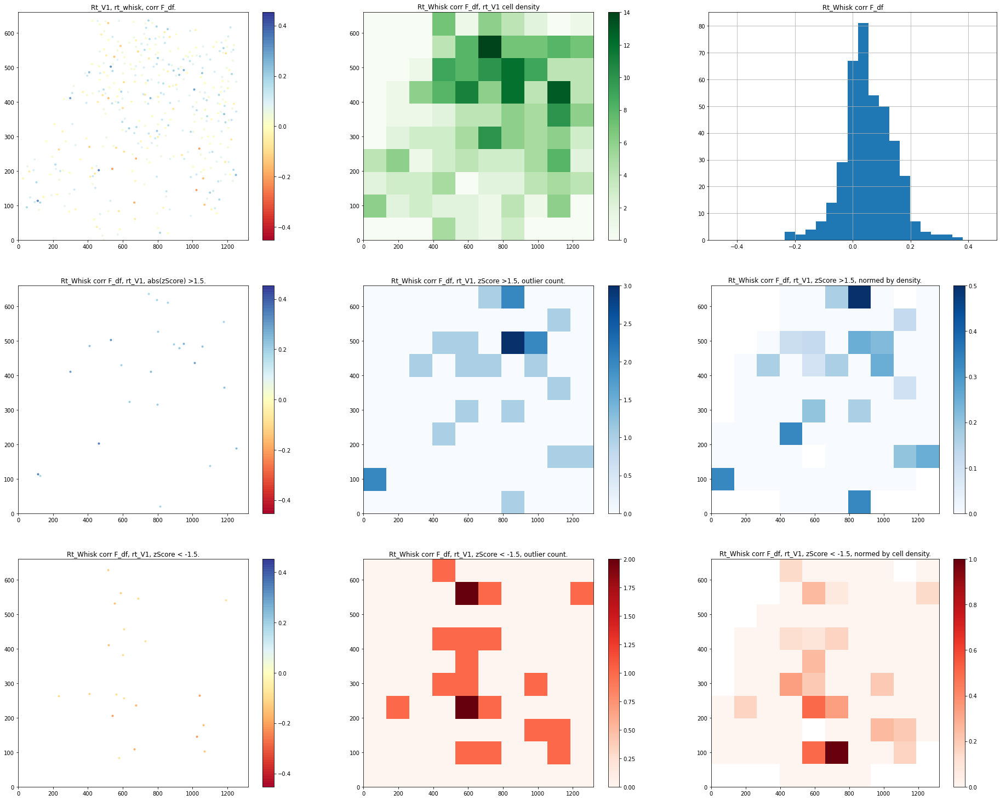

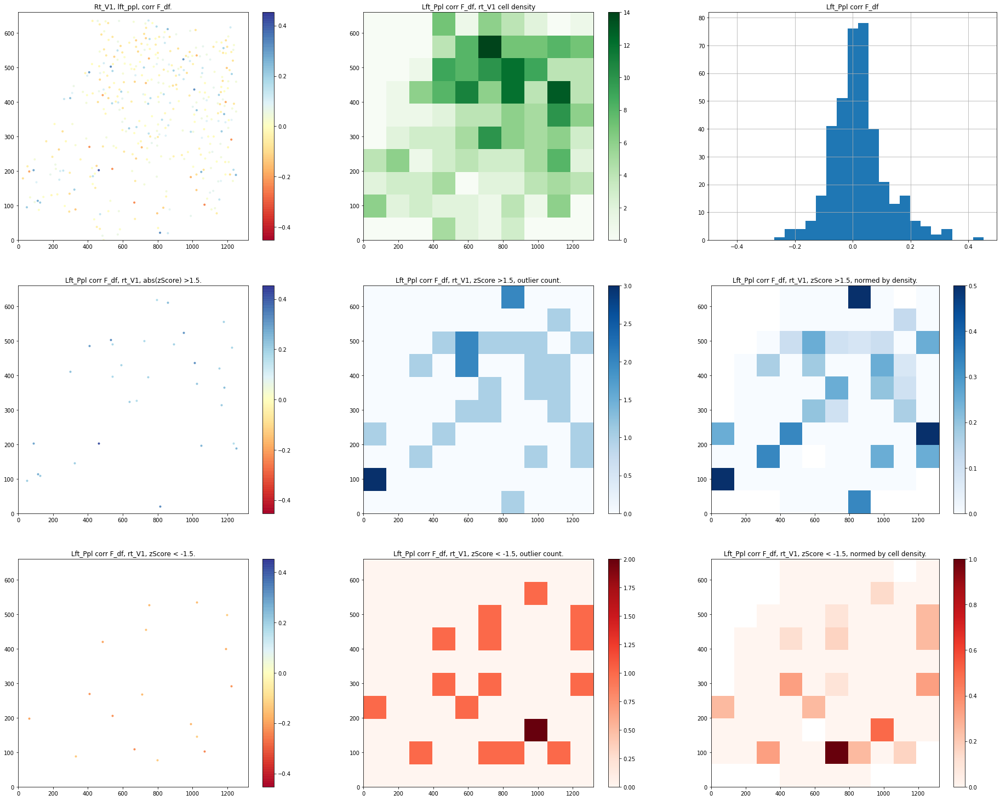

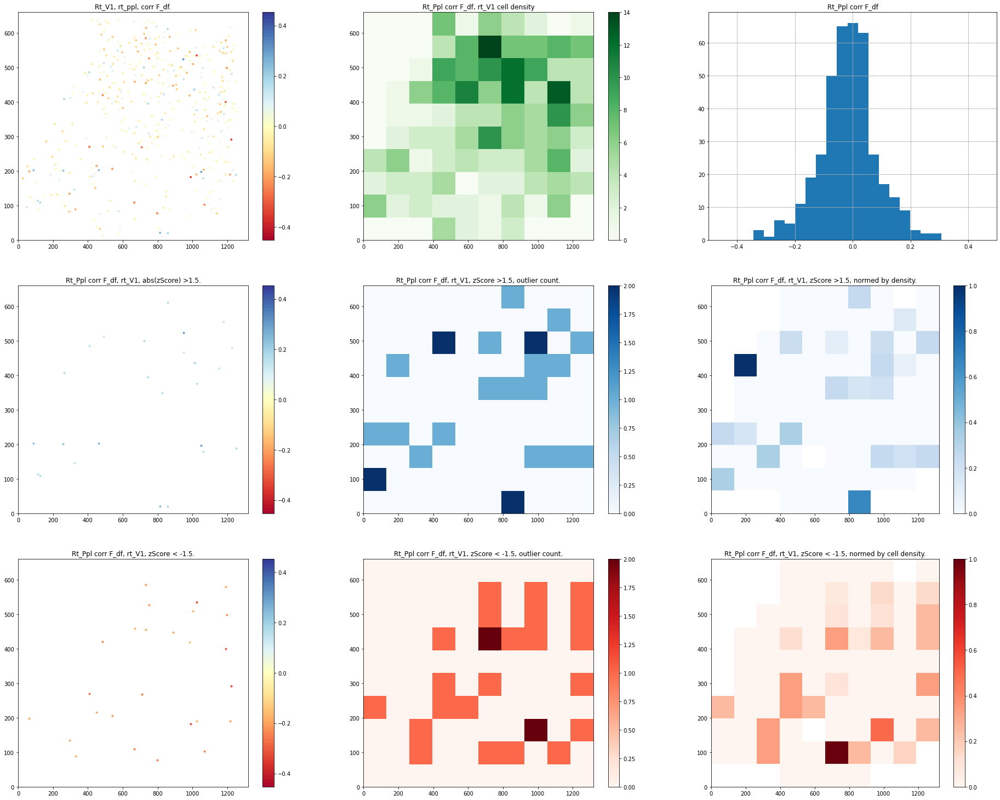

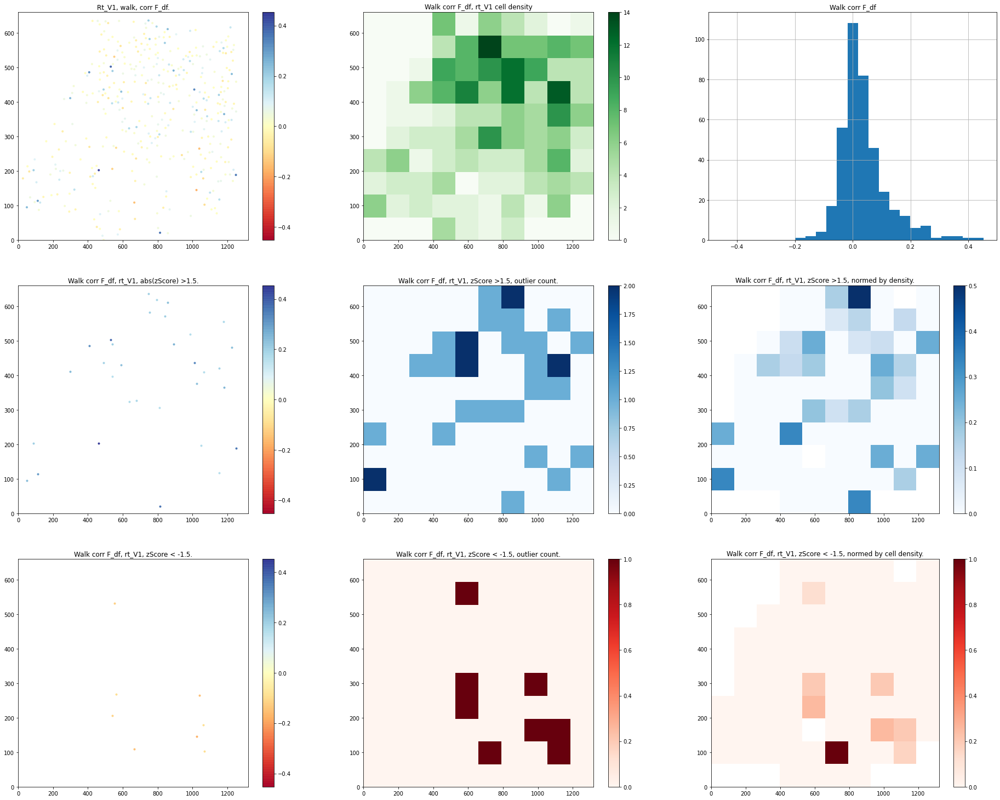

In [14]:
#Make and save figure of 2P correlations with behavior, with indexed cell maps and histograms

from matplotlib import cm
from matplotlib.colors import Normalize
import seaborn as sns
from scipy.stats import gaussian_kde

z_cutOff=input("What z-score cutoff would you like to use?")
z_cutOff=float(z_cutOff)
    
x_bins=input("How many x bins do you want?")
y_bins=input("How many y bins do you want")
x_bins=int(x_bins)
y_bins=int(y_bins)

cell_loc_zCut_pos=cp.copy(cell_loc_yflip_scale)
cell_loc_zCut_neg=cp.copy(cell_loc_yflip_scale)

for k in range(0,len(roi_names)-1):
    for i in range(0,len(behav)):
        j=0
        for z in range(0,int(nROIs[k])):
            if iscell[k,z,0]==1:
                cell_loc_real[k,j,0]=cell_loc[k,z,0]
                cell_loc_real[k,j,1]=cell_loc[k,z,1]
                j=j+1

        cell_loc_real_frame=pd.DataFrame(cell_loc_real[k,:,:])
        cell_loc_real_frame_list.append(cell_loc_real_frame)

        cell_loc_yflip=cp.copy(cell_loc_real)
        cell_loc_yflip[k,:,1]=max(cell_loc_yflip[k,:,1])-cell_loc_yflip[k,:,1]
        cell_loc_yflip_scale=cp.copy(cell_loc_yflip)
        cell_loc_yflip_scale[k,:,0]=cell_loc_yflip_scale[k,:,0]*res[k]
        cell_loc_yflip_scale[k,:,1]=cell_loc_yflip_scale[k,:,1]*res[k]
        cell_loc_zCut_pos=cp.copy(cell_loc_yflip_scale)
        cell_loc_zCut_neg=cp.copy(cell_loc_yflip_scale)
        
        #make rotated and scaled map of all real cells
        norm=Normalize(vmin=-1.,vmax=1.)

        #newschool cell, density, and normed corr plots
        super_min_corr=0
        super_max_corr=0

        for l in range(0,len(behav)):
            if max(bcloc_lft_whisk_sort_list[k][behav[l]])>super_max_corr:
                super_max_corr=max(bcloc_lft_whisk_sort_list[k][behav[l]])
            if min(bcloc_lft_whisk_sort_list[k][behav[l]])<super_max_corr:
                super_min_corr=min(bcloc_lft_whisk_sort_list[k][behav[l]])

        if super_max_corr>super_min_corr*(-1):
            corr_abs_range=super_max_corr
        else:
            corr_abs_range=super_min_corr*(-1)

        fig = plt.figure(figsize=(32,26))
        #fig.set_tight_layout(True)

        min_corr=min(bcloc_lft_whisk_sort_list[k][behav[i]])
        max_corr=max(bcloc_lft_whisk_sort_list[k][behav[i]])

        curr_behav_zscore=scipy.stats.zscore(bcloc_lft_whisk_sort_list[k][behav[i]], axis=0, ddof=0, nan_policy='propagate')

        t=np.arange(ncells[k])
        t_indexed=bcloc_lft_whisk_sort_list[k][behav[i]]
        t=np.array(t_indexed)
        #print(t.shape)

        #make 3 x 3 output grid of plots:

        #plot 1, all cells with behavioral corr indicated by color bar
        axa = fig.add_subplot(3,3,1)
        plt.scatter(cell_loc_yflip_scale[k,0:int(ncells[k]),0], cell_loc_yflip_scale[k,0:int(ncells[k]),1], vmin=-corr_abs_range,
                    vmax=corr_abs_range, c=t,cmap='RdYlBu', alpha=0.95, marker='.')
        plt.xlim(0,x_size[k])
        plt.ylim(0,y_size[k])
        plt.title(str(roi_names[k]).title()+', '+str(behav[i])+', corr F_df.')
        plt.colorbar()

        #plot 2, cell density shown as 2d histogram
        axb = fig.add_subplot(3,3,2)
        h_cells=plt.hist2d(cell_loc_yflip_scale[k,0:int(ncells[k]),0], cell_loc_yflip_scale[k,0:int(ncells[k]),1],bins=(x_bins, y_bins),
                           range=((0,x_size[k]),(0,y_size[k])), cmap=plt.cm.Greens)
        plt.xlim(0,x_size[k])
        plt.ylim(0,y_size[k])
        plt.title(str(behav[i]).title()+" corr F_df, "+roi_names[k]+" cell density")
        plt.colorbar()

        #plot 3, histogram of behavioral corrs for all cells
        axc = fig.add_subplot(3,3,3)
        behav_corr_frame_list[k][behav[i]].hist(bins=25, range=(-corr_abs_range,corr_abs_range))
        plt.title(str(behav[i]).title()+ " corr F_df")

        #plot 4, map of all cells with corr z-score exceeding threshold (i.e. positive outliers)
        axd = fig.add_subplot(3,3,4)

        for j in range(0,int(ncells[k])):
                if curr_behav_zscore[j]>z_cutOff:
                    plt.scatter(cell_loc_yflip_scale[k,j,0], cell_loc_yflip_scale[k,j,1], vmin=-corr_abs_range, 
                                vmax=corr_abs_range, c=t[j], cmap='RdYlBu', alpha=0.95, marker='.')
        plt.xlim(0,x_size[k])
        plt.ylim(0,y_size[k])
        plt.title(str(behav[i]).title()+" corr F_df, "+roi_names[k]+", abs(zScore) >"+str(z_cutOff)+".")
        plt.colorbar()

        #plot 5, hist2d density positive outliers
        axe = fig.add_subplot(3,3,5)

        for j in range(0,int(ncells[k])):
            if cell_loc_zCut_pos[k,j,0]==0:
                cell_loc_zCut_pos[k,j,0]=-44444
                cell_loc_zCut_pos[k,j,1]=-44444
            if cell_loc_zCut_pos[k,j,1]==0:
                cell_loc_zCut_pos[k,j,0]=-44444
                cell_loc_zCut_pos[k,j,1]=-44444
            if curr_behav_zscore[j]<z_cutOff:
                cell_loc_zCut_pos[k,j,0]=-99999
                cell_loc_zCut_pos[k,j,1]=-99999
        h_pos=plt.hist2d(cell_loc_zCut_pos[k,0:int(ncells[k]),0], cell_loc_zCut_pos[k,0:int(ncells[k]),1], bins=(x_bins, y_bins),
                         range=((0,x_size[k]),(0,y_size[k])), cmap=plt.cm.Blues)
        plt.xlim(0,x_size[k])
        plt.ylim(0,y_size[k])            
        plt.title(str(behav[i]).title()+" corr F_df, "+roi_names[k]+", zScore >"+str(z_cutOff)+", outlier count.")
        plt.colorbar()

        #plot 6, hist2d density positive outliers normalized to cell count per bin
        axf = fig.add_subplot(3,3,6)
        h_pos_norm=h_pos[0]/h_cells[0]

        #function to rotate matrix counterclockwise 90 degrees
        def rotate_matrix( m ):
            return [[m[j][i] for j in range(len(m))] for i in range(len(m[0])-1,-1,-1)]

        h_pos_norm=rotate_matrix(h_pos_norm)

        plt.imshow(h_pos_norm,cmap="Blues",extent=[0,x_size[k],0,y_size[k]])
        plt.title(str(behav[i]).title()+" corr F_df, "+roi_names[k]+", zScore >"+str(z_cutOff)+", normed by density.")
        x0,x1 = axf.get_xlim()
        y0,y1 = axf.get_ylim()
        axf.set_aspect(abs(x1-x0)/abs(y1-y0))
        plt.colorbar()

        #plot 7, map of all cells with corr z-score less than negative threshold (i.e. negative outliers) 
        axg = fig.add_subplot(3,3,7)  

        for j in range(0,int(ncells[k])):
                if curr_behav_zscore[j]<z_cutOff*(-1):
                    plt.scatter(cell_loc_yflip_scale[k,j,0], cell_loc_yflip_scale[k,j,1], vmin=-corr_abs_range, 
                                vmax=corr_abs_range, c=t[j], cmap='RdYlBu', alpha=0.95, marker='.')
        plt.xlim(0,x_size[k])
        plt.ylim(0,y_size[k])
        plt.title(str(behav[i]).title()+" corr F_df, "+roi_names[k]+", zScore < -"+str(z_cutOff)+".")
        plt.colorbar()

        #plot 8, hist2d density negative outliers
        axh = fig.add_subplot(3,3,8)

        for j in range(0,int(ncells[k])):
            if cell_loc_zCut_neg[k,j,0]==0:
                cell_loc_zCut_neg[k,j,0]=-44444
                cell_loc_zCut_neg[k,j,1]=-44444
            if cell_loc_zCut_neg[k,j,1]==0:
                cell_loc_zCut_neg[k,j,0]=-44444
                cell_loc_zCut_neg[k,j,1]=-44444
            if curr_behav_zscore[j]>z_cutOff*(-1):
                cell_loc_zCut_neg[k,j,0]=-99999
                cell_loc_zCut_neg[k,j,1]=-99999
        h_neg=plt.hist2d(cell_loc_zCut_neg[k,0:int(ncells[k]),0], cell_loc_zCut_neg[k,0:int(ncells[k]),1], bins=(x_bins, y_bins),
                         range=((0,x_size[k]),(0,y_size[k])), cmap=plt.cm.Reds)
        plt.xlim(0,x_size[k])
        plt.ylim(0,y_size[k])
        plt.title(str(behav[i]).title()+" corr F_df, "+roi_names[k]+", zScore < -"+str(z_cutOff)+", outlier count.")
        plt.colorbar()

        #plot 9, hist2d density positive outliers normalized to cell count per bin
        axi = fig.add_subplot(3,3,9)
        h_neg_norm=h_neg[0]/h_cells[0]

        h_neg_norm=rotate_matrix(h_neg_norm)

        plt.imshow(h_neg_norm,cmap="Reds",extent=[0,x_size[k],0,y_size[k]])
        plt.title(str(behav[i]).title()+" corr F_df, "+roi_names[k]+", zScore < -"+str(z_cutOff)+", normed by cell density.")
        x0,x1 = axi.get_xlim()
        y0,y1 = axi.get_ylim()
        axi.set_aspect(abs(x1-x0)/abs(y1-y0))
        plt.colorbar()


        plt.savefig(save_paths[k]+ '/' + str(roi_names[k])+'_'+ str(behav[i]) + '_corr_cell_map_hist.png', dpi=300, bbox_inches='tight')  

In [15]:
#Sort dataframe of 2P traces by correlation with all behavioral variables

from scipy.stats import percentileofscore
import math as m

#Left whisk
F_df_lft_whisk_sort_list=[]
lft_whisk_sorted_traces_list=[]
lft_whisk_indices_list=[]
F_df_lft_whisk_perc_list=[]

for k in range(0,len(roi_names)-1):
    F_df_lft_whisk_perc=np.zeros(int(ncells[k]))
    F_df_lft_whisk_sort=F_df_behav_frame_list[k].sort_values(by=['lft_whisk'])
    F_df_lft_whisk_sort_list.append(F_df_lft_whisk_sort)

    for i in range(0,int(ncells[k])):
        F_df_lft_whisk_perc[i]=percentileofscore(F_df_lft_whisk_sort['lft_whisk'], F_df_lft_whisk_sort_list[k].iloc[i,0])
        
    F_df_lft_whisk_perc_list.append(F_df_lft_whisk_perc)
    lft_whisk_sorted_traces=F_df_lft_whisk_sort_list.index
    F_df_lft_whisk_sort_list[k].set_index=(['cell#',pd.Index(F_df_lft_whisk_perc)])

    lft_whisk_sorted_traces_list.append(lft_whisk_sorted_traces)

    lft_whisk_indices=[np.array(F_df_lft_whisk_list[k].index),np.array(F_df_lft_whisk_perc)]
    lft_whisk_indices_list.append(lft_whisk_indices)
    F_df_lft_whisk_sort_list[k].set_index=([lft_whisk_indices])

#Rt whisk
F_df_rt_whisk_sort_list=[]
rt_whisk_sorted_traces_list=[]
rt_whisk_indices_list=[]
F_df_rt_whisk_perc_list=[]

for k in range(0,len(roi_names)-1):
    F_df_rt_whisk_perc=np.zeros(int(ncells[k]))
    F_df_rt_whisk_sort=F_df_behav_frame_list[k].sort_values(by=['rt_whisk'])
    F_df_rt_whisk_sort_list.append(F_df_rt_whisk_sort)

    for i in range(0,int(ncells[k])):
        F_df_rt_whisk_perc[i]=percentileofscore(F_df_rt_whisk_sort['rt_whisk'], F_df_rt_whisk_sort_list[k].iloc[i,0])
        
    F_df_rt_whisk_perc_list.append(F_df_rt_whisk_perc)
    rt_whisk_sorted_traces=F_df_rt_whisk_sort_list.index
    F_df_rt_whisk_sort_list[k].set_index=(['cell#',pd.Index(F_df_rt_whisk_perc)])

    rt_whisk_sorted_traces_list.append(rt_whisk_sorted_traces)

    rt_whisk_indices=[np.array(F_df_rt_whisk_list[k].index),np.array(F_df_rt_whisk_perc)]
    rt_whisk_indices_list.append(rt_whisk_indices)
    F_df_rt_whisk_sort_list[k].set_index=([rt_whisk_indices])    

#Left PPL
F_df_lft_ppl_sort_list=[]
lft_ppl_sorted_traces_list=[]
lft_ppl_indices_list=[]
F_df_lft_ppl_perc_list=[]

for k in range(0,len(roi_names)-1):
    F_df_lft_ppl_perc=np.zeros(int(ncells[k]))
    F_df_lft_ppl_sort=F_df_behav_frame_list[k].sort_values(by=['lft_ppl'])
    F_df_lft_ppl_sort_list.append(F_df_lft_ppl_sort)

    for i in range(0,int(ncells[k])):
        F_df_lft_ppl_perc[i]=percentileofscore(F_df_lft_ppl_sort['lft_ppl'], F_df_lft_ppl_sort_list[k].iloc[i,0])
        
    F_df_lft_ppl_perc_list.append(F_df_lft_ppl_perc)
    lft_ppl_sorted_traces=F_df_lft_ppl_sort_list.index
    F_df_lft_ppl_sort_list[k].set_index=(['cell#',pd.Index(F_df_lft_ppl_perc)])

    lft_ppl_sorted_traces_list.append(lft_ppl_sorted_traces)

    lft_ppl_indices=[np.array(F_df_lft_ppl_list[k].index),np.array(F_df_lft_ppl_perc)]
    lft_ppl_indices_list.append(lft_ppl_indices)
    F_df_lft_ppl_sort_list[k].set_index=([lft_ppl_indices])    
    
#Rt PPL
F_df_rt_ppl_sort_list=[]
rt_ppl_sorted_traces_list=[]
rt_ppl_indices_list=[]
F_df_rt_ppl_perc_list=[]

for k in range(0,len(roi_names)-1):
    F_df_rt_ppl_perc=np.zeros(int(ncells[k]))
    F_df_rt_ppl_sort=F_df_behav_frame_list[k].sort_values(by=['rt_ppl'])
    F_df_rt_ppl_sort_list.append(F_df_rt_ppl_sort)

    for i in range(0,int(ncells[k])):
        F_df_rt_ppl_perc[i]=percentileofscore(F_df_rt_ppl_sort['rt_ppl'], F_df_rt_ppl_sort_list[k].iloc[i,0])
        
    F_df_rt_ppl_perc_list.append(F_df_rt_ppl_perc)
    rt_ppl_sorted_traces=F_df_rt_ppl_sort_list.index
    F_df_rt_ppl_sort_list[k].set_index=(['cell#',pd.Index(F_df_rt_ppl_perc)])

    rt_ppl_sorted_traces_list.append(rt_ppl_sorted_traces)

    rt_ppl_indices=[np.array(F_df_rt_ppl_list[k].index),np.array(F_df_rt_ppl_perc)]
    rt_ppl_indices_list.append(rt_ppl_indices)
    F_df_rt_ppl_sort_list[k].set_index=([rt_ppl_indices])    
    
#Walk
F_df_walk_sort_list=[]
walk_sorted_traces_list=[]
walk_indices_list=[]
F_df_walk_perc_list=[]

for k in range(0,len(roi_names)-1):
    F_df_walk_perc=np.zeros(int(ncells[k]))
    F_df_walk_sort=F_df_behav_frame_list[k].sort_values(by=['walk'])
    F_df_walk_sort_list.append(F_df_walk_sort)

    for i in range(0,int(ncells[k])):
        F_df_walk_perc[i]=percentileofscore(F_df_walk_sort['walk'], F_df_walk_sort_list[k].iloc[i,0])
        
    F_df_walk_perc_list.append(F_df_walk_perc)
    walk_sorted_traces=F_df_walk_sort_list.index
    F_df_walk_sort_list[k].set_index=(['cell#',pd.Index(F_df_walk_perc)])

    walk_sorted_traces_list.append(walk_sorted_traces)

    walk_indices=[np.array(F_df_walk_list[k].index),np.array(F_df_walk_perc)]
    walk_indices_list.append(walk_indices)
    F_df_walk_sort_list[k].set_index=([walk_indices])    
    
print("Success!")

Success!


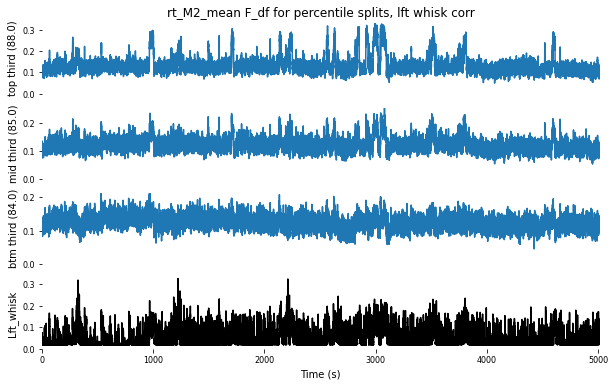

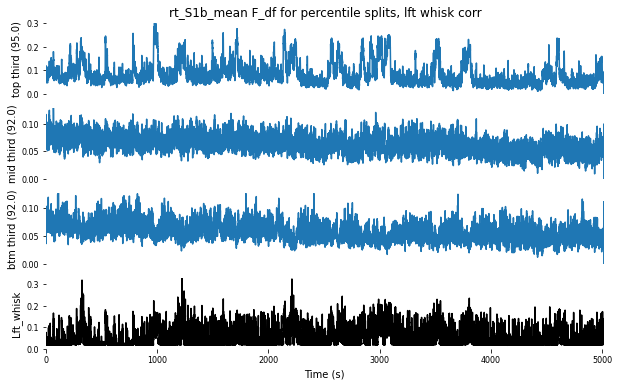

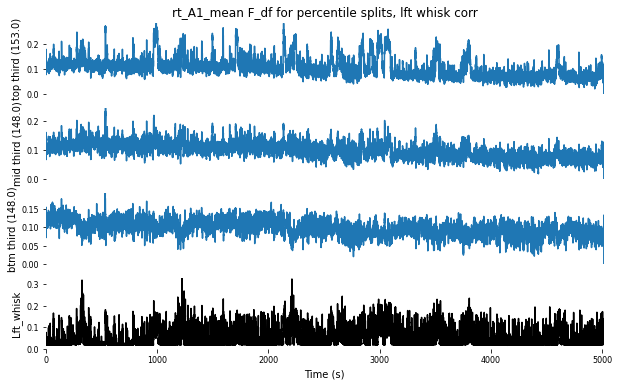

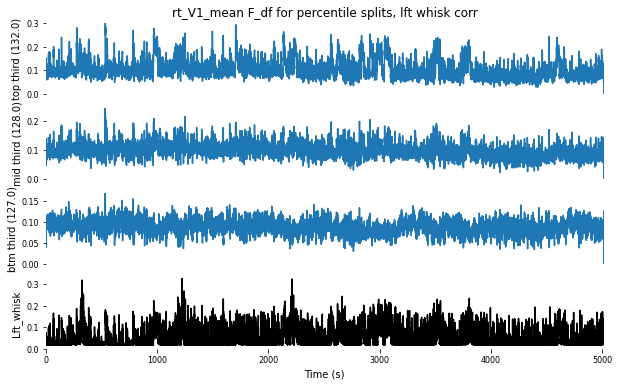

In [16]:
import math as m

#Plot mean traces for top, middle, and bottom third of 2P traces by percentile correlation with left whisk

lft_whisk_btm=np.zeros((len(roi_names)-1,F_df_iscell_upsamp.shape[2]),dtype=float)
lft_whisk_mid=np.zeros((len(roi_names)-1,F_df_iscell_upsamp.shape[2]),dtype=float)
lft_whisk_top=np.zeros((len(roi_names)-1,F_df_iscell_upsamp.shape[2]),dtype=float)

btm_count=np.zeros(len(roi_names)-1)
mid_count=np.zeros(len(roi_names)-1)
top_count=np.zeros(len(roi_names)-1)

for k in range(0,len(roi_names)-1):
    btm_count[k]=0
    mid_count[k]=0
    top_count[k]=0

    for i in F_df_lft_whisk_sort_list[k].index:
        #print(i)
        if F_df_lft_whisk_perc_list[k][i]<=33:
            lft_whisk_btm[k]=lft_whisk_btm[k]+F_df_lft_whisk_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            btm_count[k]=btm_count[k]+1
        elif F_df_lft_whisk_perc_list[k][i]>66:
            lft_whisk_top[k]=lft_whisk_top[k]+F_df_lft_whisk_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            top_count[k]=top_count[k]+1
        else:
            lft_whisk_mid[k]=lft_whisk_mid[k]+F_df_lft_whisk_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            mid_count[k]=mid_count[k]+1

    lft_whisk_btm[k]=lft_whisk_btm[k]/btm_count[k]
    lft_whisk_mid[k]=lft_whisk_mid[k]/mid_count[k]
    lft_whisk_top[k]=lft_whisk_top[k]/top_count[k]

    fig = plt.figure(figsize=(10,6))

    ax0 = fig.add_subplot(4,1,1)
    ax0.get_xaxis().set_visible(False)
    ax0.set_ylim([0,max(lft_whisk_top[k])])
    ax0.set_xlim([0,max(x_values)])
    ax0.set_frame_on(False)
    ax0.set_ylabel('top third ('+str(top_count[k])+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,lft_whisk_top[k])
    plt.title(str(roi_names[k])+'_mean F_df for percentile splits, lft whisk corr')

    ax1 = fig.add_subplot(4,1,2)
    ax1.get_xaxis().set_visible(False)
    ax1.set_ylim([0,max(lft_whisk_mid[k])])
    ax1.set_xlim([0,max(x_values)])
    ax1.set_frame_on(False)
    ax1.set_ylabel('mid third ('+str(mid_count[k])+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,lft_whisk_mid[k])

    ax2 = fig.add_subplot(4,1,3)
    ax2.get_xaxis().set_visible(False)
    #axj.get_yaxis().set_visible(False)
    #ax2.set_xlim(0,x_val_t)
    ax2.set_ylim([0,max(lft_whisk_btm[k])])
    ax2.set_xlim([0,max(x_values)])
    ax2.set_frame_on(False)
    ax2.set_ylabel('btm third ('+str(btm_count[k])+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,lft_whisk_btm[k])

    ax3 = fig.add_subplot(4,1,4)
    #ax3.get_xaxis().set_visible(False)
    #axj.get_yaxis().set_visible(False)
    #ax3.set_xlim(0,x_val_t)
    ax3.set_ylim([0,max(lft_whisk_dwnsamp)])
    ax3.set_xlim([0,max(x_values)])
    ax3.set_frame_on(False)
    ax3.set_ylabel('Lft_whisk')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,lft_whisk_dwnsamp, color='black')
    plt.xlabel('Time (s)')

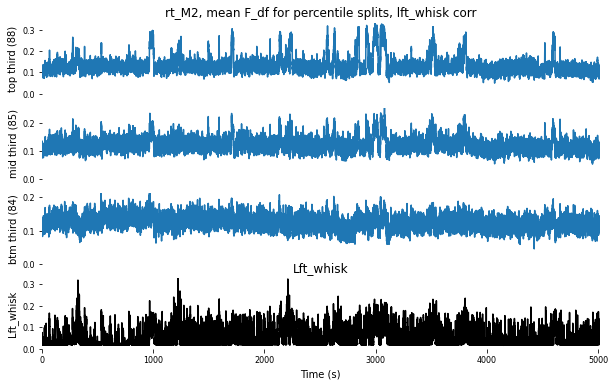

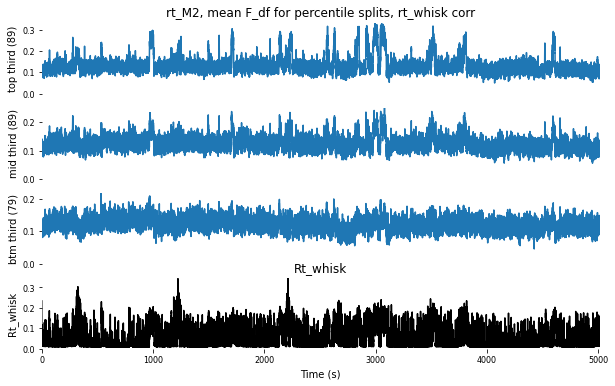

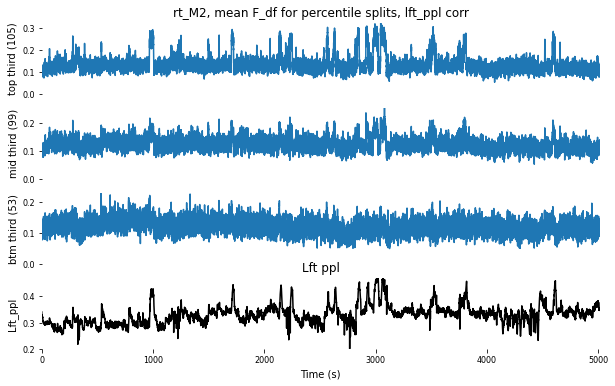

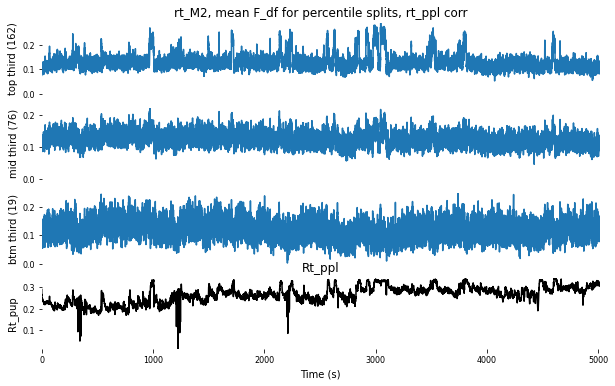

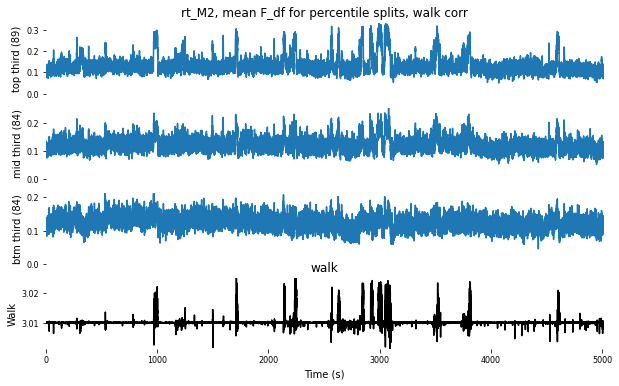

...

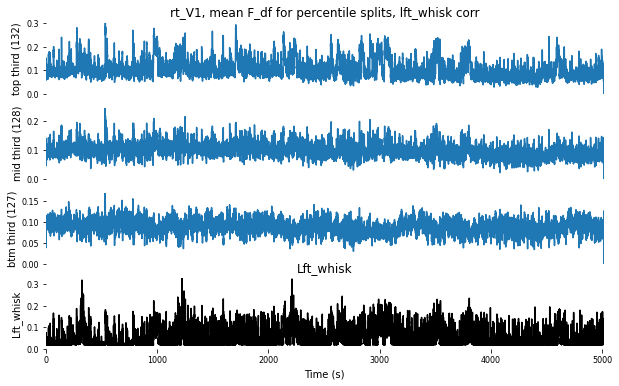

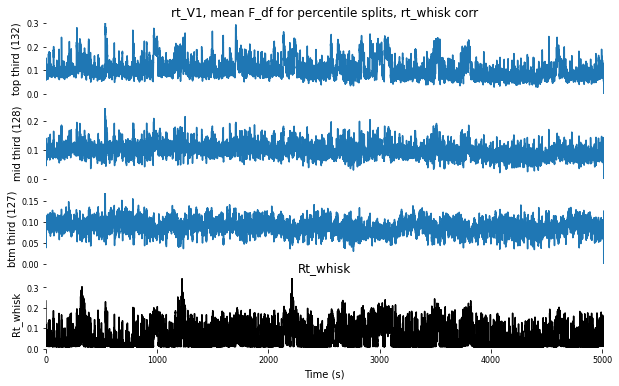

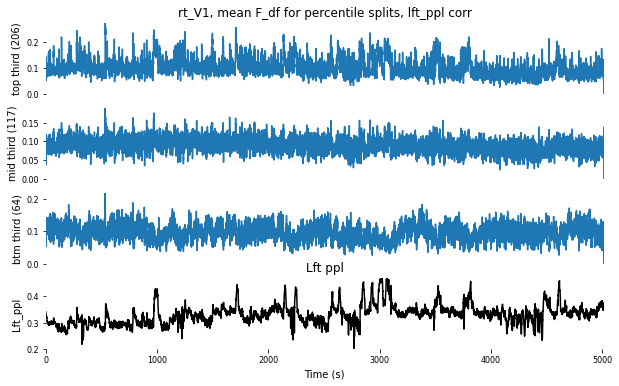

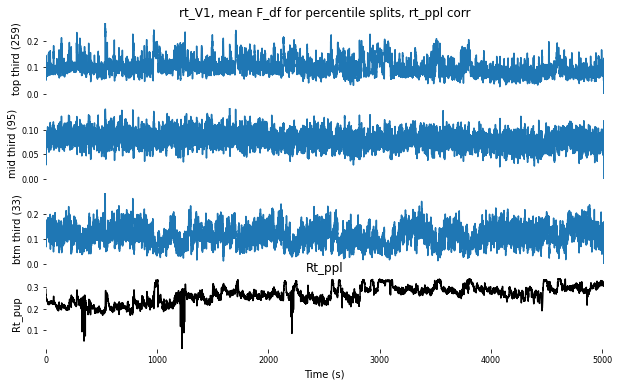

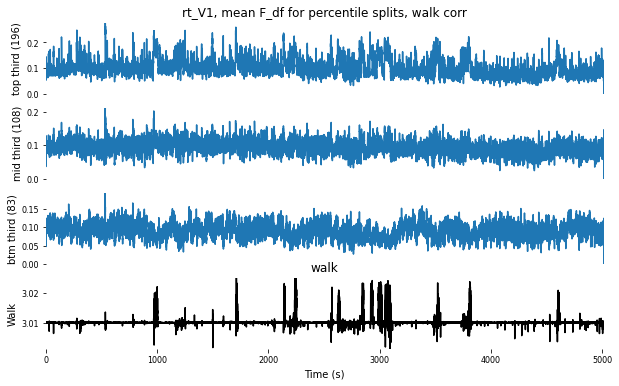

In [17]:
import math as m
from scipy.stats import percentileofscore

#Plot and save mean traces for top, middle, and bottom third of 2P traces correlation with behavioral variables
for i in range(0,len(roi_names)-1):
    ncells[i]=int(ncells[i])
    
for k in range(0,len(roi_names)-1):
    sort_range=np.arange(ncells[k])

    lft_whisk_btm=np.zeros(F_df_iscell_upsamp.shape[2])
    lft_whisk_mid=np.zeros(F_df_iscell_upsamp.shape[2])
    lft_whisk_top=np.zeros(F_df_iscell_upsamp.shape[2])

    rt_whisk_btm=np.zeros(F_df_iscell_upsamp.shape[2])
    rt_whisk_mid=np.zeros(F_df_iscell_upsamp.shape[2])
    rt_whisk_top=np.zeros(F_df_iscell_upsamp.shape[2])

    lft_ppl_btm=np.zeros(F_df_iscell_upsamp.shape[2])
    lft_ppl_mid=np.zeros(F_df_iscell_upsamp.shape[2])
    lft_ppl_top=np.zeros(F_df_iscell_upsamp.shape[2])

    rt_ppl_btm=np.zeros(F_df_iscell_upsamp.shape[2])
    rt_ppl_mid=np.zeros(F_df_iscell_upsamp.shape[2])
    rt_ppl_top=np.zeros(F_df_iscell_upsamp.shape[2])

    walk_btm=np.zeros(F_df_iscell_upsamp.shape[2])
    walk_mid=np.zeros(F_df_iscell_upsamp.shape[2])
    walk_top=np.zeros(F_df_iscell_upsamp.shape[2])

    #Plot left whisker corr mean traces
    lft_whisk_btm_count=0
    lft_whisk_mid_count=0
    lft_whisk_top_count=0

    for i in F_df_lft_whisk_sort_list[k].index:
        if F_df_lft_whisk_perc_list[k][int(i)]<=33:
            lft_whisk_btm=lft_whisk_btm+F_df_lft_whisk_sort_list[k].iloc[int(i),5:F_df_iscell_upsamp.shape[2]+5]
            lft_whisk_btm_count=lft_whisk_btm_count+1
        elif F_df_lft_whisk_perc_list[k][int(i)]>66:
            lft_whisk_top=lft_whisk_top+F_df_lft_whisk_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            lft_whisk_top_count=lft_whisk_top_count+1
        else:
            lft_whisk_mid=lft_whisk_mid+F_df_lft_whisk_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            lft_whisk_mid_count=lft_whisk_mid_count+1

    lft_whisk_btm=lft_whisk_btm/lft_whisk_btm_count
    lft_whisk_mid=lft_whisk_mid/lft_whisk_mid_count
    lft_whisk_top=lft_whisk_top/lft_whisk_top_count

    fig = plt.figure(figsize=(10,6))

    ax0 = fig.add_subplot(4,1,1)
    ax0.get_xaxis().set_visible(False)
    ax0.set_ylim([0,max(lft_whisk_top)])
    ax0.set_xlim([0,max(x_values)])
    ax0.set_frame_on(False)
    ax0.set_ylabel('top third ('+str(lft_whisk_top_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,lft_whisk_top)
    plt.title(str(roi_names[k])+', mean F_df for percentile splits, lft_whisk corr')

    ax1 = fig.add_subplot(4,1,2)
    ax1.get_xaxis().set_visible(False)
    ax1.set_ylim([0,max(lft_whisk_mid)])
    ax1.set_xlim([0,max(x_values)])
    ax1.set_frame_on(False)
    ax1.set_ylabel('mid third ('+str(lft_whisk_mid_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,lft_whisk_mid)

    ax2 = fig.add_subplot(4,1,3)
    ax2.get_xaxis().set_visible(False)
    ax2.set_ylim([0,max(lft_whisk_btm)])
    ax2.set_xlim([0,max(x_values)])
    ax2.set_frame_on(False)
    ax2.set_ylabel('btm third ('+str(lft_whisk_btm_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,lft_whisk_btm)

    ax3 = fig.add_subplot(4,1,4)
    ax3.set_ylim([0,max(lft_whisk_dwnsamp)])
    ax3.set_xlim([0,max(x_values)])
    ax3.set_frame_on(False)
    ax3.set_ylabel('Lft_whisk')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,lft_whisk_dwnsamp, color='black')
    plt.xlabel('Time (s)')
    plt.title('Lft_whisk')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_lft_whisk_mean_corr_traces.png', dpi=300, bbox_inches='tight')

    #Plot right whisker corr mean traces
    rt_whisk_btm_count=0
    rt_whisk_mid_count=0
    rt_whisk_top_count=0

    for i in F_df_rt_whisk_sort_list[k].index:
        if F_df_rt_whisk_perc_list[k][i]<=33:
            rt_whisk_btm=rt_whisk_btm+F_df_rt_whisk_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            rt_whisk_btm_count=rt_whisk_btm_count+1
        elif F_df_rt_whisk_perc_list[k][i]>66:
            rt_whisk_top=rt_whisk_top+F_df_rt_whisk_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            rt_whisk_top_count=rt_whisk_top_count+1
        else:
            rt_whisk_mid=rt_whisk_mid+F_df_rt_whisk_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            rt_whisk_mid_count=rt_whisk_mid_count+1

    rt_whisk_btm=rt_whisk_btm/rt_whisk_btm_count
    rt_whisk_mid=rt_whisk_mid/rt_whisk_mid_count
    rt_whisk_top=rt_whisk_top/rt_whisk_top_count

    fig = plt.figure(figsize=(10,6))

    ax0 = fig.add_subplot(4,1,1)
    ax0.get_xaxis().set_visible(False)
    ax0.set_ylim([0,max(rt_whisk_top)])
    ax0.set_xlim([0,max(x_values)])
    ax0.set_frame_on(False)
    ax0.set_ylabel('top third ('+str(rt_whisk_top_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,rt_whisk_top)
    plt.title(str(roi_names[k])+', mean F_df for percentile splits, rt_whisk corr')

    ax1 = fig.add_subplot(4,1,2)
    ax1.get_xaxis().set_visible(False)
    ax1.set_ylim([0,max(rt_whisk_mid)])
    ax1.set_xlim([0,max(x_values)])
    ax1.set_frame_on(False)
    ax1.set_ylabel('mid third ('+str(rt_whisk_mid_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,rt_whisk_mid)

    ax2 = fig.add_subplot(4,1,3)
    ax2.get_xaxis().set_visible(False)
    ax2.set_ylim([0,max(rt_whisk_btm)])
    ax2.set_xlim([0,max(x_values)])
    ax2.set_frame_on(False)
    ax2.set_ylabel('btm third ('+str(rt_whisk_btm_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,rt_whisk_btm)

    ax3 = fig.add_subplot(4,1,4)
    ax3.set_ylim([0,max(rt_whisk_dwnsamp)])
    ax3.set_xlim([0,max(x_values)])
    ax3.set_frame_on(False)
    ax3.set_ylabel('Rt_whisk')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,rt_whisk_dwnsamp, color='black')
    plt.xlabel('Time (s)')
    plt.title('Rt_whisk')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_rt_whisk_mean_corr_traces.png', dpi=300, bbox_inches='tight')

    #Plot left ppl corr mean traces
    lft_ppl_btm_count=0
    lft_ppl_mid_count=0
    lft_ppl_top_count=0

    for i in F_df_lft_ppl_sort_list[k].index:
        if F_df_lft_ppl_perc_list[k][i]<=33:
            lft_ppl_btm=lft_ppl_btm+F_df_lft_ppl_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            lft_ppl_btm_count=lft_ppl_btm_count+1
        elif F_df_lft_ppl_perc_list[k][i]>66:
            lft_ppl_top=lft_ppl_top+F_df_lft_ppl_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            lft_ppl_top_count=lft_ppl_top_count+1
        else:
            lft_ppl_mid=lft_ppl_mid+F_df_lft_ppl_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            lft_ppl_mid_count=lft_ppl_mid_count+1

    lft_ppl_btm=lft_ppl_btm/lft_ppl_btm_count
    lft_ppl_mid=lft_ppl_mid/lft_ppl_mid_count
    lft_ppl_top=lft_ppl_top/lft_ppl_top_count

    fig = plt.figure(figsize=(10,6))

    ax0 = fig.add_subplot(4,1,1)
    ax0.get_xaxis().set_visible(False)
    ax0.set_ylim([0,max(lft_ppl_top)])
    ax0.set_xlim([0,max(x_values)])
    ax0.set_frame_on(False)
    ax0.set_ylabel('top third ('+str(lft_ppl_top_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,lft_ppl_top)
    plt.title(str(roi_names[k])+', mean F_df for percentile splits, lft_ppl corr')

    ax1 = fig.add_subplot(4,1,2)
    ax1.get_xaxis().set_visible(False)
    
    try:
        ax1.set_ylim([0,max(lft_ppl_mid)])
    except ValueError:
        print("Lft_ppl_mid divide by zero")
    ax1.set_xlim([0,max(x_values)])
    ax1.set_frame_on(False)
    ax1.set_ylabel('mid third ('+str(lft_ppl_mid_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,lft_ppl_mid)

    ax2 = fig.add_subplot(4,1,3)
    ax2.get_xaxis().set_visible(False)
    ax2.set_ylim([0,max(lft_ppl_btm)])
    ax2.set_xlim([0,max(x_values)])
    ax2.set_frame_on(False)
    ax2.set_ylabel('btm third ('+str(lft_ppl_btm_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,lft_ppl_btm)

    ax3 = fig.add_subplot(4,1,4)
    ax3.set_ylim([min(lft_ppl_upsamp),max(lft_ppl_upsamp)])
    ax3.set_xlim([0,max(x_values)])
    ax3.set_frame_on(False)
    ax3.set_ylabel('Lft_ppl')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,lft_ppl_upsamp, color='black')
    plt.xlabel('Time (s)')
    plt.title('Lft ppl')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_lft_ppl_mean_corr_traces.png', dpi=300, bbox_inches='tight')

    #Plot rt ppl corr mean traces
    rt_ppl_btm_count=0
    rt_ppl_mid_count=0
    rt_ppl_top_count=0

    for i in F_df_rt_ppl_sort_list[k].index:
        if F_df_rt_ppl_perc_list[k][i]<=33:
            rt_ppl_btm=rt_ppl_btm+F_df_rt_ppl_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            rt_ppl_btm_count=rt_ppl_btm_count+1
        elif F_df_rt_ppl_perc_list[k][i]>66:
            rt_ppl_top=rt_ppl_top+F_df_rt_ppl_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            rt_ppl_top_count=rt_ppl_top_count+1
        else:
            rt_ppl_mid=rt_ppl_mid+F_df_rt_ppl_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            rt_ppl_mid_count=rt_ppl_mid_count+1

    rt_ppl_btm=rt_ppl_btm/rt_ppl_btm_count
    rt_ppl_mid=rt_ppl_mid/rt_ppl_mid_count
    rt_ppl_top=rt_ppl_top/rt_ppl_top_count

    fig = plt.figure(figsize=(10,6))

    ax0 = fig.add_subplot(4,1,1)
    ax0.get_xaxis().set_visible(False)
    ax0.set_ylim([0,max(rt_ppl_top)])
    ax0.set_xlim([0,max(x_values)])
    ax0.set_frame_on(False)
    ax0.set_ylabel('top third ('+str(rt_ppl_top_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,rt_ppl_top)
    plt.title(str(roi_names[k])+', mean F_df for percentile splits, rt_ppl corr')

    ax1 = fig.add_subplot(4,1,2)
    ax1.get_xaxis().set_visible(False)
    ax1.set_ylim([0,max(rt_ppl_mid)])
    ax1.set_xlim([0,max(x_values)])
    ax1.set_frame_on(False)
    ax1.set_ylabel('mid third ('+str(rt_ppl_mid_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,rt_ppl_mid)

    ax2 = fig.add_subplot(4,1,3)
    ax2.get_xaxis().set_visible(False)
    ax2.set_ylim([0,max(rt_ppl_btm)])
    ax2.set_xlim([0,max(x_values)])
    ax2.set_frame_on(False)
    ax2.set_ylabel('btm third ('+str(rt_ppl_btm_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,rt_ppl_btm)

    ax3 = fig.add_subplot(4,1,4)
    ax3.set_ylim([min(rt_ppl_upsamp),max(rt_ppl_upsamp)])
    ax3.set_xlim([0,max(x_values)])
    ax3.set_frame_on(False)
    ax3.set_ylabel('Rt_pup')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,rt_ppl_upsamp, color='black')
    plt.xlabel('Time (s)')
    plt.title('Rt_ppl')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_rt_ppl_mean_corr_traces.png', dpi=300, bbox_inches='tight')

    #Plot walk corr mean traces
    walk_btm_count=0
    walk_mid_count=0
    walk_top_count=0

    for i in F_df_walk_sort_list[k].index:
        if F_df_walk_perc_list[k][i]<=33:
            walk_btm=walk_btm+F_df_walk_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            walk_btm_count=walk_btm_count+1
        elif F_df_walk_perc_list[k][i]>66:
            walk_top=walk_top+F_df_walk_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            walk_top_count=walk_top_count+1
        else:
            walk_mid=walk_mid+F_df_walk_sort_list[k].iloc[i,5:F_df_iscell_upsamp.shape[2]+5]
            walk_mid_count=walk_mid_count+1

    walk_btm=walk_btm/walk_btm_count
    walk_mid=walk_mid/walk_mid_count
    walk_top=walk_top/walk_top_count

    fig = plt.figure(figsize=(10,6))

    ax0 = fig.add_subplot(4,1,1)
    ax0.get_xaxis().set_visible(False)
    ax0.set_ylim([0,max(walk_top)])
    ax0.set_xlim([0,max(x_values)])
    ax0.set_frame_on(False)
    ax0.set_ylabel('top third ('+str(walk_top_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,walk_top)
    plt.title(str(roi_names[k])+', mean F_df for percentile splits, walk corr')

    ax1 = fig.add_subplot(4,1,2)
    ax1.get_xaxis().set_visible(False)
    ax1.set_ylim([0,max(walk_mid)])
    ax1.set_xlim([0,max(x_values)])
    ax1.set_frame_on(False)
    ax1.set_ylabel('mid third ('+str(walk_mid_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,walk_mid)

    ax2 = fig.add_subplot(4,1,3)
    ax2.get_xaxis().set_visible(False)
    ax2.set_ylim([0,max(walk_btm)])
    ax2.set_xlim([0,max(x_values)])
    ax2.set_frame_on(False)
    ax2.set_ylabel('btm third ('+str(walk_btm_count)+')')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,walk_btm)

    ax3 = fig.add_subplot(4,1,4)
    ax3.set_ylim([min(walk_dwnsamp),max(walk_dwnsamp)])
    ax3.set_xlim([0,max(x_values)])
    ax3.set_frame_on(False)
    ax3.set_ylabel('Walk')
    plt.tick_params(labelsize=8)
    plt.plot(x_values,walk_dwnsamp, color='black')
    plt.xlabel('Time (s)')
    plt.title('walk')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_walk_mean_corr_traces.png', dpi=300, bbox_inches='tight')

How many cells for each third? 10


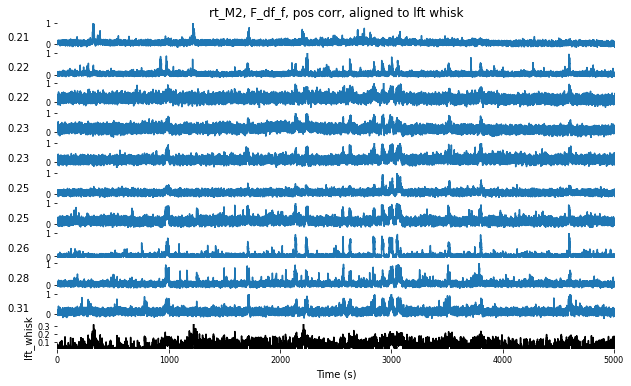

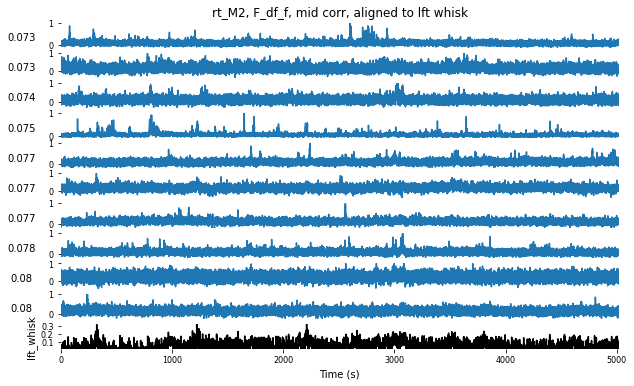

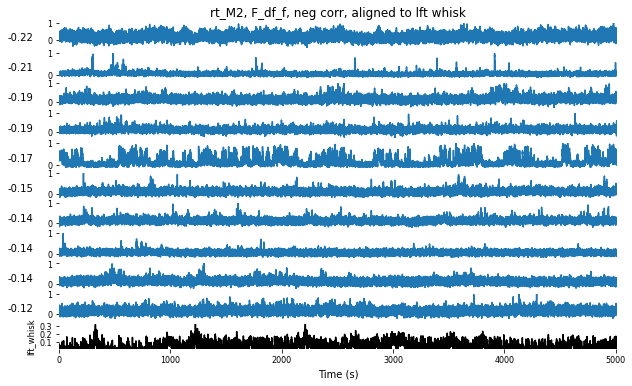

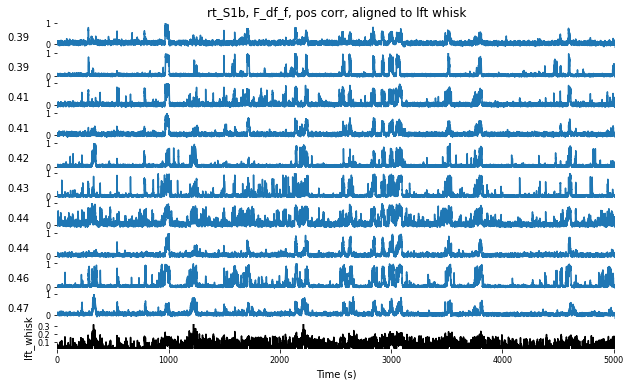

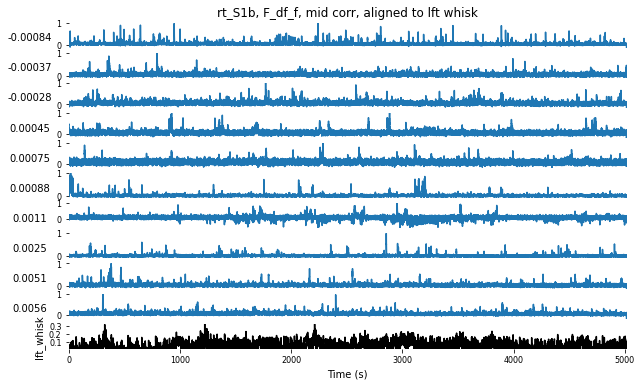

...

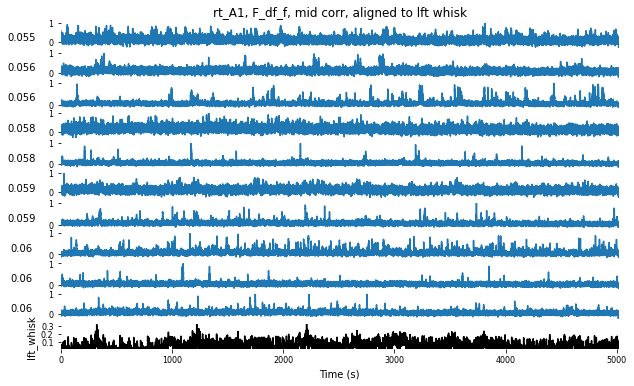

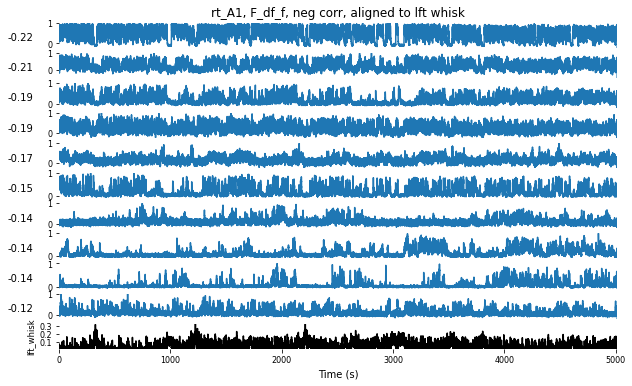

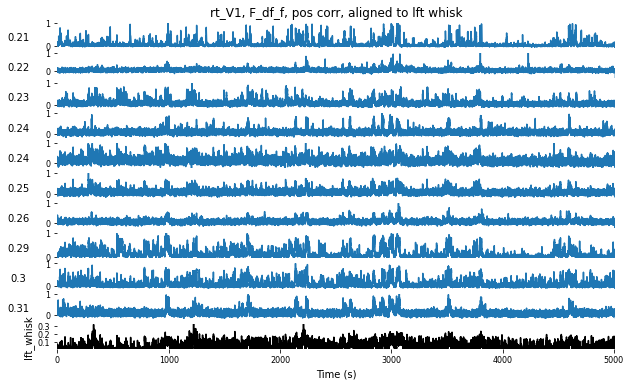

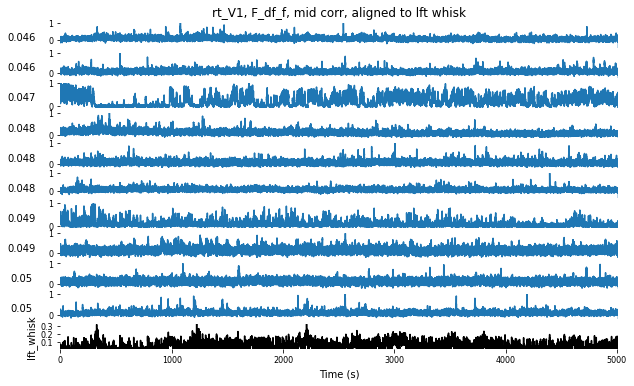

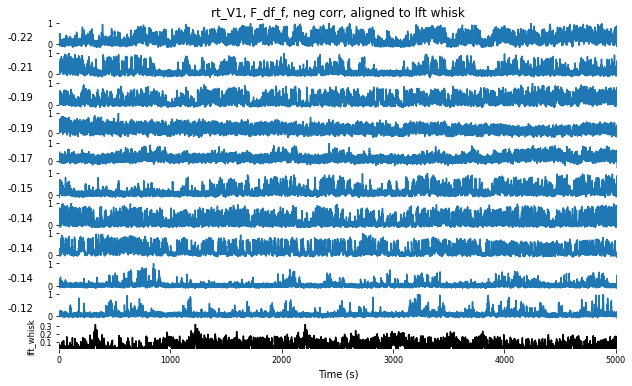

In [18]:
import math as m

def round_sig(x, sig=2):
    return round(x, sig-int(m.floor(m.log10(abs(x))))-1)

dur_max=0
for i in range(0,len(roi_names)-1):
    if dur[i]>dur_max:
        dur_max=dur[i]

cell_range=input("How many cells for each third?")
cell_range=int(cell_range)
        
#plot top 10 traces versus left whisk
for k in range(0,len(roi_names)-1):
    cell_start=int(ncells[k]-cell_range)
    cell_stop=int(ncells[k])

    height=(cell_range/10)*6
    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    x_values=np.linspace(0,dur_max,num=int(m.floor(dur_max*rate)))
    x_val_t=ops['nframes']/ops['fs']

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_lft_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_lft_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        top_corr=F_df_lft_whisk_sort_list[k].iloc[i+cell_start-2,0]
        top_corr=round_sig(top_corr, 2)
        axj.set_ylabel(top_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_lft_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(str(roi_names[k]) + ", F_df_f, pos corr, aligned to lft whisk")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(lft_whisk_dwnsamp),max(lft_whisk_dwnsamp))
    axj.set_ylabel('lft_whisk')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, lft_whisk_dwnsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_top_corr_lft_whisk_align.png', dpi=300, bbox_inches='tight')

    #plot mid 10 traces versus left whisk
    cell_start=m.floor((ncells[k]/2)-(cell_range/2))
    cell_stop=int(cell_start+cell_range)

    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_lft_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_lft_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        mid_corr=F_df_lft_whisk_sort_list[k].iloc[i+cell_start,0]
        mid_corr=round_sig(mid_corr, 2)
        axj.set_ylabel(mid_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_lft_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(str(roi_names[k]) + ", F_df_f, mid corr, aligned to lft whisk")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(lft_whisk_dwnsamp),max(lft_whisk_dwnsamp))
    axj.set_ylabel('lft_whisk')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, lft_whisk_dwnsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_mid_corr_lft_whisk_align.png', dpi=300, bbox_inches='tight')

    #plot btm 10 traces versus left whisk
    cell_start=0
    cell_stop=cell_range

    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_lft_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_lft_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        btm_corr=F_df_lft_whisk_sort.iloc[i+cell_start,0]
        btm_corr=round_sig(btm_corr, 2)
        axj.set_ylabel(btm_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_lft_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(str(roi_names[k]) + ", F_df_f, neg corr, aligned to lft whisk")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(lft_whisk_dwnsamp),max(lft_whisk_dwnsamp))
    axj.set_ylabel('lft_whisk',fontsize='small')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, lft_whisk_dwnsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_btm_corr_lft_whisk_align.png', dpi=300, bbox_inches='tight')

How many cells for each third? 10


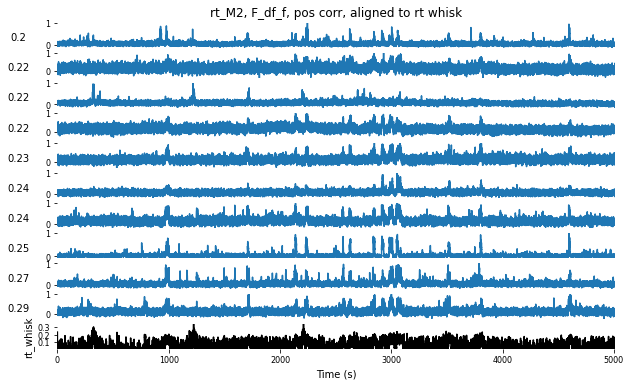

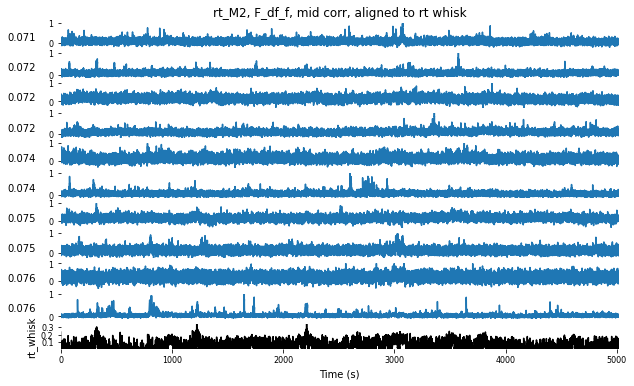

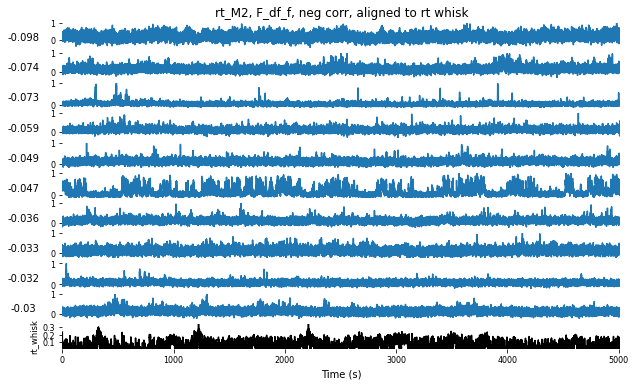

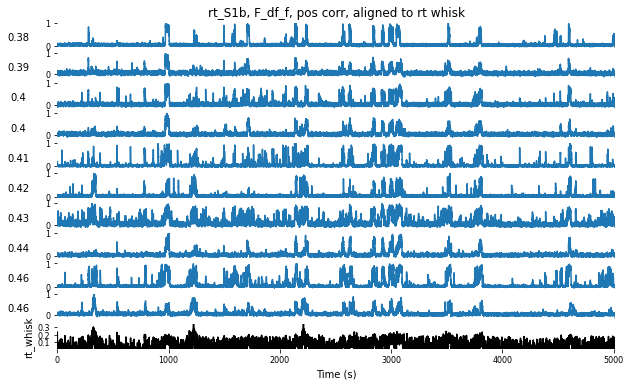

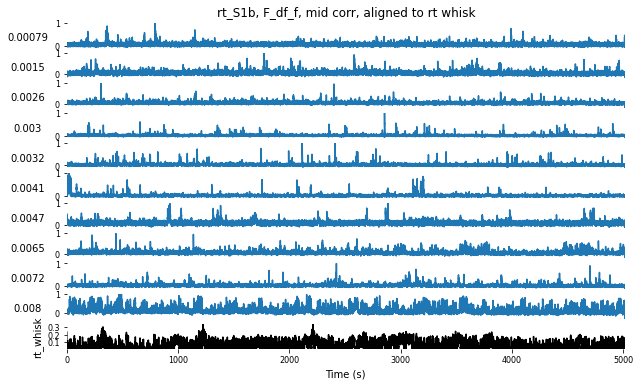

...

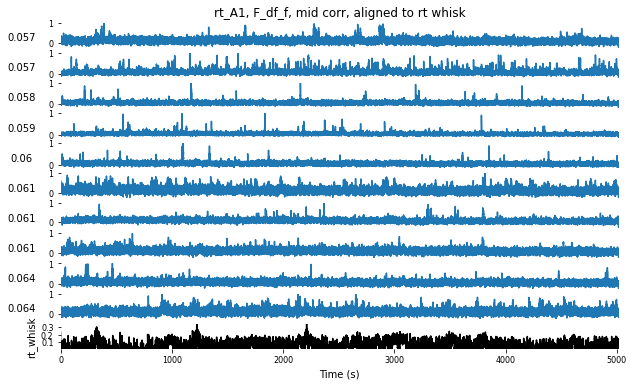

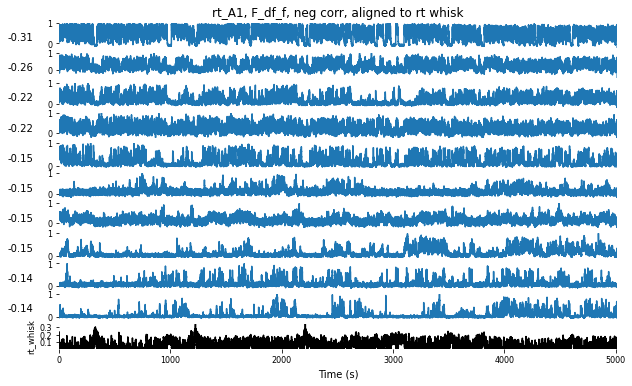

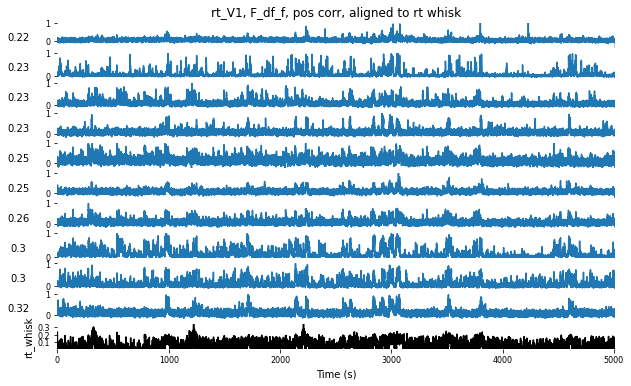

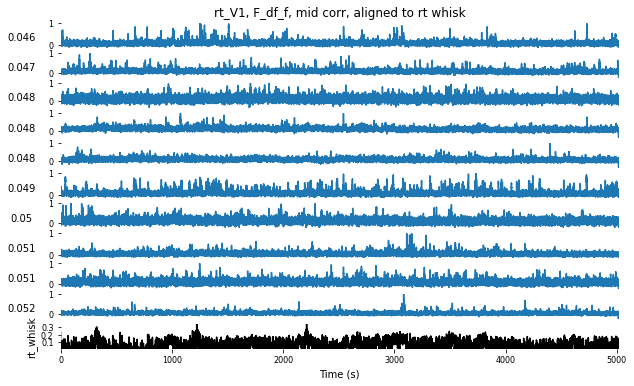

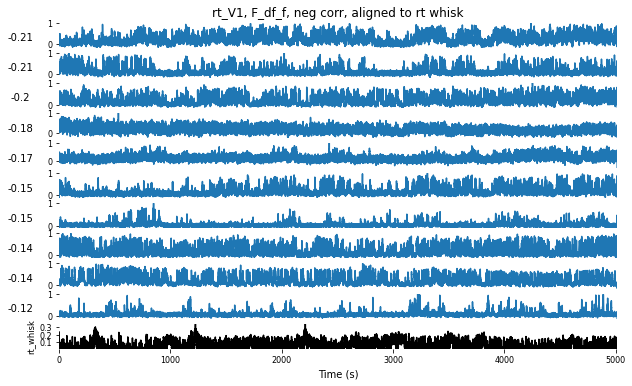

In [19]:
import math as m

def round_sig(x, sig=2):
    return round(x, sig-int(m.floor(m.log10(abs(x))))-1)

dur_max=0
for i in range(0,len(roi_names)-1):
    if dur[i]>dur_max:
        dur_max=dur[i]
        
cell_range=input("How many cells for each third?")
cell_range=int(cell_range)

#plot top 10 traces versus right whisk
for k in range(0,len(roi_names)-1):
    cell_start=int(ncells[k]-cell_range)
    cell_stop=int(ncells[k])

    height=(cell_range/10)*6
    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    x_values=np.linspace(0,dur_max,num=int(m.floor(dur_max*rate)))
    x_val_t=ops['nframes']/ops['fs']

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_rt_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_rt_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        top_corr=F_df_rt_whisk_sort_list[k].iloc[i+cell_start-2,1]
        top_corr=round_sig(top_corr, 2)
        axj.set_ylabel(top_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_rt_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(str(roi_names[k]) + ", F_df_f, pos corr, aligned to rt whisk")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(rt_whisk_dwnsamp),max(rt_whisk_dwnsamp))
    axj.set_ylabel('rt_whisk')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, rt_whisk_dwnsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_top_corr_rt_whisk_align.png', dpi=300, bbox_inches='tight')

    #plot mid 10 traces versus right whisk
    cell_start=m.floor((ncells[k]/2)-(cell_range/2))
    cell_stop=int(cell_start+cell_range)

    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_rt_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_rt_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        mid_corr=F_df_rt_whisk_sort_list[k].iloc[i+cell_start,1]
        mid_corr=round_sig(mid_corr, 2)
        axj.set_ylabel(mid_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_rt_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i == 0:
            plt.title(str(roi_names[k]) + ", F_df_f, mid corr, aligned to rt whisk")
        j=j+1
        #print(j)

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(rt_whisk_dwnsamp),max(rt_whisk_dwnsamp))
    axj.set_ylabel('rt_whisk')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, rt_whisk_dwnsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_mid_corr_rt_whisk_align.png', dpi=300, bbox_inches='tight')

    #plot btm 10 traces versus right whisk
    cell_start=0
    cell_stop=cell_range

    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_rt_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_rt_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        btm_corr=F_df_rt_whisk_sort_list[k].iloc[i+cell_start,1]
        btm_corr=round_sig(btm_corr, 2)
        axj.set_ylabel(btm_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_rt_whisk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(str(roi_names[k]) + ", F_df_f, neg corr, aligned to rt whisk")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(rt_whisk_dwnsamp),max(rt_whisk_dwnsamp))
    axj.set_ylabel('rt_whisk',fontsize='small')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, rt_whisk_dwnsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_btm_corr_rt_whisk_align.png', dpi=300, bbox_inches='tight')

How many cells for each third? 10


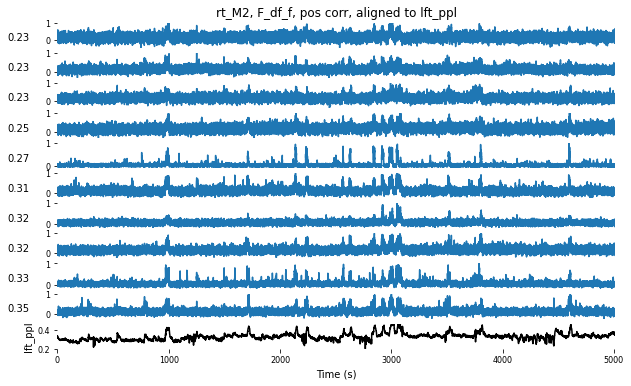

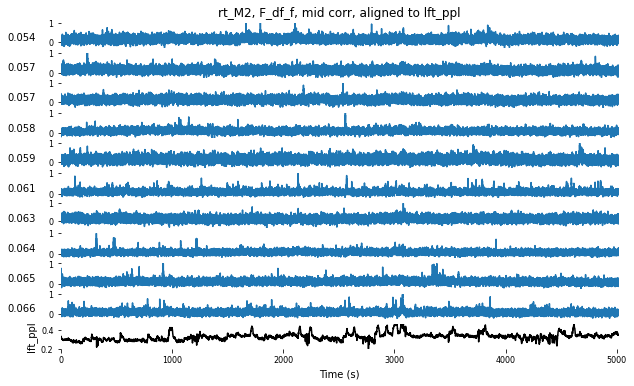

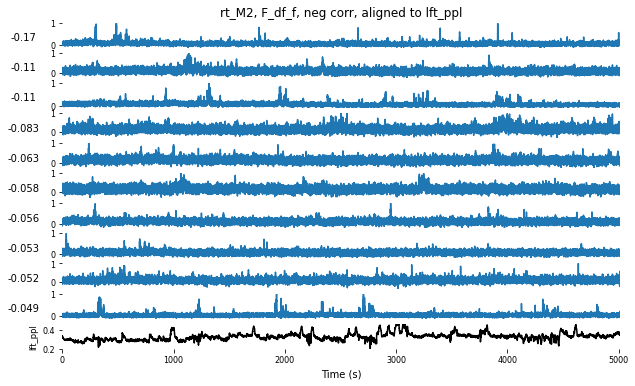

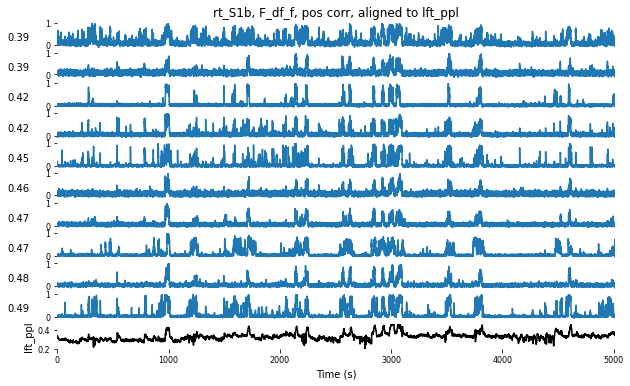

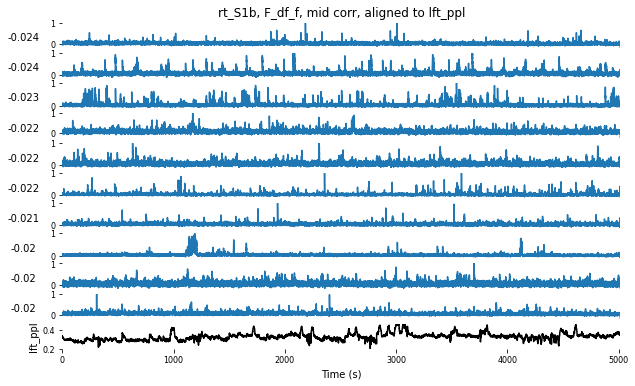

...

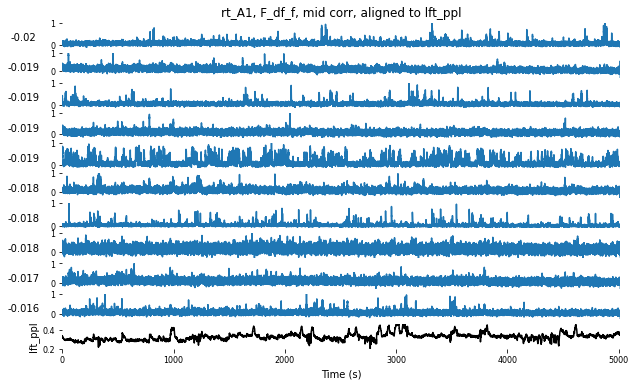

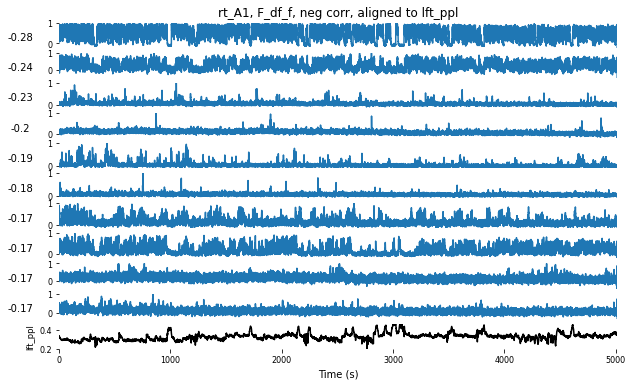

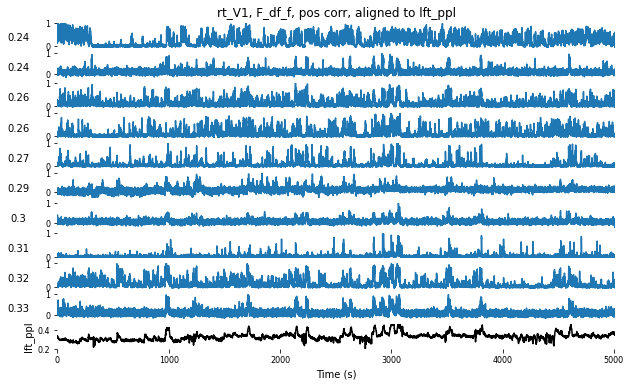

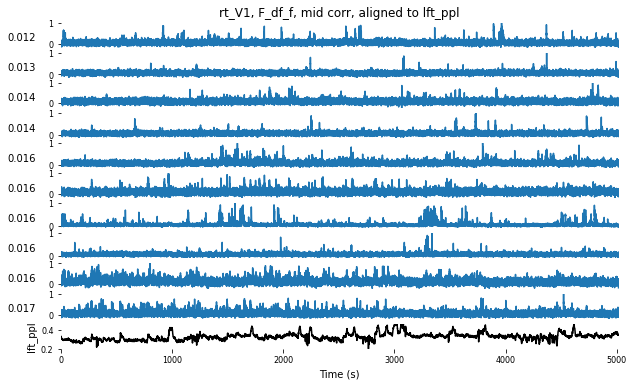

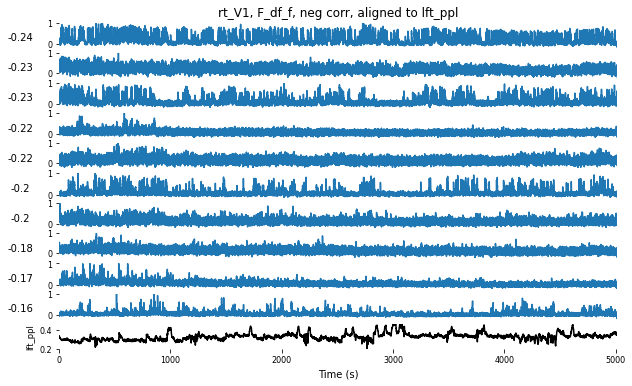

In [20]:
import math as m

def round_sig(x, sig=2):
    return round(x, sig-int(m.floor(m.log10(abs(x))))-1)

dur_max=0
for i in range(0,len(roi_names)-1):
    if dur[i]>dur_max:
        dur_max=dur[i]
        
cell_range=input("How many cells for each third?")
cell_range=int(cell_range)

#plot top 10 traces versus left ppl
for k in range(0,len(roi_names)-1):
    cell_start=int(ncells[k]-cell_range)
    cell_stop=int(ncells[k])

    height=(cell_range/10)*6
    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    x_values=np.linspace(0,dur_max,num=int(m.floor(dur_max*rate)))
    x_val_t=ops['nframes']/ops['fs']

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_lft_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_lft_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        top_corr=F_df_lft_ppl_sort_list[k].iloc[i+cell_start-2,2]
        top_corr=round_sig(top_corr, 2)
        axj.set_ylabel(top_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_lft_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(str(roi_names[k]) + ", F_df_f, pos corr, aligned to lft_ppl")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(lft_ppl_upsamp),max(lft_ppl_upsamp))
    axj.set_ylabel('lft_ppl')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, lft_ppl_upsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_top_corr_lft_ppl_align.png', dpi=300, bbox_inches='tight')

    #plot mid 10 traces versus lft_ppl
    cell_start=m.floor((ncells[k]/2)-(cell_range/2))
    cell_stop=int(cell_start+cell_range)

    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_lft_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_lft_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        mid_corr=F_df_lft_ppl_sort_list[k].iloc[i+cell_start,2]
        mid_corr=round_sig(mid_corr, 2)
        axj.set_ylabel(mid_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_lft_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(str(roi_names[k]) + ", F_df_f, mid corr, aligned to lft_ppl")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(lft_ppl_upsamp),max(lft_ppl_upsamp))
    axj.set_ylabel('lft_ppl')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, lft_ppl_upsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_mid_corr_lft_ppl_align.png', dpi=300, bbox_inches='tight')

    #plot btm 10 traces versus lft_ppl
    cell_start=0
    cell_stop=cell_range

    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_lft_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_lft_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        btm_corr=F_df_lft_ppl_sort_list[k].iloc[i+cell_start,2]
        btm_corr=round_sig(btm_corr, 2)
        axj.set_ylabel(btm_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_lft_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(str(roi_names[k]) + ", F_df_f, neg corr, aligned to lft_ppl")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(lft_ppl_upsamp),max(lft_ppl_upsamp))
    axj.set_ylabel('lft_ppl',fontsize='small')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, lft_ppl_upsamp, color='k')

    plt.savefig(save_paths[k]+'/'+roi_names[k]+'_btm_corr_lft_ppl_align.png', dpi=300, bbox_inches='tight')

How many cells for each third? 10


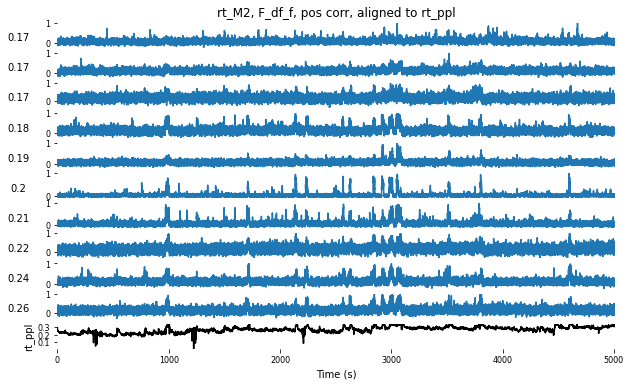

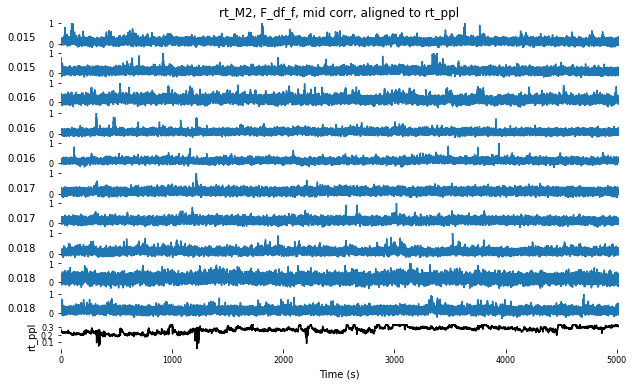

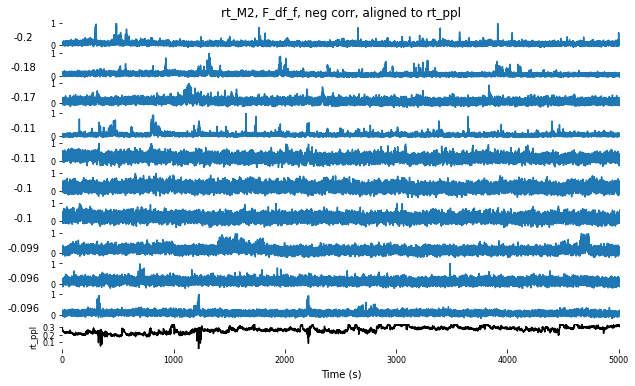

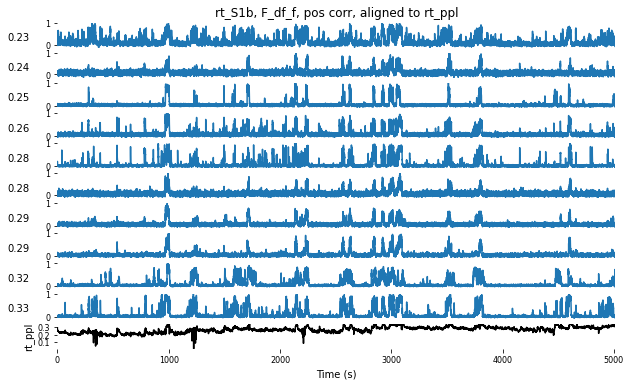

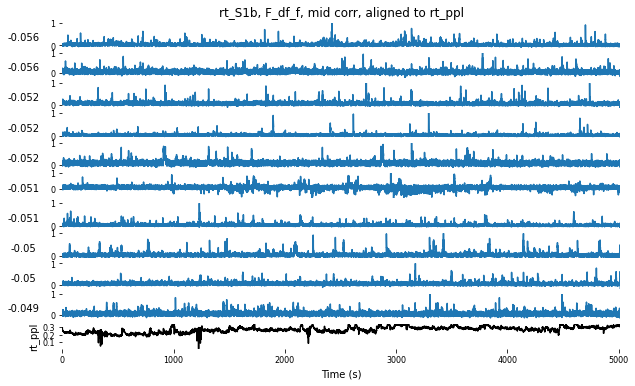

...

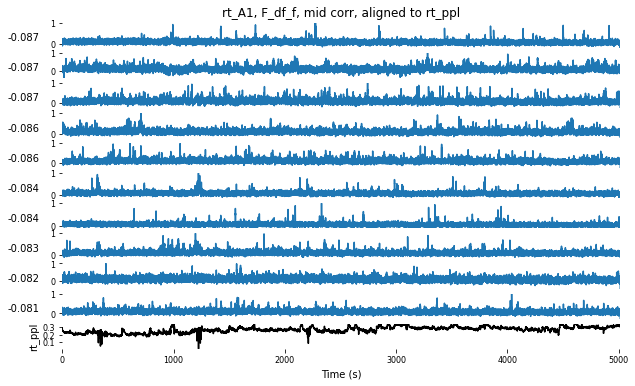

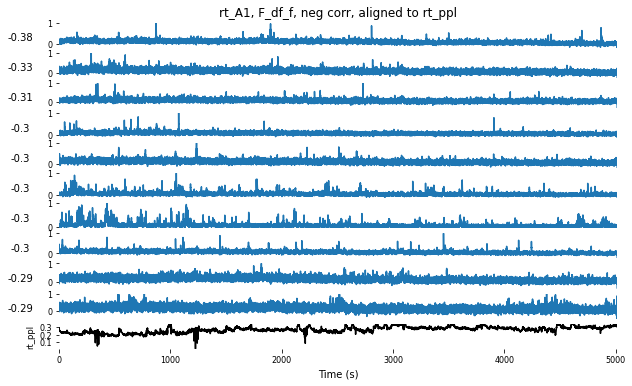

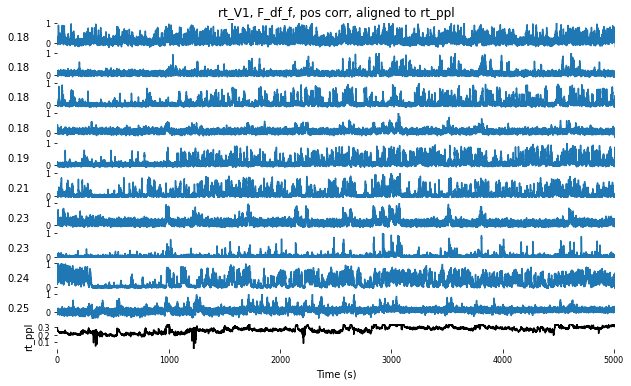

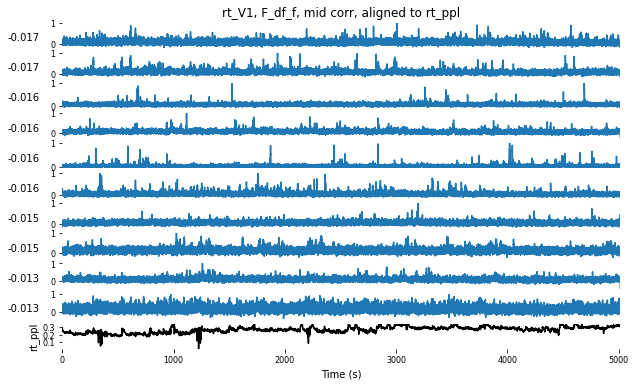

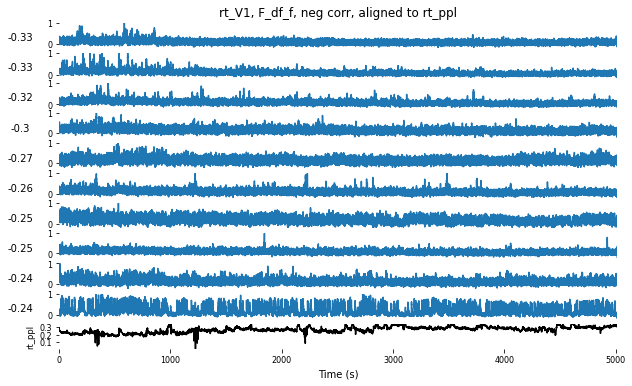

In [21]:
import math as m

def round_sig(x, sig=2):
    return round(x, sig-int(m.floor(m.log10(abs(x))))-1)

dur_max=0
for i in range(0,len(roi_names)-1):
    if dur[i]>dur_max:
        dur_max=dur[i]
        
cell_range=input("How many cells for each third?")
cell_range=int(cell_range)

#plot top 10 traces versus right ppl
for k in range(0,len(roi_names)-1):
    cell_start=int(ncells[k]-cell_range)
    cell_stop=int(ncells[k])

    height=(cell_range/10)*6
    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    x_values=np.linspace(0,dur_max,num=int(m.floor(dur_max*rate)))
    x_val_t=ops['nframes']/ops['fs']

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_rt_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_rt_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        top_corr=F_df_rt_ppl_sort_list[k].iloc[i+cell_start-2,3]
        top_corr=round_sig(top_corr, 2)
        axj.set_ylabel(top_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_rt_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(str(roi_names[k]) + ", F_df_f, pos corr, aligned to rt_ppl")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(rt_ppl_upsamp),max(rt_ppl_upsamp))
    axj.set_ylabel('rt_ppl')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, rt_ppl_upsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_top_corr_rt_ppl_align.png', dpi=300, bbox_inches='tight')

    #plot mid 10 traces versus rt_ppl
    cell_start=m.floor((ncells[k]/2)-(cell_range/2))
    cell_stop=int(cell_start+cell_range)

    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_rt_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_rt_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        mid_corr=F_df_rt_ppl_sort_list[k].iloc[i+cell_start,3]
        mid_corr=round_sig(mid_corr, 2)
        axj.set_ylabel(mid_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_rt_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(roi_names[k] + ", F_df_f, mid corr, aligned to rt_ppl")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(rt_ppl_upsamp),max(rt_ppl_upsamp))
    axj.set_ylabel('rt_ppl')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, rt_ppl_upsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_mid_corr_rt_ppl_align.png', dpi=300, bbox_inches='tight')

    #plot btm 10 traces versus rt_ppl
    cell_start=0
    cell_stop=cell_range

    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_rt_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_rt_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        btm_corr=F_df_rt_ppl_sort_list[k].iloc[i+cell_start,3]
        btm_corr=round_sig(btm_corr, 2)
        axj.set_ylabel(btm_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_rt_ppl_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i == 0:
            plt.title(roi_names[k] + ", F_df_f, neg corr, aligned to rt_ppl")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(rt_ppl_upsamp),max(rt_ppl_upsamp))
    axj.set_ylabel('rt_ppl',fontsize='small')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, rt_ppl_upsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_btm_corr_rt_ppl_align.png', dpi=300, bbox_inches='tight')

How many cells for each third? 10


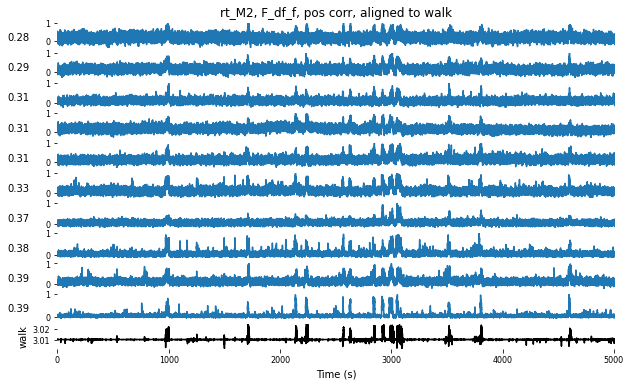

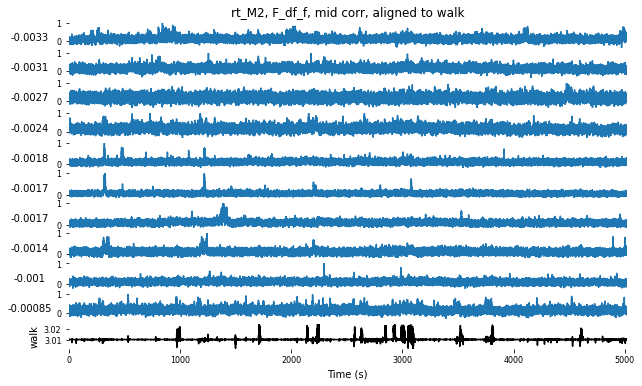

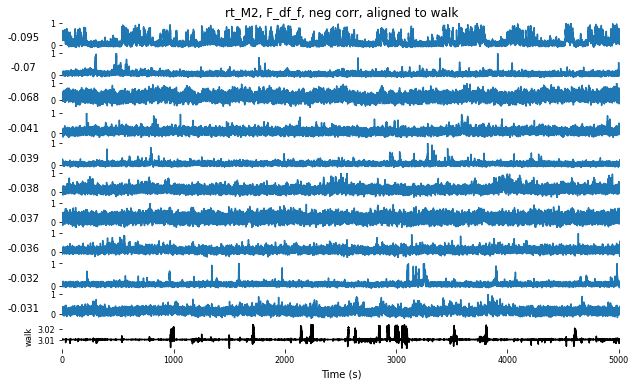

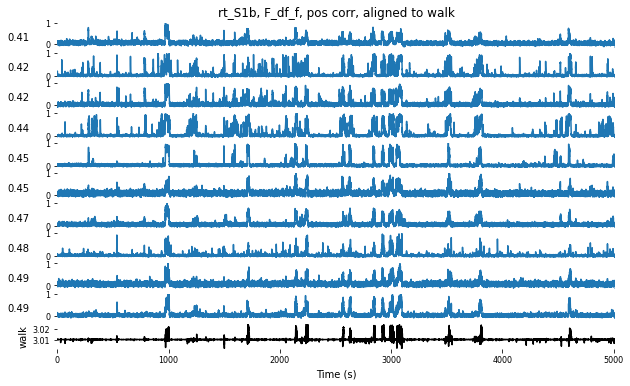

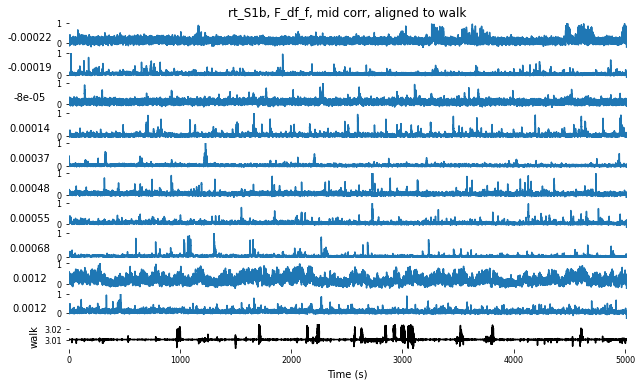

...

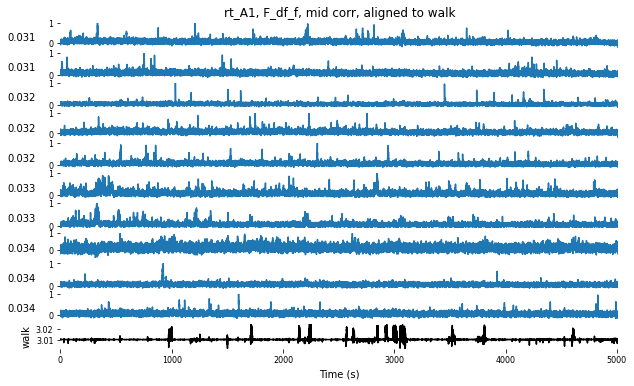

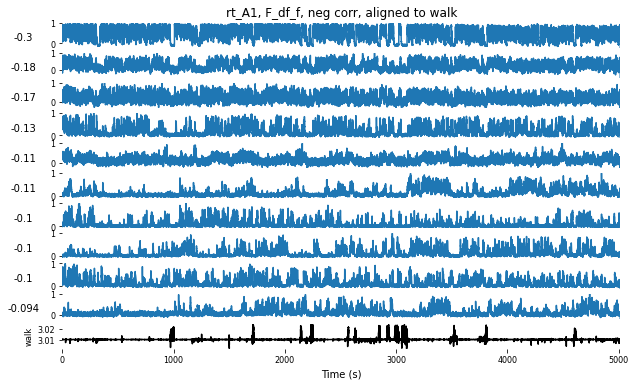

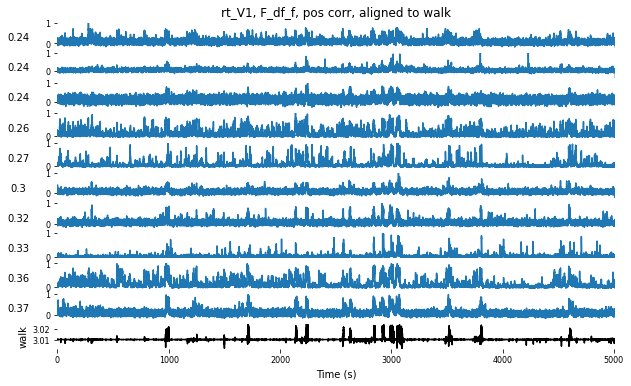

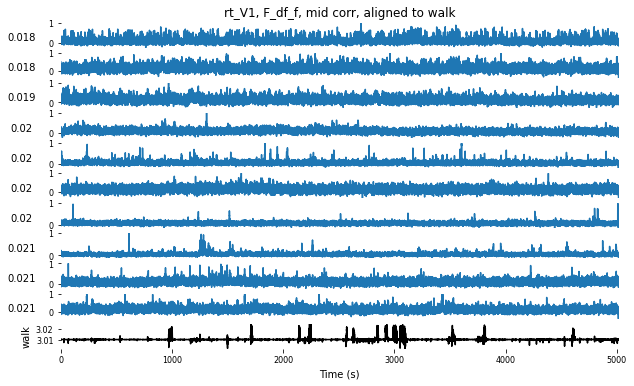

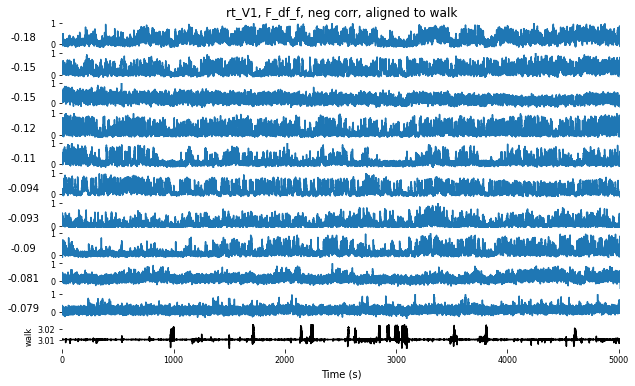

In [22]:
import math as m

def round_sig(x, sig=2):
    return round(x, sig-int(m.floor(m.log10(abs(x))))-1)

dur_max=0
for i in range(0,len(roi_names)-1):
    if dur[i]>dur_max:
        dur_max=dur[i]
        
cell_range=input("How many cells for each third?")
cell_range=int(cell_range)

#plot top 10 traces versus walk
for k in range(0,len(roi_names)-1):
    cell_start=int(ncells[k]-cell_range)
    cell_stop=int(ncells[k])

    height=(cell_range/10)*6
    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    x_values=np.linspace(0,dur_max,num=int(m.floor(dur_max*rate)))
    x_val_t=ops['nframes']/ops['fs']

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_walk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_walk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        top_corr=F_df_walk_sort_list[k].iloc[i+cell_start-2,4]
        top_corr=round_sig(top_corr, 2)
        axj.set_ylabel(top_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_walk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(str(roi_names[k]) + ", F_df_f, pos corr, aligned to walk")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(walk_dwnsamp),max(walk_dwnsamp))
    axj.set_ylabel('walk')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, walk_dwnsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_top_corr_walk_align.png', dpi=300, bbox_inches='tight')

    #plot mid 10 traces versus walk
    cell_start=m.floor((ncells[k]/2)-(cell_range/2))
    cell_stop=int(cell_start+cell_range)

    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_walk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_walk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        mid_corr=F_df_walk_sort.iloc[i+cell_start,4]
        mid_corr=round_sig(mid_corr, 2)
        axj.set_ylabel(mid_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_walk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(str(roi_names[k]) + ", F_df_f, mid corr, aligned to walk")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(walk_dwnsamp),max(walk_dwnsamp))
    axj.set_ylabel('walk')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, walk_dwnsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_mid_corr_walk_align.png', dpi=300, bbox_inches='tight')

    #plot btm 10 traces versus walk
    cell_start=0
    cell_stop=cell_range

    fig = plt.figure(figsize=(10,height))

    y_min=0
    y_max=0

    i=0
    j=1

    for i in range(cell_range):

        y_max=max(F_df_walk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        y_min=min(F_df_walk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])    

        axj = fig.add_subplot(cell_range+1,1,j)
        axj.get_xaxis().set_visible(False)
        axj.set_xlim(0,x_val_t)
        axj.set_ylim([y_min,y_max])
        axj.set_frame_on(False)
        btm_corr=F_df_walk_sort_list[k].iloc[i+cell_start,4]
        btm_corr=round_sig(btm_corr, 2)
        axj.set_ylabel(btm_corr, rotation=0)
        axj.yaxis.set_label_coords(-0.07,0.2)
        plt.tick_params(labelsize=8)
        plt.plot(x_values,F_df_walk_sort_list[k].iloc[i+cell_start,5:F_df_iscell_upsamp.shape[2]+5])
        if i==0:
            plt.title(str(roi_names[k]) + ", F_df_f, neg corr, aligned to walk")
        j=j+1

    axj = fig.add_subplot(cell_range+1,1,j)
    axj.set_frame_on(False)
    axj.set_xlim(0,x_val_t)
    axj.set_ylim(min(walk_dwnsamp),max(walk_dwnsamp))
    axj.set_ylabel('walk',fontsize='small')
    axj.set_xlabel('Time (s)')
    plt.tick_params(labelsize=8)
    plt.plot(x_values, walk_dwnsamp, color='k')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_sort_corr_walk_align.png', dpi=300, bbox_inches='tight')

In [17]:
#only run this once PCA sort is figured out

import seaborn as sns
sns.set_context('notebook', font_scale=1.5, rc={'lines.markeredgewidth': 2})
sns.set_style('white', {'axes.spines.right': False, 'axes.spines.top': False, 'xtick.bottom': False, 'ytick.left': False,})


Text(0.5, 61.5, '2P frames')

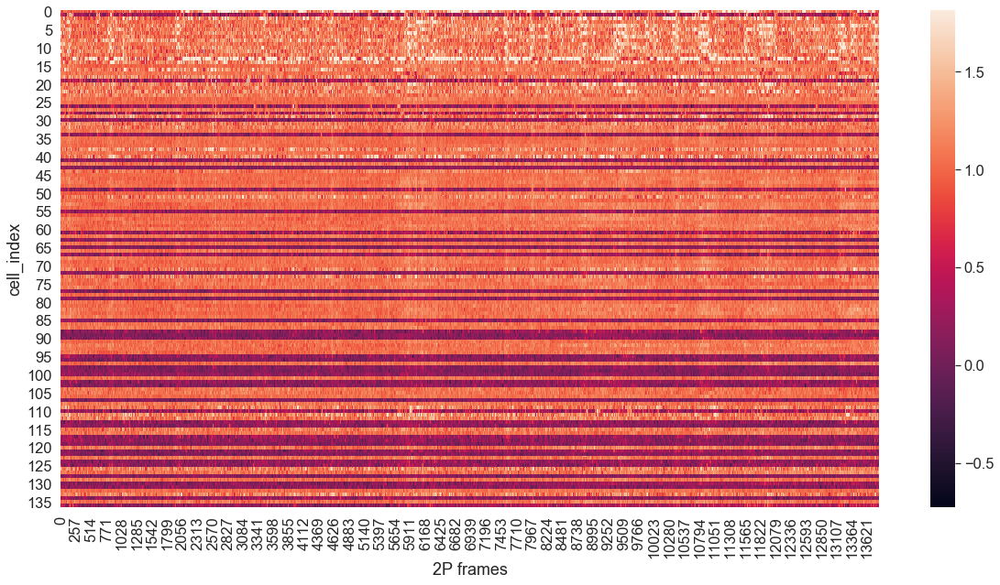

In [18]:
#add code to sort by PCA1 here

fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(F_df, vmax=np.percentile(F_df, 99), ax=ax, linecolor=None, linewidth=0)
ax.set_ylabel('cell_index')
ax.set_xlabel('2P frames')

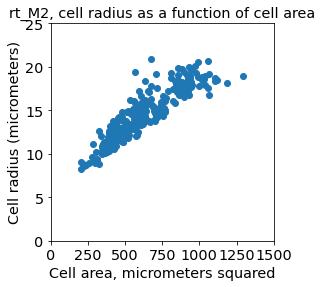

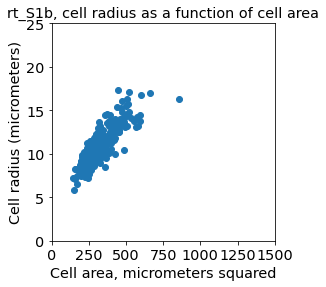

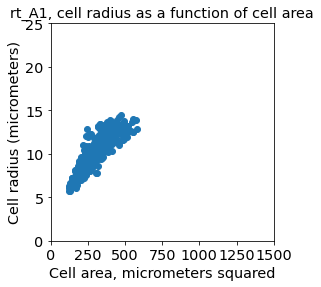

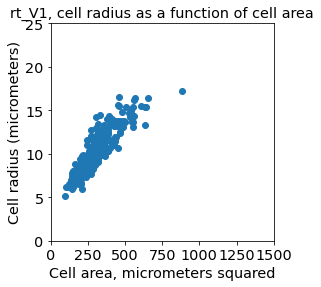

In [23]:
for k in range(0,len(roi_names)-1):
    npix_iscell=np.zeros(int(ncells[k]))
    radius_iscell=np.zeros(int(ncells[k]))
    stat = np.load(paths[k] + '/stat.npy', allow_pickle=True)
    i=0
    j=0

    for i in range(0,int(nROIs[k])):
        if int(iscell[k,i,0])==1:
            npix_iscell[j]=stat[i]['npix']
            radius_iscell[j]=stat[i]['radius']
            j=j+1

    fig = plt.figure(figsize=(4,4))
    plt.scatter(npix_iscell*(res[k]**2),radius_iscell*res[k])
    plt.ylim((0,25))
    plt.xlim((0,1500))
    #plt.ylim((0,max(radius_iscell*res[k])+5))
    #plt.xlim((0,max(npix_iscell*(res[k]**2))+10))
    plt.yticks(fontsize="x-large")
    plt.ylabel("Cell radius (micrometers)", fontsize="x-large")
    plt.xticks(fontsize="x-large")
    plt.xlabel("Cell area, micrometers squared",fontsize="x-large")
    plt.title(str(roi_names[k])+", cell radius as a function of cell area",fontsize='x-large')

    plt.savefig(save_paths[k]+'/'+str(roi_names[k])+'_radius_vs_area.png', dpi=300, bbox_inches='tight')

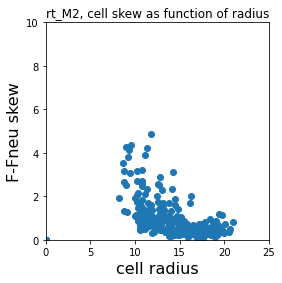

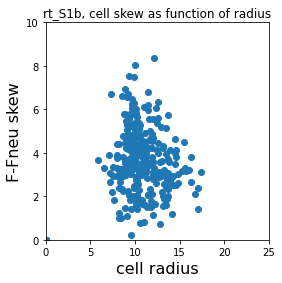

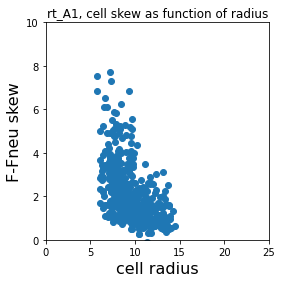

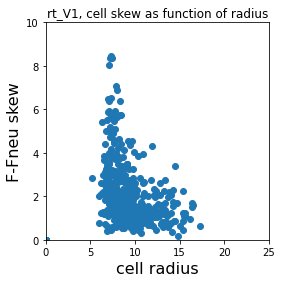

In [24]:
cell_max=0
for p in range(0,len(roi_names)-1):
    if ncells[p]>cell_max:
        cell_max=ncells[p]

skew_iscell=np.zeros((int(len(roi_names)-1),int(cell_max)))
radius_iscell=np.zeros((int(len(roi_names)-1),int(cell_max)))
med_iscell=np.zeros((int(len(roi_names)-1),2,int(cell_max)))

for p in range(0,len(roi_names)-1):
    stat = np.load(paths[p] + '/stat.npy', allow_pickle=True)
    i=0
    j=0

    for i in range(0,int(nROIs[p])):
        if int(iscell[p,i,0])==1:
            skew_iscell[p,j]=stat[i]['skew']
            radius_iscell[p,j]=stat[i]['radius']
            temp=stat[i]['med']
            med_iscell[p,0,j]=temp[0]
            med_iscell[p,1,j]=temp[1]
            j=j+1

    fig = plt.figure(figsize=(4,4))
    plt.scatter(radius_iscell[p,:]*res[p],skew_iscell[p,:])
    plt.ylim((0,10))
    plt.xlim((0,25))
    plt.xlabel('cell radius', fontsize=16)
    plt.ylabel('F-Fneu skew', fontsize=16)
    plt.title(str(roi_names[p])+", cell skew as function of radius")
    plt.savefig(save_paths[p]+'/'+str(roi_names[p])+'_Fsub_skew_vs_radius.png', dpi=300, bbox_inches='tight')

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1848: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1848: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1848: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1848: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


<Figure size 288x288 with 0 Axes>

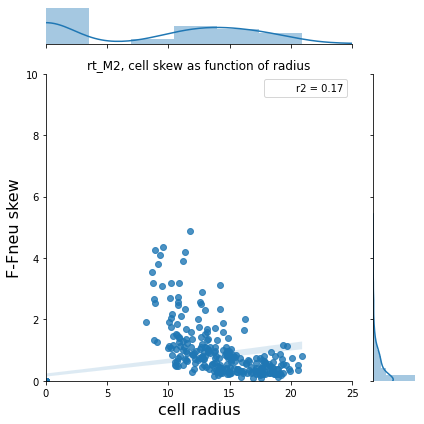

<Figure size 288x288 with 0 Axes>

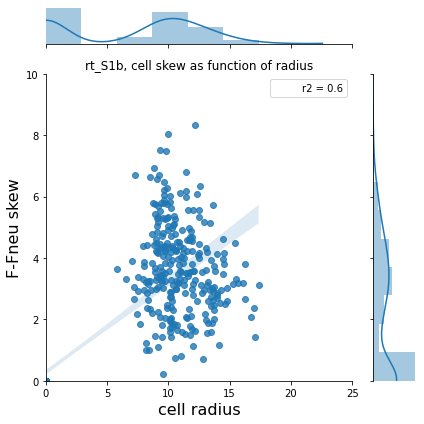

<Figure size 288x288 with 0 Axes>

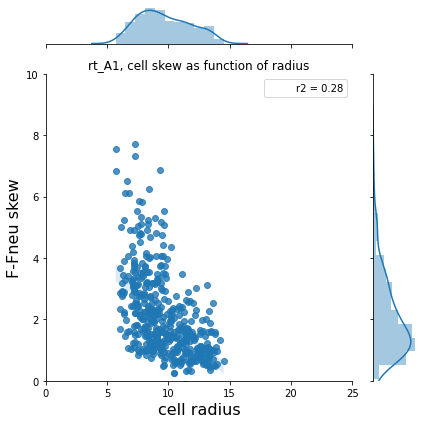

<Figure size 288x288 with 0 Axes>

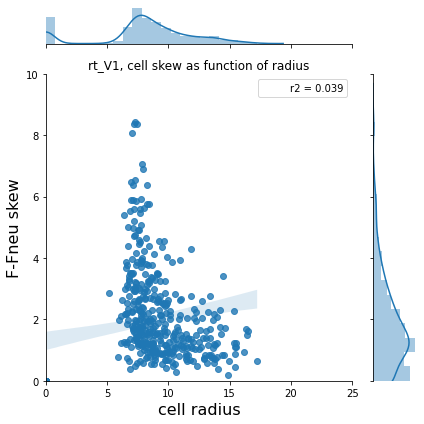

In [25]:
from scipy import stats

def r2(x, y):
    return stats.pearsonr(radius_iscell[p,:], skew_iscell[p,:])[0] ** 2

cell_max=0
for p in range(0,len(roi_names)-1):
    if ncells[p]>cell_max:
        cell_max=ncells[p]

skew_iscell=np.zeros((int(len(roi_names)-1),int(cell_max)))
radius_iscell=np.zeros((int(len(roi_names)-1),int(cell_max)))
med_iscell=np.zeros((int(len(roi_names)-1),2,int(cell_max)))

for p in range(0,len(roi_names)-1):
    stat = np.load(paths[p] + '/stat.npy', allow_pickle=True)
    i=0
    j=0

    for i in range(0,int(nROIs[p])):
        if int(iscell[p,i,0])==1:
            skew_iscell[p,j]=stat[i]['skew']
            radius_iscell[p,j]=stat[i]['radius']
            temp=stat[i]['med']
            med_iscell[p,0,j]=temp[0]
            med_iscell[p,1,j]=temp[1]
            j=j+1
            
    fig = plt.figure(figsize=(4,4))
    h=sns.jointplot(radius_iscell[p,:]*res[p],skew_iscell[p,:],kind="reg",stat_func=r2)
    h.set_axis_labels('cell radius', 'F-Fneu skew', fontsize=16)
    plt.title(str(roi_names[p])+", cell skew as function of radius")
    plt.ylim((0,10))
    plt.xlim((0,25))
    plt.tight_layout()

    plt.savefig(save_paths[p]+'/'+str(roi_names[p])+'_Fsub_skew_vs_radius.png', dpi=300, bbox_inches='tight')

How many DPSS windows do you want? 8
What window length do you want (s)? 200
What standardized half bandwidth do you want to use (old=8)? 8


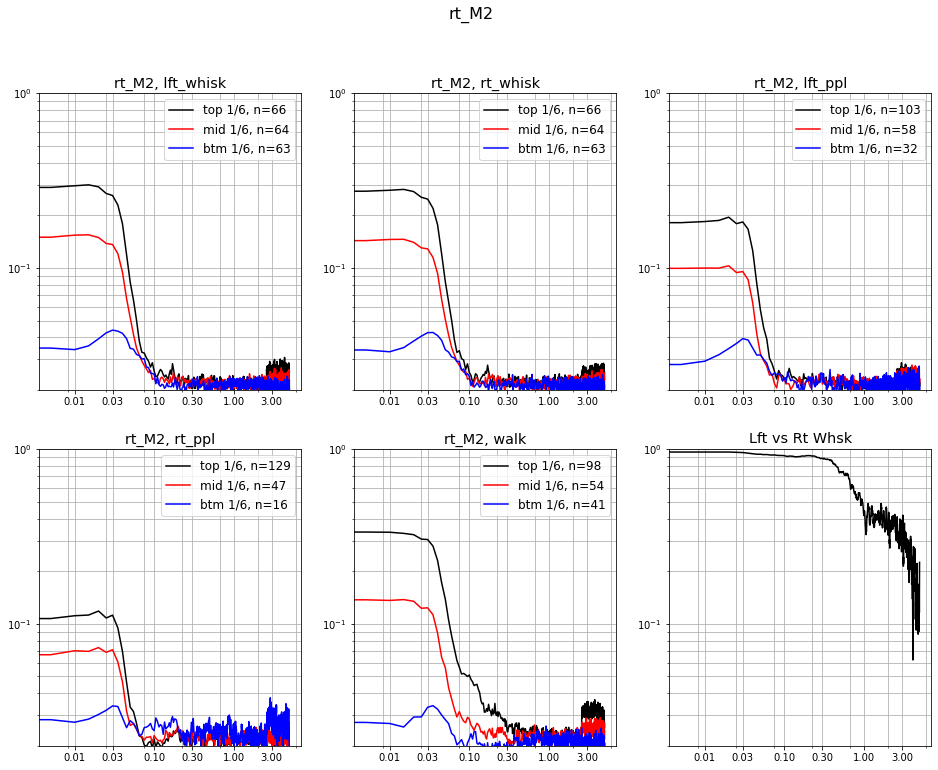

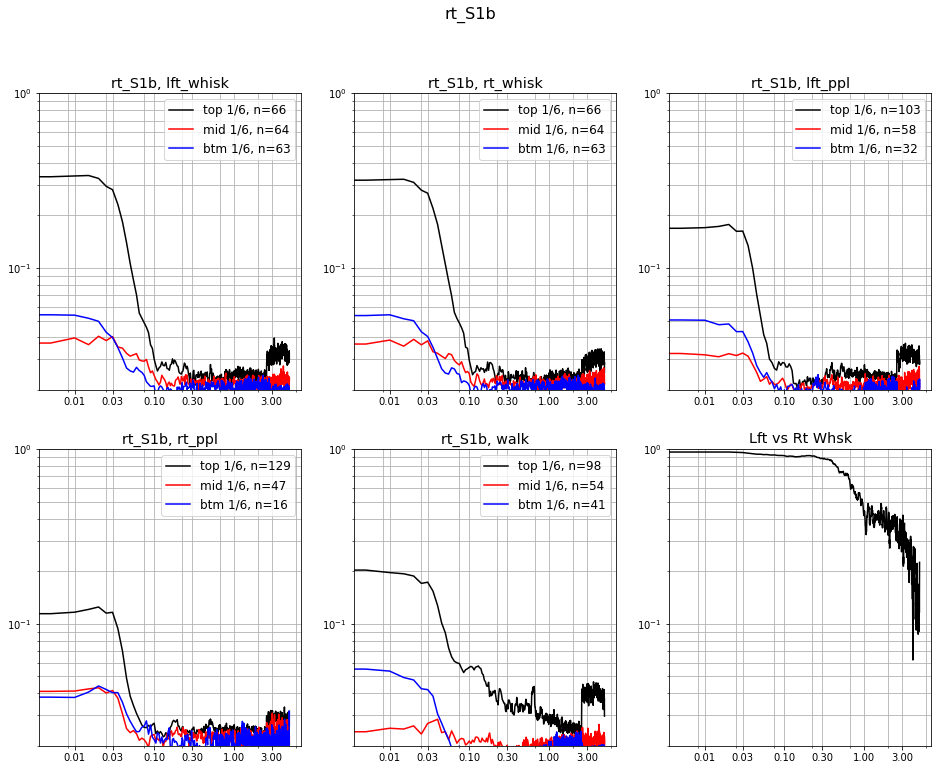

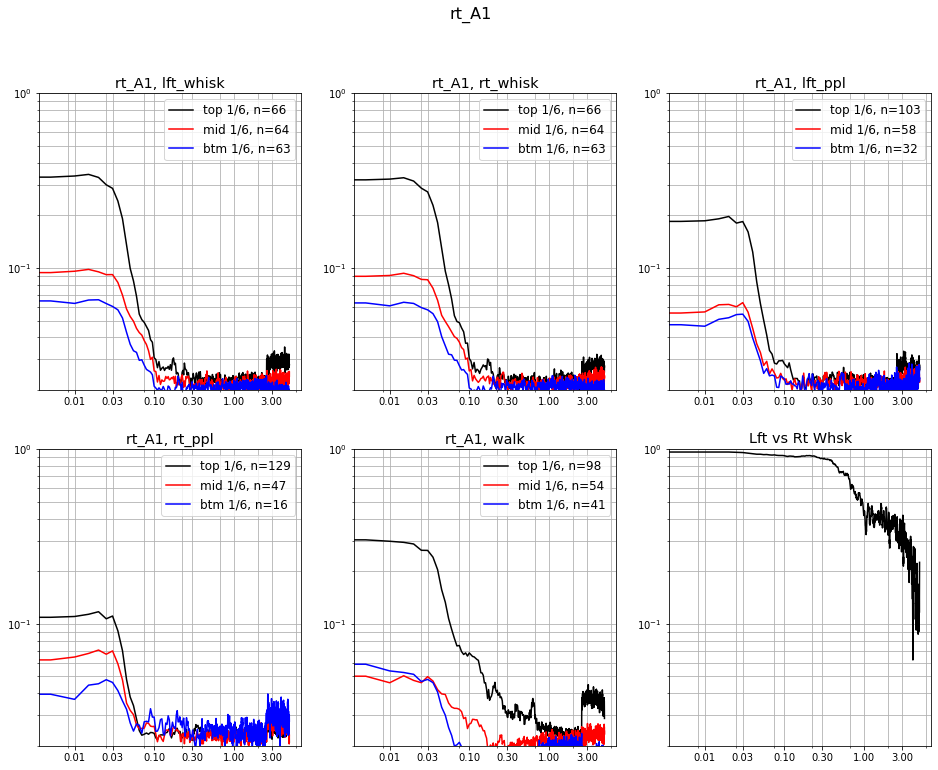

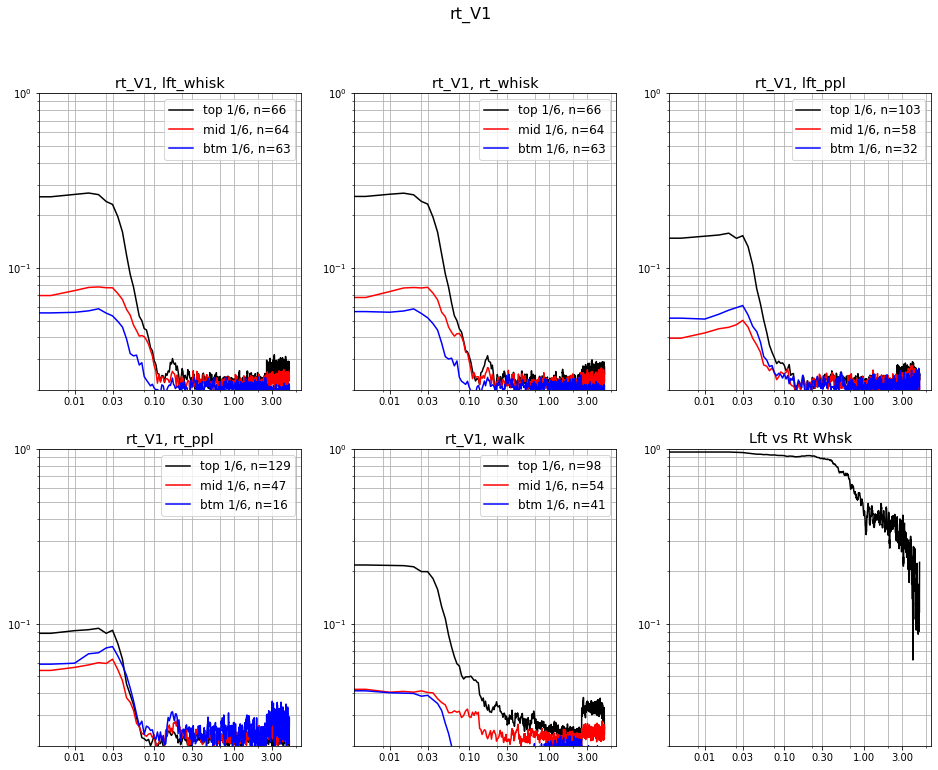

In [27]:
## Run coherence with multitaper windows (dpss), all

from scipy import signal
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from scipy import stats

%matplotlib inline

kmax_usr=int(input("How many DPSS windows do you want?"))
win_len=float(input("What window length do you want (s)?"))
NW=int(input("What standardized half bandwidth do you want to use (old=8)?"))

f_pts=(rate*(win_len/2))+1
#f_pts=1001
#kmax_usr=8

split_count=np.zeros((int(len(roi_names[p])-1),len(behav),3),dtype=int)
split=np.zeros((int(len(roi_names[p])-1)),dtype=int)

for p in range(0,len(roi_names)-1):
    if ncells[p]<100:
        split[p]=1
    elif ncells[p]<500:
        split[p]=2
    else:
        split[p]=3

    for z in range(0,len(behav)):
        split_count[p,z,0]=eval(behav[z]+'_top_count')
        split_count[p,z,1]=eval(behav[z]+'_mid_count')
        split_count[p,z,2]=eval(behav[z]+'_btm_count')

micro_ratio=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
end=np.zeros((int(len(roi_names[p])-1),len(behav),3,1),dtype=float)
micro_range=np.zeros((int(len(roi_names[p])-1)),dtype=int)
micro_max=0

for p in range(0,len(roi_names)-1):                     
    for z in range(0,len(behav)):
        for y in range(0,3):
            end[p,z,y,0]=int(m.floor(split_count[p,z,y]/split[p]))
            if end[p,z,y,0]>micro_range[p]:
                micro_range[p]=end[p,z,y,0]
                if micro_range[p]>micro_max:
                    micro_max=micro_range[p]

micro_count=np.zeros((int(len(roi_names[p])-1),len(behav),3,1),dtype=float)
micro_IDs=np.zeros((int(len(roi_names[p])-1),len(behav),3,int(micro_max)),dtype=float)
micro_real_IDs=np.zeros((int(len(roi_names[p])-1),int(ncells[p])),dtype=int)
micro_index_IDs=np.zeros((int(len(roi_names[p])-1),len(behav),int(ncells[p])))
micro_ratio=np.zeros((int(len(roi_names[p])-1),len(behav),3,int(micro_max)),dtype=float)
micro_zscore=np.zeros((int(len(roi_names[p])-1),len(behav),3,int(micro_max)),dtype=float)                

#Initialize coherence intermediates
f_ind=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
Cxy_ind=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
f_sum=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
Cxy_sum=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
f_sub=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
Cxy_sub=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
f_sub_avg=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
Cxy_sub_avg=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
f_avg=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
Cxy_avg=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)

min_pwr=np.zeros((int(len(roi_names[p])-1),len(behav)),dtype=float)
max_pwr=np.zeros((int(len(roi_names[p])-1),len(behav)),dtype=float)

for p in range(0,len(roi_names)-1):    
    #All five behaviors looped, include plotting of locations of cells with high microarousal coherence
    for z in range(0,len(behav)):
        for y in range(0,3):#split by thirds based on correlation strength percentile
            #run coherence
            #end=int(m.floor(split_count[z,y]/split))
            for i in range(0,int(end[p,z,y,0])):
                v=signal.windows.dpss(int(rate*win_len), int(NW), Kmax=int(kmax_usr), sym=False, norm=None, return_ratios=False)
                for j in range(0,kmax_usr):
                    if y==0:
                        temp=eval('bcloc_'+behav[z]+'_sort_list['+str(p)+'].'+'index'+'['+str(int(ncells[p]-i-1))+']')
                    if y==1:
                        temp=eval('bcloc_'+behav[z]+'_sort_list['+str(p)+'].'+'index'+'['+str(int(m.floor(ncells[p]/2)-10+i))+']')
                    elif y==2:
                        temp=eval('bcloc_'+behav[z]+'_sort_list['+str(p)+'].'+'index'+'['+str(i)+']')
                    f, Cxy = signal.coherence(behav_frame_list[p][behav[z]], F_df_iscell_norm[p,temp],fs=rate, 
                                              window=v[j,:], nperseg=int(rate*win_len), axis=0)
                    f_ind[p,z,y,:]=f
                    Cxy_ind[p,z,y,:]=Cxy
                    f_sub[p,z,y,:]=f_sub[p,z,y,:]+f_ind[p,z,y,:]
                    Cxy_sub[p,z,y,:]=Cxy_sub[p,z,y,:]+Cxy_ind[p,z,y,:]

                #find cells with prominent microarousal signatures
                Cxy_ser=pd.Series(Cxy[0:m.floor((rate*(win_len/2)+1)/(rate/2))])
                f_ser=pd.Series(f[0:m.floor((rate*(win_len/2)+1)/(rate/2))])
                Cxy_ser_smth=pd.Series(Cxy[0:m.floor(((rate*(win_len/2)+1)/(rate/2))/10)])
                f_ser_smth=pd.Series(f[0:m.floor(((rate*(win_len/2)+1)/(rate/2))/10)])

                for k in range(0,m.floor(((rate*(win_len/2)+1)/(rate/2))/10)):
                    if k<1:
                        Cxy_ser_smth[k]=pd.Series.mean(Cxy_ser[0:4])
                        f_ser_smth[k]=0
                    elif k<(m.floor(((rate*(win_len/2)+1)/(rate/2))/10)-1):
                        Cxy_ser_smth[k]=pd.Series.mean(Cxy_ser[((k*10)-5):((i*10)+4)])
                        f_ser_smth[k]=f_ser[k]*rate
                    else:
                        Cxy_ser_smth[k]=pd.Series.mean(Cxy_ser[((k*10)-5):(k*10)])
                        f_ser_smth[k]=f_ser[k]*rate

                if np.mean(Cxy_ser_smth[4:6])>0.08 and Cxy_ser_smth[2:3].is_monotonic_decreasing:
                    micro_count[p,z,y,0]=micro_count[p,z,y,0]+1
                    micro_IDs[p,z,y,i]=1
                    micro_real_IDs[p,temp]=1
                    micro_index_IDs[p,z,temp]=1
                micro_ratio[p,z,y,i]=np.mean(Cxy_ser_smth[3:7])/np.mean(Cxy_ser_smth[1:2])

            micro_zscore[p,z,y,:]=scipy.stats.zscore(micro_ratio[p,z,y,:],axis=0,ddof=0,nan_policy='omit')
            for g in range(0,int(micro_range[p])):
                if np.isnan(micro_zscore[p,z,y,g])==True:
                    micro_zscore[p,z,y,g]=0

            #Continue
            f_sub_avg[p,z,y,:]=f_sub[p,z,y,:]/(j+1)
            Cxy_sub_avg[p,z,y,:]=Cxy_sub[p,z,y,:]/(j+1)

            f_sum[p,z,y,:]=f_sum[p,z,y,:]+f_sub_avg[p,z,y,:]
            Cxy_sum[p,z,y,:]=Cxy_sum[p,z,y,:]+Cxy_sub_avg[p,z,y,:]

            f_avg[p,z,y,:]=f_sum[p,z,y,:]/m.floor(split_count[p,z,y]/split[p])
            Cxy_avg[p,z,y,:]=Cxy_sum[p,z,y,:]/m.floor(split_count[p,z,y]/split[p])          

        min_pwr[p,z]=min(min(Cxy_avg[p,z,0,:]),min(Cxy_avg[p,z,1,:]),min(Cxy_avg[p,z,2,:]))
        max_pwr[p,z]=max(max(Cxy_avg[p,z,0,:]),max(Cxy_avg[p,z,1,:]),max(Cxy_avg[p,z,2,:]))

        #plot outputs, first 5 out of 6 panels
        if z==0:
            fig = plt.figure(figsize=(16,12))
        axis_name='ax'+str(z)
        axis_name = fig.add_subplot(2,3,z+1)
        line1, = plt.semilogy(f_avg[p,z,0,:], Cxy_avg[p,z,0,:], color='black')
        line2, = plt.semilogy(f_avg[p,z,1,:], Cxy_avg[p,z,1,:], color='red')
        line3, = plt.semilogy(f_avg[p,z,2,:], Cxy_avg[p,z,2,:], color='blue')
        axis_name.set_title(str(roi_names[p])+', '+behav[z], fontsize='x-large')
        axis_name.legend((line1, line2, line3), ('top 1/'+str(3*split[p])+', n='+str(m.floor(split_count[p,z,0]/split[p])), 
                                                         'mid 1/'+str(3*split[p])+', n='+str(m.floor(split_count[p,z,1]/split[p])),
                                                         'btm 1/'+str(3*split[p])+', n='+str(m.floor(split_count[p,z,2]/split[p]))), fontsize='large')
        axis_name.set_xscale('log',base=3)
        axis_name.set_ylim(0.02,1)
        axis_name.set_xticks([0.01,0.03,0.1,0.3,1,3])
        axis_name.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
        axis_name.grid(b="True", which="both")

    #Left Whisker vs Right Whisker
    z=len(behav)
    y=0

    v=signal.windows.dpss(int(rate*win_len), int(NW), Kmax=int(kmax_usr), sym=False, norm=None, return_ratios=False)

    for j in range(kmax_usr):
        f, Cxy = signal.coherence(lft_whisk_dwnsamp[:,0], rt_whisk_dwnsamp[:,0],fs=rate,window=v[j,:], nperseg=rate*200, axis=0)
        f_ind[p,z,y,:]=f
        Cxy_ind[p,z,y,:]=Cxy
        f_sub[p,z,y,:]=f_sub[p,z,y,:]+f_ind[p,z,y,:]
        Cxy_sub[p,z,y,:]=Cxy_sub[p,z,y,:]+Cxy_ind[p,z,y,:]

    f_avg[p,z,y,:]=f_sub[p,z,y,:]/(j+1)
    Cxy_avg[p,z,y,:]=Cxy_sub[p,z,y,:]/(j+1)

    whiskers_min_pwr=min(Cxy_avg[p,z,y,:])
    whiskers_max_pwr=max(Cxy_avg[p,z,y,:])

    #plot output

    ax5 = fig.add_subplot(2,3,6)
    line1, = plt.semilogy(f_avg[p,z,y,:], Cxy_avg[p,z,y,:], color='black')
    ax5.set_title('Lft vs Rt Whsk', fontsize='x-large')
    ax5.set_xscale('log',base=3)
    ax5.set_ylim(0.02,1)
    ax5.set_xticks([0.01,0.03,0.1,0.3,1,3])
    ax5.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
    ax5.grid(b="True", which="both")

    #Final adjustments to overall figure
    min_pwr_all=min(min(min_pwr[p,:]),whiskers_min_pwr)
    #print('Minimum overall power = '+ str(min_pwr_all)+'.')
    max_pwr_all=max(max(max_pwr[p,:]),whiskers_max_pwr)

    if m.isnan(min_pwr_all):
        min_pwr_all=0.02
    if m.isnan(max_pwr_all):
        max_pwr_all=1

    fig.suptitle(str(roi_names[p]),fontsize='16')
    plt.savefig(save_paths[p]+'/'+str(roi_names[p])+'_opto_behav_cohere_all_MT_'+str(win_len)+'_'+str(kmax_usr)+'_'+str(NW)+'.png',dpi=300, bbox_inches='tight')

How many DPSS windows do you want? 8
What window length do you want (s)? 200
What standardized half bandwidth do you want to use (old=8)? 8
Do you want to use thresh and monotonicity (t_mono) or z-score (z_score) to select microarousal traces? z_score
What z_score cutoff do you want to use (positive, one-tailed)? 1.5


ok


Which area do you want to run? rt_S1b


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:99: RuntimeWarning: invalid value encountered in true_divide
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide


275
279.0


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:303: RuntimeWarning: invalid value encountered in true_divide


277
279.0


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:303: RuntimeWarning: invalid value encountered in true_divide


259
279.0


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:303: RuntimeWarning: invalid value encountered in true_divide


263
279.0


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:303: RuntimeWarning: invalid value encountered in true_divide


256
279.0


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:303: RuntimeWarning: invalid value encountered in true_divide


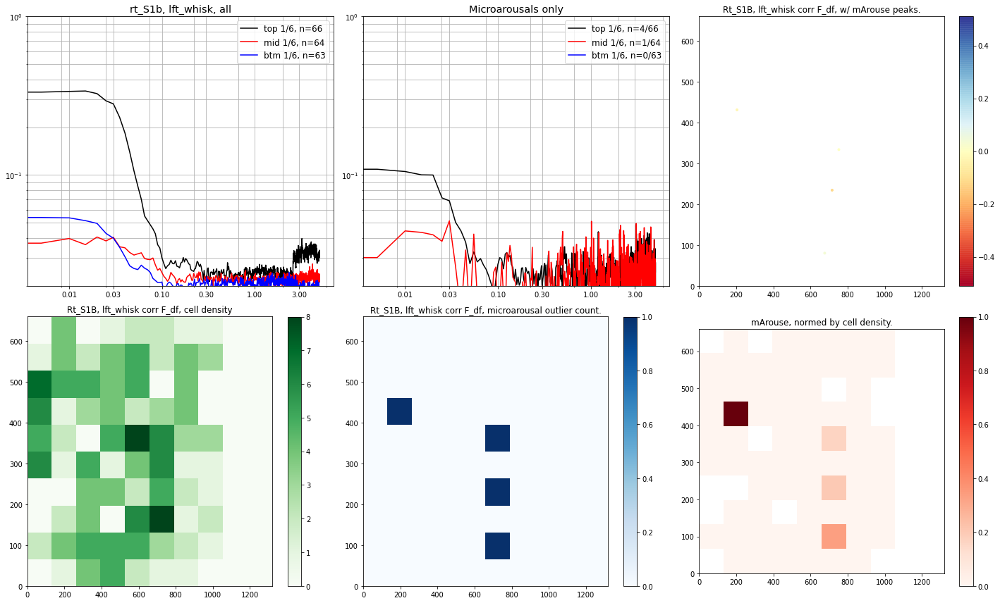

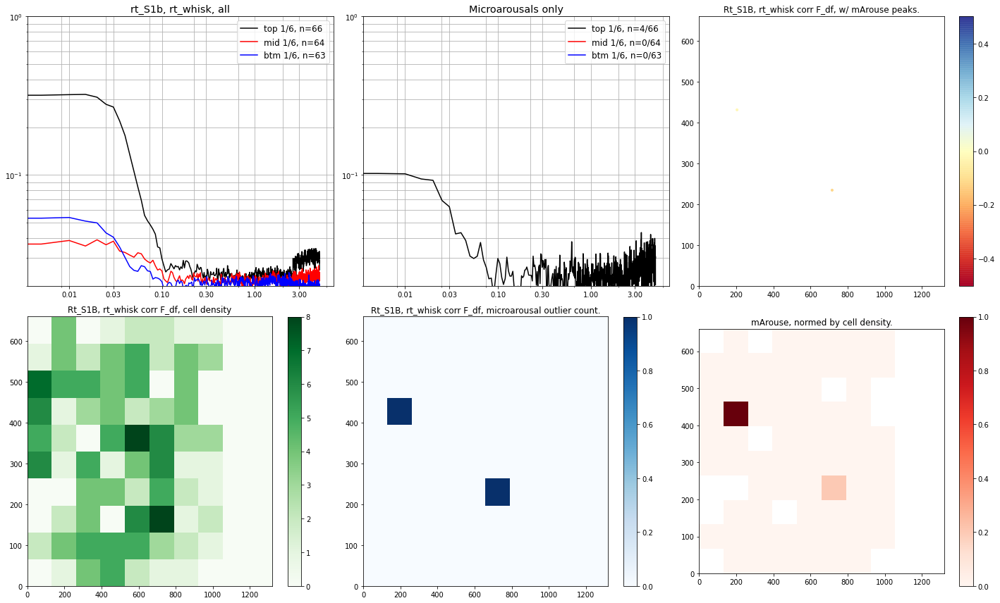

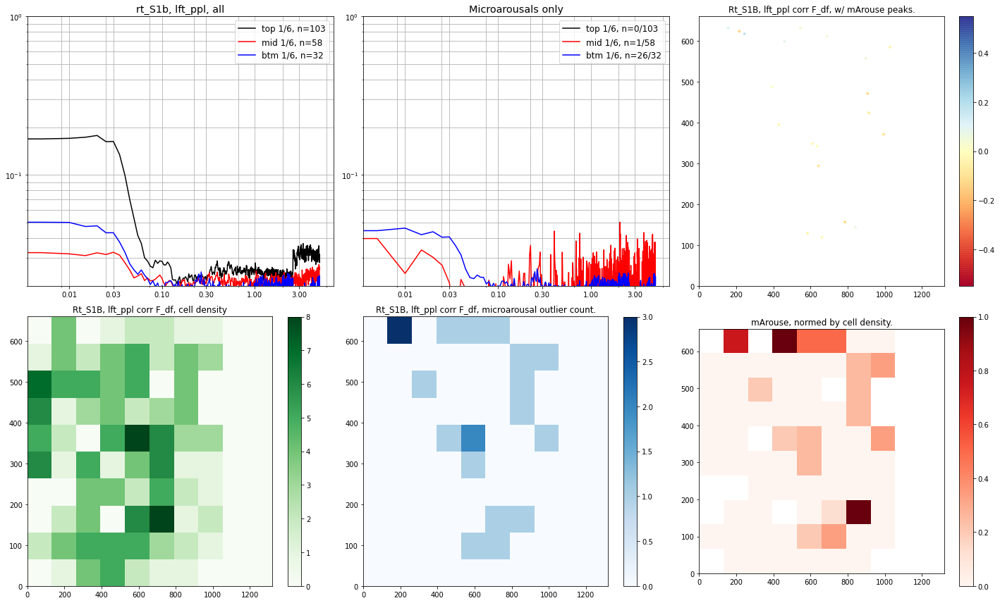

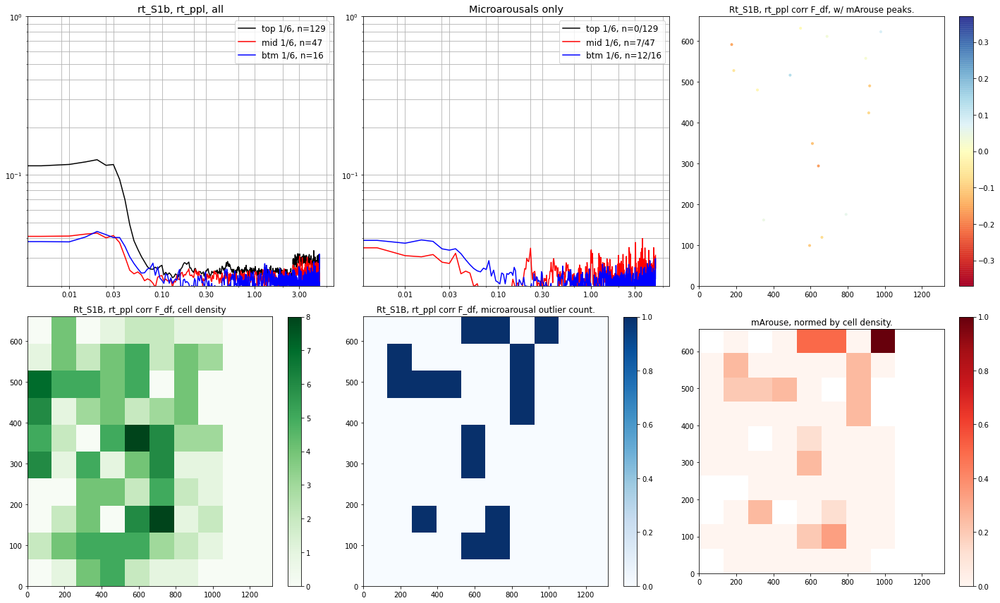

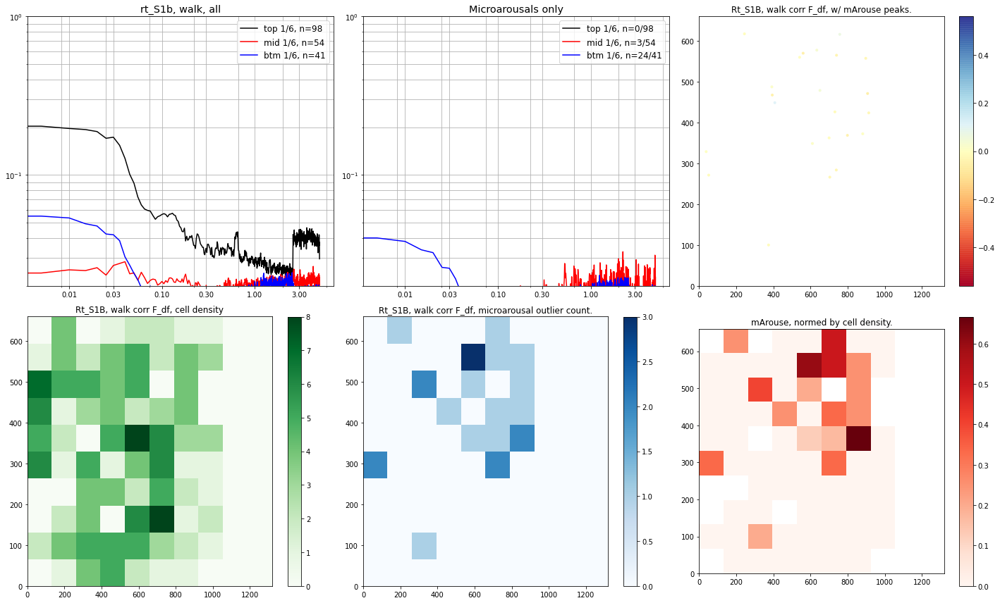

In [29]:
## Run coherence with multitaper windows (dpss), microarousals only

from scipy import signal
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from scipy import stats
import copy as cp

%matplotlib inline

kmax_usr_m=int(input("How many DPSS windows do you want?"))
win_len_m=float(input("What window length do you want (s)?"))
NW_m=int(input("What standardized half bandwidth do you want to use (old=8)?"))
micro_criteria=input("Do you want to use thresh and monotonicity (t_mono) or z-score (z_score) to select microarousal traces?")
f_pts_m=(rate*(win_len_m/2))+1

if micro_criteria=="z_score":
    micro_zscore_cutoff=float(input("What z_score cutoff do you want to use (positive, one-tailed)?"))

max_ncells=0
for p in range(0,len(roi_names)-1):
    if ncells[p]>max_ncells:
        max_ncells=ncells[p]
    
if micro_criteria=="z_score":
    micro_count=np.zeros((int(len(roi_names)-1),len(behav),3,1),dtype=float)
    micro_IDs=np.zeros((int(len(roi_names)-1),len(behav),3,int(micro_max)),dtype=float)
    micro_real_IDs=np.zeros((int(len(roi_names)-1),int(max_ncells)),dtype=int)
    micro_index_IDs=np.zeros((int(len(roi_names)-1),len(behav),int(max_ncells)))
    micro_choose=np.zeros((int(len(roi_names)-1),len(behav),3,micro_max),dtype=float)
    print("ok")
elif micro_criteria=="t_mono":
    micro_choose=cp.copy(micro_IDs)
    print("ok")
else:
    print("you loose!")

if micro_criteria=="z_score":
    for p in range(0,len(roi_names)-1):
        for z in range(0,len(behav)):
            for y in range(0,3):#split by thirds based on correlation strength percentile
                for i in range(0,int(end[p,z,y,0])):
                    if micro_zscore[p,z,y,i]>micro_zscore_cutoff:
                        micro_choose[p,z,y,i]=1
                    else:
                        micro_choose[p,z,y,i]=0

#Initialize coherence intermediates
f_ind_m=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
Cxy_ind_m=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
f_sum_m=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
Cxy_sum_m=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
f_sub_m=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
Cxy_sub_m=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
f_sub_avg_m=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
Cxy_sub_avg_m=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
f_avg_m=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
Cxy_avg_m=np.zeros((int(len(roi_names[p])-1),len(behav)+1,3,int(f_pts)),dtype=float)
min_pwr_m=np.zeros((int(len(roi_names[p])-1),len(behav)),dtype=float)
max_pwr_m=np.zeros((int(len(roi_names[p])-1),len(behav)),dtype=float)                        

area_run=str(input("Which area do you want to run?"))
p=int(roi_names.index(area_run))
for zzz in range(0,1):
#for p in range(0,len(roi_names)-1):
    #All five behaviors looped, include plotting of locations of cells with high microarousal coherence
    #del v
    for z in range(0,len(behav)):
        for y in range(0,3):#split by thirds based on correlation strength percentile
            for i in range(0,int(end[p,z,y,0])):
                if micro_choose[p,z,y,i]==1:
                    v=signal.windows.dpss(int(rate*win_len_m), int(NW_m), Kmax=int(kmax_usr_m), sym=False, norm=None, return_ratios=False)
                    for j in range(0,kmax_usr_m):
                        if y==0:
                            temp=eval('bcloc_'+behav[z]+'_sort_list['+str(p)+'].'+'index'+'['+str(int(ncells[p]-i-1))+']')
                        if y==1:
                            temp=eval('bcloc_'+behav[z]+'_sort_list['+str(p)+'].'+'index'+'['+str(int(m.floor(ncells[p]/2)-10+i))+']')
                        elif y==2:
                            temp=eval('bcloc_'+behav[z]+'_sort_list['+str(p)+'].'+'index'+'['+str(i)+']')
                        f, Cxy = signal.coherence(behav_frame_list[p][behav[z]], F_df_iscell_norm[p,temp],fs=rate, 
                                                  window=v[j,:], nperseg=int(rate*win_len_m), axis=0)
                        f_ind_m[p,z,y,:]=f
                        Cxy_ind_m[p,z,y,:]=Cxy
                        f_sub_m[p,z,y,:]=f_sub_m[p,z,y,:]+f_ind_m[p,z,y,:]
                        Cxy_sub_m[p,z,y,:]=Cxy_sub_m[p,z,y,:]+Cxy_ind_m[p,z,y,:]

                if micro_criteria=="z_score" and micro_zscore[p,z,y,i]>micro_zscore_cutoff:
                    micro_count[p,z,y,0]=micro_count[p,z,y,0]+1
                    micro_IDs[p,z,y,i]=1
                    micro_real_IDs[p,temp]=1
                    micro_index_IDs[p,z,temp]=1

            f_sub_avg_m[p,z,y,:]=f_sub_m[p,z,y,:]/(j+1)
            Cxy_sub_avg_m[p,z,y,:]=Cxy_sub_m[p,z,y,:]/(j+1)

            f_sum_m[p,z,y,:]=f_sum_m[p,z,y,:]+f_sub_avg_m[p,z,y,:]
            Cxy_sum_m[p,z,y,:]=Cxy_sum_m[p,z,y,:]+Cxy_sub_avg_m[p,z,y,:]

            f_avg_m[p,z,y,:]=f_sum_m[p,z,y,:]/micro_count[p,z,y,0]
            Cxy_avg_m[p,z,y,:]=Cxy_sum_m[p,z,y,:]/micro_count[p,z,y,0]          

        min_pwr_m[p,z]=min(min(Cxy_avg_m[p,z,0,:]),min(Cxy_avg_m[p,z,1,:]),min(Cxy_avg_m[p,z,2,:]))
        max_pwr_m[p,z]=max(max(Cxy_avg_m[p,z,0,:]),max(Cxy_avg_m[p,z,1,:]),max(Cxy_avg_m[p,z,2,:]))

    for z in range(0,len(behav)):
        fig = plt.figure(figsize=(20,12))

        #Plot average traces for all, then just microarousal cells   
        axis_name='ax'+str(0)
        axis_name = fig.add_subplot(2,3,1)
        line1, = plt.semilogy(f_avg[p,z,0,:], Cxy_avg[p,z,0,:], color='black')
        line2, = plt.semilogy(f_avg[p,z,1,:], Cxy_avg[p,z,1,:], color='red')
        line3, = plt.semilogy(f_avg[p,z,2,:], Cxy_avg[p,z,2,:], color='blue')
        axis_name.set_title(str(roi_names[p])+', '+behav[z]+', all', fontsize='x-large')
        axis_name.legend((line1, line2, line3), ('top 1/'+str(3*split[p])+', n='+str(m.floor(split_count[p,z,0]/split[p])),
                                                 'mid 1/'+str(3*split[p])+', n='+str(m.floor(split_count[p,z,1]/split[p])),
                                                 'btm 1/'+str(3*split[p])+', n='+str(m.floor(split_count[p,z,2]/split[p]))),
                                                 fontsize='large')
        axis_name.set_xscale('log',base=3)
        axis_name.set_ylim(0.02,1)
        axis_name.set_xticks([0.01,0.03,0.1,0.3,1,3])
        axis_name.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
        axis_name.grid(b="True", which="both")    

        axis_name='ax'+str(1)
        axis_name = fig.add_subplot(2,3,2)
        line1, = plt.semilogy(f_avg_m[p,z,0,:], Cxy_avg_m[p,z,0,:], color='black')
        line2, = plt.semilogy(f_avg_m[p,z,1,:], Cxy_avg_m[p,z,1,:], color='red')
        line3, = plt.semilogy(f_avg_m[p,z,2,:], Cxy_avg_m[p,z,2,:], color='blue')
        axis_name.set_title('Microarousals only', fontsize='x-large')
        axis_name.legend((line1, line2, line3), ('top 1/'+str(3*split[p])+', n='+str(int(micro_count[p,z,0,0]))+'/'+str(m.floor(split_count[p,z,0]/split[p])), 
                                                 'mid 1/'+str(3*split[p])+', n='+str(int(micro_count[p,z,1,0]))+'/'+str(m.floor(split_count[p,z,1]/split[p])),
                                                 'btm 1/'+str(3*split[p])+', n='+str(int(micro_count[p,z,2,0]))+'/'+str(m.floor(split_count[p,z,2]/split[p]))),
                                                 fontsize='large')                                            
        axis_name.set_xscale('log',base=3)
        axis_name.set_ylim(0.02,1)
        axis_name.set_xticks([0.01,0.03,0.1,0.3,1,3])
        axis_name.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
        axis_name.grid(b="True", which="both")    

        #Plot locations for microarousal cells
        norm=Normalize(vmin=-1.,vmax=1.)

        super_min_corr=0
        super_max_corr=0

        if max(bcloc_lft_whisk_sort_list[p][behav[z]])>super_max_corr:
            super_max_corr=max(bcloc_lft_whisk_sort_list[p][behav[z]])
        if min(bcloc_lft_whisk_sort_list[p][behav[z]])<super_max_corr:
            super_min_corr=min(bcloc_lft_whisk_sort_list[p][behav[z]])

        if super_max_corr>super_min_corr*(-1):
            corr_abs_range=super_max_corr
        else:
            corr_abs_range=super_min_corr*(-1)

        min_corr=min(bcloc_lft_whisk_sort_list[p][behav[z]])
        max_corr=max(bcloc_lft_whisk_sort_list[p][behav[z]])

        t=np.arange(int(ncells[p]))
        t_indexed=bcloc_lft_whisk_sort_list[p][behav[z]]
        t=np.array(t_indexed)

        cell_loc_real=np.zeros((int(ncells[p]),2))
        j=0
        for k in range(int(ncells[p])):
            if iscell[p,k,0]==1:
                cell_loc_real[j,0]=cell_loc[p,k,0]
                cell_loc_real[j,1]=cell_loc[p,k,1]
                j=j+1
        j=0
        cell_loc_yflip=cp.copy(cell_loc_real)
        cell_loc_yflip[:,1]=max(cell_loc_yflip[:,1])-cell_loc_yflip[:,1]
        cell_loc_yflip_scale=cp.copy(cell_loc_yflip)
        cell_loc_yflip_scale[:,0]=cell_loc_yflip_scale[:,0]*res[p]
        cell_loc_yflip_scale[:,1]=cell_loc_yflip_scale[:,1]*res[p]
        cell_loc_ma_pos=cp.copy(cell_loc_yflip_scale)

        axis_name='ax'+str(2)
        axis_name = fig.add_subplot(2,3,3)
        not_cell=0

        for j in range(0,int(ncells[p])):
            if micro_index_IDs[p,z,j]==0:
                cell_loc_ma_pos[j,0]=-99999
                cell_loc_ma_pos[j,1]=-99999
                not_cell=not_cell+1
            if cell_loc_ma_pos[j,0]==0:
                cell_loc_ma_pos[j,0]=-44444
                cell_loc_ma_pos[j,1]=-44444
                not_cell=not_cell+1
            if cell_loc_ma_pos[j,1]==0:
                cell_loc_ma_pos[j,0]=-44444
                cell_loc_ma_pos[j,1]=-44444
                not_cell=not_cell+1
            if cell_loc_ma_pos[j,1]==y_size[p]:
                cell_loc_ma_pos[j,0]=-44444
                cell_loc_ma_pos[j,1]=-44444
                not_cell=not_cell+1

        plt.scatter(cell_loc_ma_pos[:,0], cell_loc_ma_pos[:,1], vmin=-corr_abs_range, vmax=corr_abs_range, c=t, 
                    cmap='RdYlBu', alpha=0.95, marker='.')

        plt.xlim(0,x_size[p])
        plt.ylim(0,y_size[p])
        plt.title(str(roi_names[p]).title()+', '+str(behav[z])+" corr F_df, w/ mArouse peaks.")
        plt.colorbar()
        print(not_cell)
        print(ncells[p])

        #Plot overall cell densities
        if z==0 and p==0:
            x_bins=input("How many x bins do you want?")
            y_bins=input("How many y bins do you want")
            x_bins=int(x_bins)
            y_bins=int(y_bins)

        cell_loc_real=np.zeros((int(ncells[p]),2))
        j=0
        for k in range(int(ncells[p])):
            if iscell[p,k,0]==1:
                cell_loc_real[j,0]=cell_loc[p,k,0]
                cell_loc_real[j,1]=cell_loc[p,k,1]
                j=j+1
        j=0
        cell_loc_yflip=cp.copy(cell_loc_real)
        cell_loc_yflip[:,1]=max(cell_loc_yflip[:,1])-cell_loc_yflip[:,1]
        cell_loc_yflip_scale=cp.copy(cell_loc_yflip)
        cell_loc_yflip_scale[:,0]=cell_loc_yflip_scale[:,0]*res[p]
        cell_loc_yflip_scale[:,1]=cell_loc_yflip_scale[:,1]*res[p]
        
        for j in range(0,int(ncells[p])):
            if cell_loc_yflip_scale[j,0]==0:
                cell_loc_yflip_scale[j,0]=-44444
                cell_loc_yflip_scale[j,1]=-44444
            if cell_loc_yflip_scale[j,1]==0:
                cell_loc_yflip_scale[j,0]=-44444
                cell_loc_yflip_scale[j,1]=-44444
            if cell_loc_yflip_scale[j,1]==y_size[p]:
                cell_loc_yflip_scale[j,0]=-44444
                cell_loc_yflip_scale[j,1]=-44444
        
        axis_name='ax'+str(3)
        axis_name = fig.add_subplot(2,3,4)

        h_cells=plt.hist2d(cell_loc_yflip_scale[:,0], cell_loc_yflip_scale[:,1], bins=(x_bins, y_bins), range=((0,x_size[p]),
                           (0,y_size[p])), cmap=plt.cm.Greens)
        plt.xlim(0,x_size[p])
        plt.ylim(0,y_size[p])
        plt.title(str(roi_names[p]).title()+', '+str(behav[z])+" corr F_df, cell density")
        plt.colorbar()

        #Plot microarousal cell densities
        axis_name='ax'+str(4)
        axis_name = fig.add_subplot(2,3,5)

        cell_loc_real=np.zeros((int(ncells[p]),2))
        j=0
        for k in range(int(ncells[p])):
            if iscell[p,k,0]==1:
                cell_loc_real[j,0]=cell_loc[p,k,0]
                cell_loc_real[j,1]=cell_loc[p,k,1]
                j=j+1
        j=0
        cell_loc_yflip=cp.copy(cell_loc_real)
        cell_loc_yflip[:,1]=max(cell_loc_yflip[:,1])-cell_loc_yflip[:,1]
        cell_loc_yflip_scale=cp.copy(cell_loc_yflip)
        cell_loc_yflip_scale[:,0]=cell_loc_yflip_scale[:,0]*res[p]
        cell_loc_yflip_scale[:,1]=cell_loc_yflip_scale[:,1]*res[p]

        cell_loc_ma_pos=cp.copy(cell_loc_yflip_scale)

        not_cell=0

        for j in range(0,int(ncells[p])):
            if micro_index_IDs[p,z,j]==0:
                cell_loc_ma_pos[j,0]=-99999
                cell_loc_ma_pos[j,1]=-99999
                not_cell=not_cell+1
            if cell_loc_ma_pos[j,0]==0:
                cell_loc_ma_pos[j,0]=-44444
                cell_loc_ma_pos[j,1]=-44444
                not_cell=not_cell+1
            if cell_loc_ma_pos[j,1]==0:
                cell_loc_ma_pos[j,0]=-44444
                cell_loc_ma_pos[j,1]=-44444
                not_cell=not_cell+1
            if cell_loc_ma_pos[j,1]==y_size[p]:
                cell_loc_ma_pos[j,0]=-44444
                cell_loc_ma_pos[j,1]=-44444
                not_cell=not_cell+1
        h_mArouse=plt.hist2d(cell_loc_ma_pos[:,0], cell_loc_ma_pos[:,1], bins=(x_bins, y_bins), range=((0,x_size[p]),
                         (0,y_size[p])), cmap=plt.cm.Blues)
        plt.xlim(0,x_size[p])
        plt.ylim(0,y_size[p])            
        plt.title(str(roi_names[p]).title()+', '+str(behav[z])+" corr F_df, microarousal outlier count.")
        plt.colorbar()

        #Plot microarousal cell densities, normalized to overall cell densities
        axis_name='ax'+str(5)
        axis_name = fig.add_subplot(2,3,6)

        h_mArouse_norm=h_mArouse[0]/h_cells[0]

        h_mArouse_norm=rotate_matrix(h_mArouse_norm)

        plt.imshow(h_mArouse_norm,cmap="Reds",extent=[0,x_size[p],0,y_size[p]],aspect=x_size[p]/y_size[p])
        plt.title("mArouse, normed by cell density.")
        plt.colorbar()
        plt.tight_layout()

        #fig.suptitle(str(roi_names[p]),fontsize='16')
        plt.savefig(save_paths[p]+'/'+str(roi_names[p])+'_opto_behav_cohere_mArouse_'+behav[z]+'_'+str(micro_criteria)+'_'+str(micro_zscore_cutoff)+'_'+str(win_len_m)+'_'+str(kmax_usr_m)+'_'+str(NW_m)+'.png', 
                    dpi=300, bbox_inches='tight')

Are there too many pairwise corrs to plot them all? (Yes/No) No


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1848: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


Success!


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1848: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


Success!


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1848: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


Success!


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1848: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


Success!


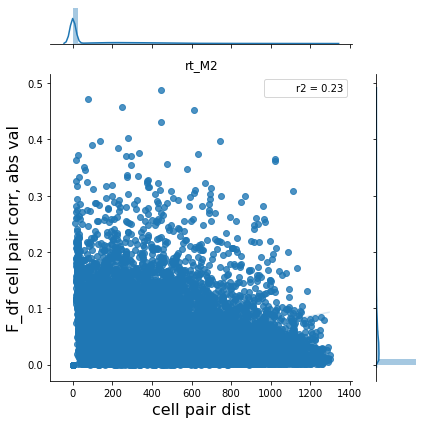

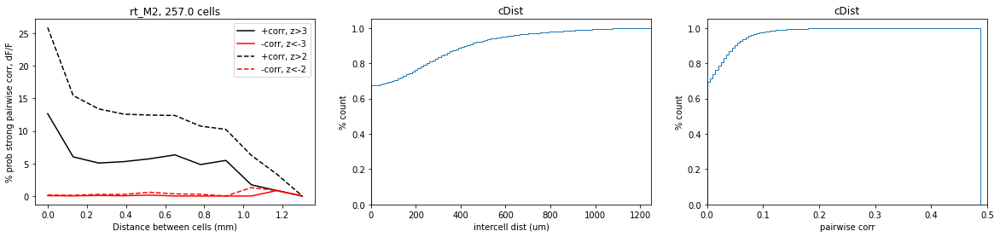

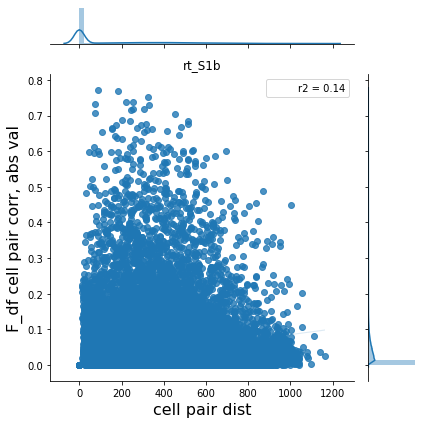

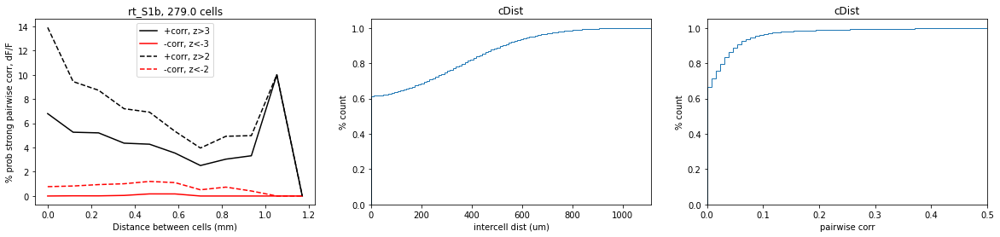

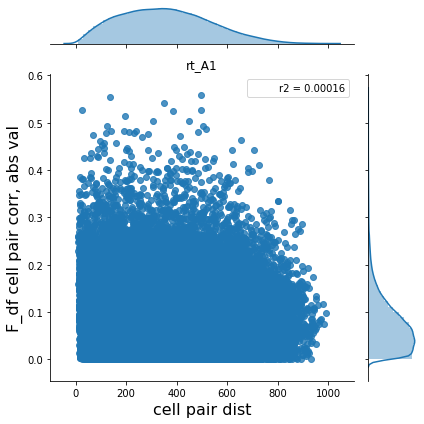

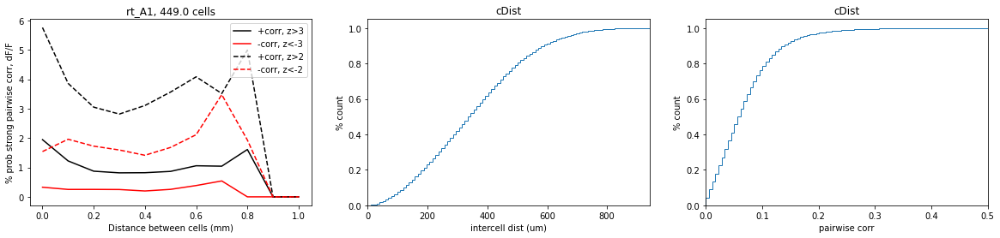

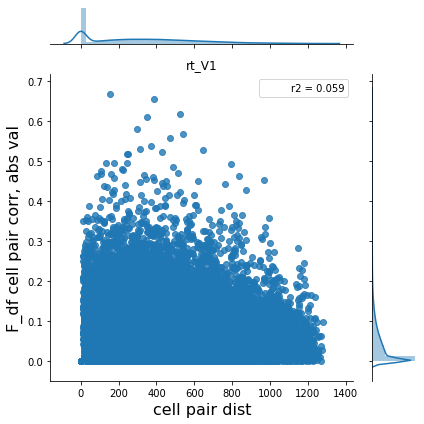

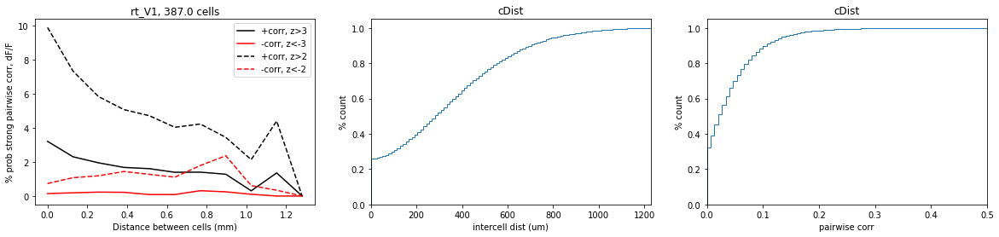

In [121]:
import math as m
from scipy import stats

dist_size=np.zeros(int(len(roi_names)-1))
corr_size=np.zeros(int(len(roi_names)-1))
                   
max_dist_size=0
max_corr_size=0
                   
cell_max=0
for p in range(0,len(roi_names)-1):
    if ncells[p]>cell_max:
        cell_max=ncells[p]   
    
for p in range(0,len(roi_names)-1):
    for i in range(0,int(ncells[p]-1)):
        for j in range(0,int(ncells[p]-1-i)):
            dist_size[p]=dist_size[p]+1
            corr_size[p]=corr_size[p]+1
    if dist_size[p]>max_dist_size:
        max_dist_size=dist_size[p]
    if corr_size[p]>max_corr_size:
        max_corr_size=corr_size[p]

dist_iscell_all=np.zeros((int(len(roi_names)-1),int(max_dist_size)))
corr_iscell_all=np.zeros((int(len(roi_names)-1),int(max_corr_size)))            
            
dist_iscell=np.zeros((int(len(roi_names)-1),int(cell_max),int(cell_max)))
corr_iscell_zscore=np.zeros((int(len(roi_names)-1),int(max_corr_size)))
dist_iscell_zscore=np.zeros((int(len(roi_names)-1),int(max_dist_size)))

no_plot=input("Are there too many pairwise corrs to plot them all? (Yes/No)")

F_df_cMat_list=[]

for p in range(0,len(roi_names)-1):
    #get all F_df correlations
    #F_df_cMat=np.corrcoef(F_df_iscell[:],F_df_iscell[:])
    F_df_cMat=np.corrcoef(F_df_iscell_norm[p,:],F_df_iscell_norm[p,:])
    F_df_cMat_list.append(F_df_cMat)

    #get all intercell distances
    for i in range(0,int(ncells[p])):
        for j in range(0,int(ncells[p])):
            dist_iscell[p,i,j]=m.sqrt(((med_iscell[p,0,i]-med_iscell[p,0,j])**2)+((med_iscell[p,1,i]-med_iscell[p,1,j])**2))*res[p]
    #plt.plot(dist_iscell[0,:])

    #plot F_df corr as function of intercell distance, run regression, plot histograms
    c=0
    for i in range(0,int(ncells[p])):
        for j in range(0,int(ncells[p])):
            if i != j & j>i:
                #print(c)
                dist_iscell_all[p,c]=dist_iscell[p,i,j]
                corr_iscell_all[p,c]=F_df_cMat[i,j]
                c=c+1

    def r2(x, y):
        return stats.pearsonr(dist_iscell_all[p,:], abs(corr_iscell_all[p,:]))[0] ** 2

    if no_plot!="Yes":
        h=sns.jointplot(dist_iscell_all[p,:],abs(corr_iscell_all[p,:]),kind="reg", stat_func=r2)
        h.set_axis_labels('cell pair dist', 'F_df cell pair corr, abs val', fontsize=16)
        plt.title(roi_names[p])
        plt.tight_layout()

        plt.savefig(save_paths[p]+'/'+str(roi_names[p])+'_Fdf_pairs_corr_dist_joint.png', dpi=300, bbox_inches='tight')

    corr_iscell_zscore[p,:]=scipy.stats.zscore(corr_iscell_all[p,:], axis=0, ddof=0, nan_policy='propagate')
    dist_iscell_zscore[p,:]=scipy.stats.zscore(dist_iscell_all[p,:], axis=0, ddof=0, nan_policy='propagate')

    j=0
    for i in range(0,int(corr_size[p])):
        if abs(corr_iscell_zscore[p,i])>2:
            j=j+1

    corr_sig=np.zeros(j)
    dist_sig=np.zeros(j)

    #print(max(corr_iscell_zscore))
    j=0
    max_dist=max(dist_iscell_all[p,:])

    dist_bins=np.zeros(11)
    dist_count=np.zeros(11)
    dist_pos=np.zeros(11)
    dist_neg=np.zeros(11)

    corr_pos_count_z3=np.zeros(11)
    corr_neg_count_z3=np.zeros(11)
    corr_pos_prob_z3=np.zeros(11)
    corr_neg_prob_z3=np.zeros(11)

    corr_pos_count_z2=np.zeros(11)
    corr_neg_count_z2=np.zeros(11)
    corr_pos_prob_z2=np.zeros(11)
    corr_neg_prob_z2=np.zeros(11)

    for i in range(0,len(dist_bins)):
        dist_bins[i]=j
        j=j+m.ceil(max_dist/10)
    j=0
    for i in range(0,len(corr_iscell_zscore[p,:])):
        for k in range(0,len(dist_bins)):
            if dist_iscell_all[p,i]>dist_bins[k] and dist_iscell_all[p,i]<dist_bins[k+1]:
                dist_count[k]+=1
                if corr_iscell_zscore[p,i]>3:
                    corr_pos_count_z3[k]+=1
                if corr_iscell_zscore[p,i]<-3:
                    corr_neg_count_z3[k]+=1
                if corr_iscell_zscore[p,i]>2:
                    corr_pos_count_z2[k]+=1
                if corr_iscell_zscore[p,i]<-2:
                    corr_neg_count_z2[k]+=1

    for k in range(0,len(dist_bins)):
        if dist_count[k]>0:
            corr_pos_prob_z3[k]=corr_pos_count_z3[k]/dist_count[k]
            corr_neg_prob_z3[k]=corr_neg_count_z3[k]/dist_count[k]
            corr_pos_prob_z2[k]=corr_pos_count_z2[k]/dist_count[k]
            corr_neg_prob_z2[k]=corr_neg_count_z2[k]/dist_count[k]
        else:
            corr_pos_prob_z3[k]=0
            corr_neg_prob_z3[k]=0
            corr_pos_prob_z2[k]=0
            corr_neg_prob_z2[k]=0

    fig = plt.figure(figsize=(20,4))

    ax1 = fig.add_subplot(1,3,1)
    line1, = plt.plot(dist_bins/1000,corr_pos_prob_z3*100,label='+corr, z>3', color='black')
    line2, = plt.plot(dist_bins/1000,corr_neg_prob_z3*100,label='-corr, z<-3', color='red')
    line3, = plt.plot(dist_bins/1000,corr_pos_prob_z2*100,label='+corr, z>2', color='black',linestyle='dashed')
    line4, = plt.plot(dist_bins/1000,corr_neg_prob_z2*100,label='-corr, z<-2', color='red',linestyle='dashed')
    ax1.legend()
    ax1.set_ylabel("% prob strong pairwise corr, dF/F")
    ax1.set_xlabel("Distance between cells (mm)")
    ax1.set_title(str(roi_names[p])+", "+str(ncells[p])+" cells")

    ax2 = fig.add_subplot(1,3,2)
    plt.hist(dist_iscell_all[p,:],bins=100,density=True,cumulative=True, histtype='step')
    ax2.set_title('cDist')
    ax2.set_ylabel('% count')
    ax2.set_xlabel('intercell dist (um)')
    ax2.set_xlim((0,max(dist_iscell_all[p,:])-50))

    ax3 = fig.add_subplot(1,3,3)
    plt.hist(abs(corr_iscell_all[p,:]),bins=100,density=True,cumulative=True,histtype='step')
    ax3.set_title('cDist')
    ax3.set_ylabel('% count')
    ax3.set_xlabel('pairwise corr')
    ax3.set_xlim((0,0.5))

    plt.savefig(save_paths[p]+'/'+str(roi_names[p])+'_pairwise_dff_corrs_intercell_dist.png', dpi=300, bbox_inches='tight')

    print("Success!")

What threshold do you want for 1s walking bouts, in cm/s? 0.02
What backwards-looking bout buffer do you want in s? 30
Do you want to use 'left' or 'right' whisker bouts? left
What threshold do you want for 1s whisking bouts, in ME au? 0.1
What backwards-looking bout buffer do you want in s? 30
Do you want to use 'left' or 'right' pupil epochs? left
What threshold do you want for pupil epochs, in area au? 0.06
What backwards-looking epoch buffer do you want in s? 30
What pupil trace offset do you want, in s (pos number means shift left)? 0.5


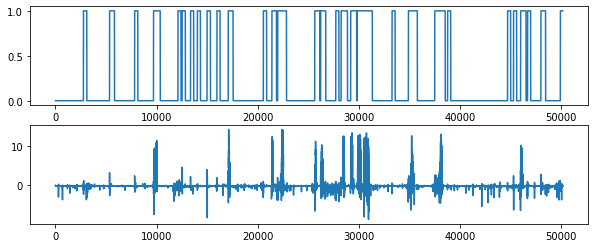

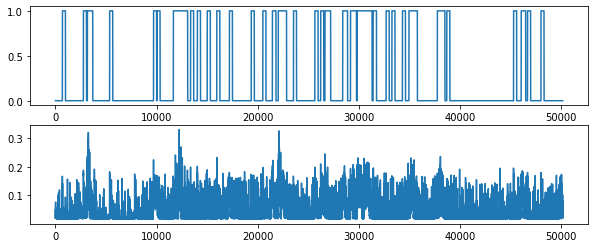

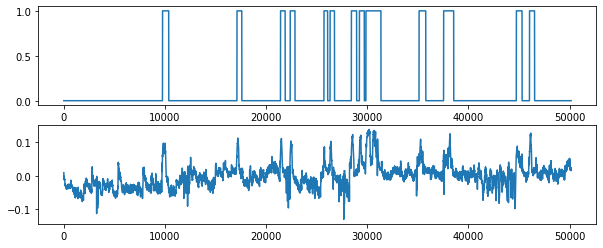

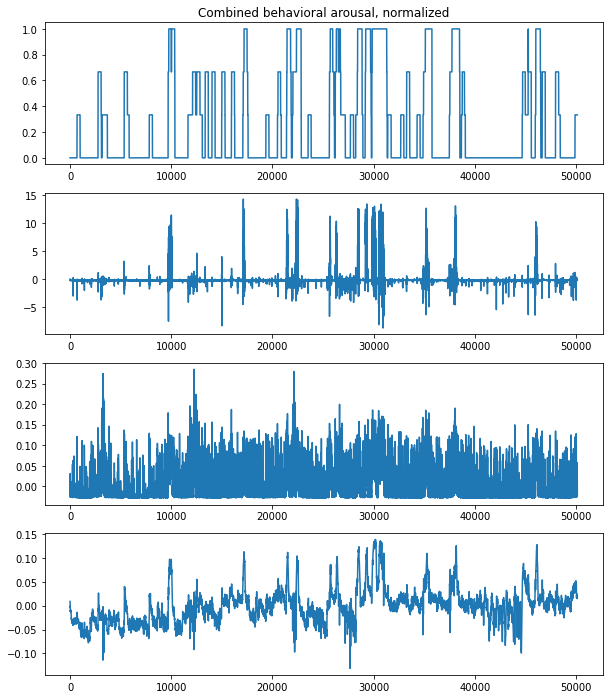

In [31]:
#Compute arousal epochs

#Walk
walk_thresh=float(input("What threshold do you want for 1s walking bouts, in cm/s?"))
bout_buffer_walk=float(input("What backwards-looking bout buffer do you want in s?"))
walk_scaled=(walk_dwnsamp-np.mean(walk_dwnsamp))*1000
walk_running=np.zeros((len(walk_scaled)),dtype=float)
walk_hot=np.zeros((len(walk_scaled)),dtype=float)

for i in range(0,int(len(walk_dwnsamp))):
    if i<(rate/2):
        walk_running[i]=np.mean(walk_scaled[0:rate])
    elif i>len(walk_running-1)-(rate/2):
        walk_running[i]=np.mean(walk_scaled[(len(walk_running)-rate):(len(walk_running)-1)])
    else:
        #print(m.floor(i-rate)/2)
        #print(m.floor(i+rate)/2)
        walk_running[i]=np.mean(walk_scaled[m.floor(i-(rate/2)):m.floor(i+(rate/2))])
    if walk_running[i]>walk_thresh:
        walk_hot[i]=1
    if i>bout_buffer_walk*rate:
        for j in range(0,int(bout_buffer_walk)*rate):
            if walk_running[i-j]>walk_thresh:
                walk_hot[i]=1
    else:
        for k in range(0,int(bout_buffer_walk)*rate):
            if walk_running[i-k]>walk_thresh:
                walk_hot[i]=1
        
fig = plt.figure(figsize=(10,4))
ax0=fig.add_subplot(2,1,1)
plt.plot(walk_hot)
ax1=fig.add_subplot(2,1,2)
plt.plot(walk_scaled)

plt.savefig(save_paths[4]+'/walk_epochs.png', dpi=300, bbox_inches='tight')

#Whisk
lat=input("Do you want to use 'left' or 'right' whisker bouts?")
if lat=="left":
    whisk_dwnsamp=lft_whisk_dwnsamp
elif lat=="right":
    whisk_dwnsamp=rt_whisk_dwnsamp
else:
    print("You loose.")
whisk_thresh=float(input("What threshold do you want for 1s whisking bouts, in ME au?"))
bout_buffer_whisk=float(input("What backwards-looking bout buffer do you want in s?"))
whisk_scaled=(whisk_dwnsamp-np.mean(whisk_dwnsamp))
whisk_running=np.zeros((len(whisk_scaled)),dtype=float)
whisk_hot=np.zeros((len(whisk_scaled)),dtype=float)

for i in range(0,int(len(whisk_dwnsamp))):
    if i<(rate/2):
        whisk_running[i]=np.mean(whisk_scaled[0:rate])
    elif i>len(whisk_running-1)-(rate/2):
        whisk_running[i]=np.mean(whisk_scaled[(len(whisk_running)-rate):(len(whisk_running)-1)])
    else:
        #print(m.floor(i-rate)/2)
        #print(m.floor(i+rate)/2)
        whisk_running[i]=np.mean(whisk_scaled[m.floor(i-(rate/2)):m.floor(i+(rate/2))])
    if whisk_running[i]>whisk_thresh:
        whisk_hot[i]=1
    if i>bout_buffer_whisk*rate:
        for j in range(0,int(bout_buffer_whisk)*rate):
            #print(j)
            if whisk_running[i-j]>whisk_thresh:
                whisk_hot[i]=1
    else:
        for k in range(0,int(bout_buffer_whisk)*rate):
            if whisk_running[i-k]>whisk_thresh:
                whisk_hot[i]=1

fig = plt.figure(figsize=(10,4))
ax0=fig.add_subplot(2,1,1)
plt.plot(whisk_hot)
ax1=fig.add_subplot(2,1,2)
plt.plot(whisk_dwnsamp)

plt.savefig(save_paths[4]+'/'+str(lat)+'_whisk_epochs.png', dpi=300, bbox_inches='tight')

#Pupil
lat=input("Do you want to use 'left' or 'right' pupil epochs?")
if lat=="left":
    ppl_upsamp=lft_ppl_upsamp
elif lat=="right":
    ppl_upsamp=rt_ppl_upsamp
else:
    print("You loose.")
ppl_thresh=float(input("What threshold do you want for pupil epochs, in area au?"))
epoch_buffer_ppl=float(input("What backwards-looking epoch buffer do you want in s?"))
ppl_offset=float(input("What pupil trace offset do you want, in s (pos number means shift left)?"))

ppl_scaled=(ppl_upsamp-np.mean(ppl_upsamp))
ppl_running=np.zeros((len(ppl_scaled)),dtype=float)
ppl_hot=np.zeros((len(ppl_scaled)),dtype=float)

ppl_shifted=ppl_upsamp
for i in range(0,int(len(ppl_shifted)-(ppl_offset*rate)-1)):
    ppl_shifted[i]=ppl_upsamp[int(i+(ppl_offset*rate))]
ppl_shifted_scaled=(ppl_shifted-np.mean(ppl_shifted))
ppl_shifted_running=np.zeros((len(ppl_shifted_scaled)),dtype=float)
ppl_shifted_hot=np.zeros((len(ppl_shifted_scaled)),dtype=float)

for i in range(0,int(len(ppl_upsamp))):
    if i<(rate/2):
        ppl_running[i]=np.mean(ppl_scaled[0:rate])
        ppl_shifted_running[i]=np.mean(ppl_shifted_scaled[0:rate])
    elif i>len(ppl_running-1)-(rate/2):
        ppl_running[i]=np.mean(ppl_scaled[(len(ppl_running)-rate):(len(ppl_running)-1)])
        ppl_shifted_running[i]=np.mean(ppl_shifted_scaled[(len(ppl_shifted_running)-rate):(len(ppl_shifted_running)-1)])
    else:
        #print(m.floor(i-rate)/2)
        #print(m.floor(i+rate)/2)
        ppl_running[i]=np.mean(ppl_scaled[m.floor(i-(rate/2)):m.floor(i+(rate/2))])
        ppl_shifted_running[i]=np.mean(ppl_shifted_scaled[m.floor(i-(rate/2)):m.floor(i+(rate/2))])
    if ppl_running[i]>ppl_thresh:
        ppl_hot[i]=1
    if ppl_shifted_running[i]>ppl_thresh:
        ppl_shifted_hot[i]=1
    if i>epoch_buffer_ppl*rate:
        for j in range(0,int(epoch_buffer_ppl)*rate):
            #print(j)
            if ppl_running[i-j]>ppl_thresh:
                ppl_hot[i]=1
            if ppl_shifted_running[i-j]>ppl_thresh:
                ppl_shifted_hot[i]=1
    else:
        for k in range(0,int(epoch_buffer_ppl)*rate):
            if ppl_running[i-k]>ppl_thresh:
                ppl_hot[i]=1
            if ppl_shifted_running[i-k]>ppl_thresh:
                ppl_shifted_hot[i]=1

fig = plt.figure(figsize=(10,4))
ax0=fig.add_subplot(2,1,1)
plt.plot(ppl_hot)
ax1=fig.add_subplot(2,1,2)
plt.plot(ppl_scaled)

plt.savefig(save_paths[4]+'/'+str(lat)+'_ppl_epochs.png', dpi=300, bbox_inches='tight')

#fig = plt.figure(figsize=(10,4))
#ax0=fig.add_subplot(2,1,1)
#plt.plot(ppl_shifted_hot)
#ax0.set_title('Pupil offset = '+str(ppl_offset)+'s.')
#ax1=fig.add_subplot(2,1,2)
#plt.plot(ppl_shifted_scaled)

#Combined
combined_hot=walk_hot+whisk_hot+ppl_hot
combined_offset_hot=walk_hot+whisk_hot+ppl_shifted_hot
combined_hot_norm=combined_hot/max(combined_hot)
combined_offset_hot_norm=combined_offset_hot/max(combined_offset_hot)

fig = plt.figure(figsize=(10,12))

ax0=fig.add_subplot(4,1,1)
plt.plot(combined_hot_norm)
ax0.set_title('Combined behavioral arousal, normalized')
ax1=fig.add_subplot(4,1,2)
plt.plot(walk_scaled)
ax2=fig.add_subplot(4,1,3)
plt.plot(whisk_scaled)
ax3=fig.add_subplot(4,1,4)
plt.plot(ppl_scaled)

plt.savefig(save_paths[4]+'/combined_epochs.png', dpi=300, bbox_inches='tight')

What hexbin gridsize do you want? 15


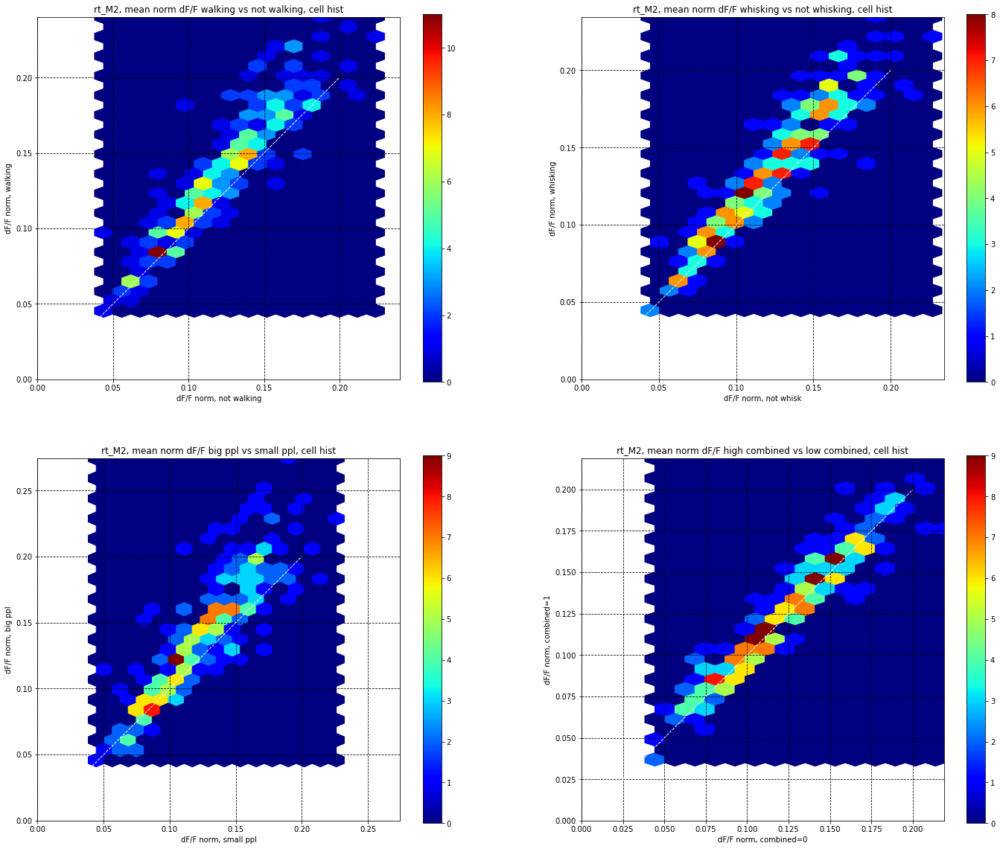

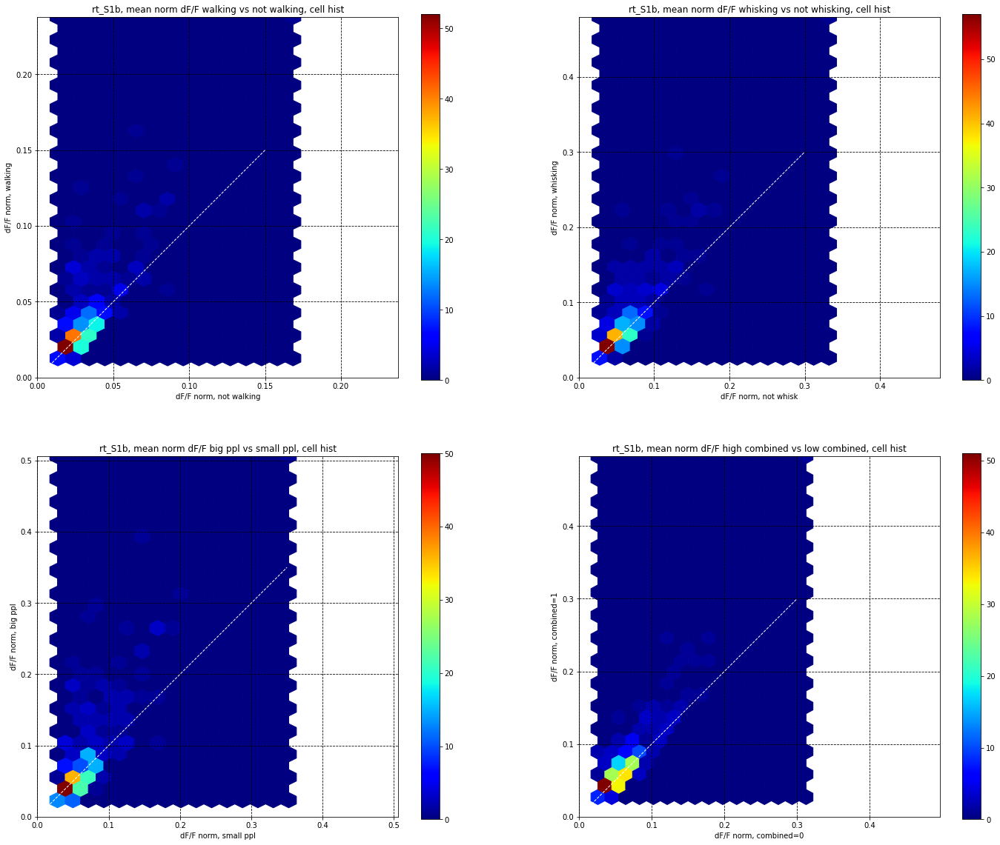

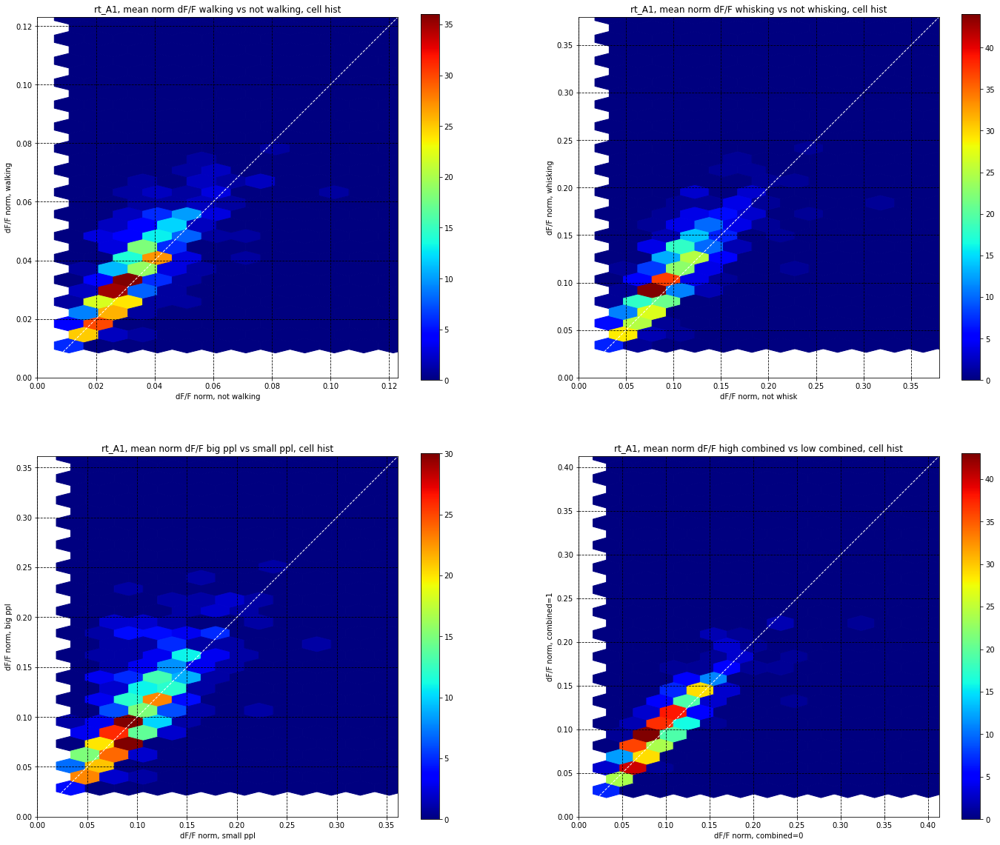

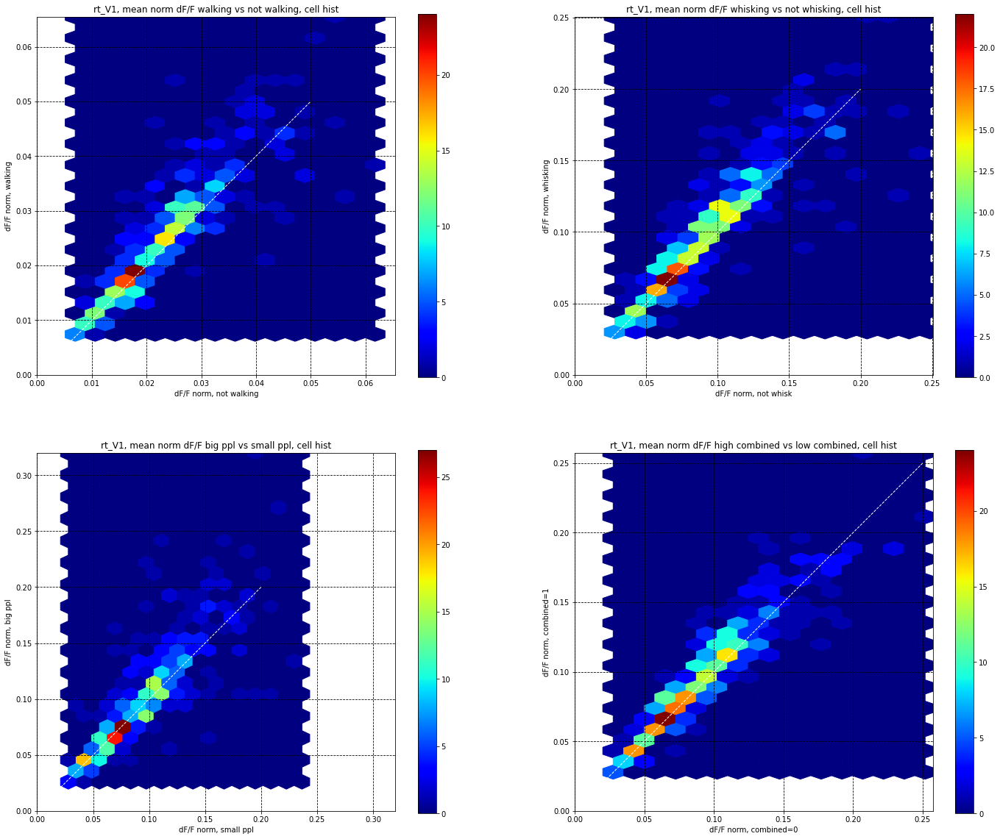

In [32]:
#plot normed df/F for walk vs. no walk

cell_max=0
for p in range(0,len(roi_names)-1):
    if ncells[p]>cell_max:
        cell_max=ncells[p]

mean_dF_F_walk_split=np.zeros(((int(len(roi_names)-1)),int(cell_max),2),dtype=float)
walk_hot_count=0
walk_cold_count=0
hexgrid=0

hexgrid=int(input('What hexbin gridsize do you want?'))

for p in range(0,len(roi_names)-1):
    for i in range(0,int(ncells[p])):
        for j in range(0,len(walk_hot)):
            if walk_hot[j]==0:
                mean_dF_F_walk_split[p,i,0]=mean_dF_F_walk_split[p,i,0]+F_df_iscell_norm[p,i,j]
                if i==0:
                    walk_cold_count=walk_cold_count+1
            if walk_hot[j]==1:
                mean_dF_F_walk_split[p,i,1]=mean_dF_F_walk_split[p,i,1]+F_df_iscell_norm[p,i,j]
                if i==0:
                    walk_hot_count=walk_hot_count+1
        mean_dF_F_walk_split[p,i,0]=mean_dF_F_walk_split[p,i,0]/walk_cold_count
        mean_dF_F_walk_split[p,i,1]=mean_dF_F_walk_split[p,i,1]/walk_hot_count

    df=pd.DataFrame(mean_dF_F_walk_split[p,0:int(ncells[p]),0:int(ncells[p])])

    fig = plt.figure(figsize=(24,20))
    ax0=fig.add_subplot(2,2,1)

    plt.hexbin(df[0],df[1],gridsize=(hexgrid,hexgrid),cmap=plt.cm.jet)
    ax0.set_xlim((0,max(df[1])))
    ax0.set_ylim((0,max(df[1])))
    x=np.arange(-1,max(df[0]),0.05)
    y=x
    plt.plot(x, y, '--', color = 'white', linewidth = 1)
    x0,x1 = ax0.get_xlim()
    y0,y1 = ax0.get_ylim()
    ax0.set_aspect(abs(x1-x0)/abs(y1-y0))
    ax0.grid(b=True, which='major', color='k', linestyle='--')
    plt.colorbar()
    ax0.set_title(str(roi_names[p])+', mean norm dF/F walking vs not walking, cell hist')
    ax0.set_ylabel('dF/F norm, walking')
    ax0.set_xlabel('dF/F norm, not walking')

    #plot normed df/F for whisk vs. no whisk
    mean_dF_F_whisk_split=np.zeros(((int(len(roi_names)-1)),int(cell_max),2),dtype=float)
    whisk_hot_count=0
    whisk_cold_count=0

    for i in range(0,int(ncells[p])):
        for j in range(0,len(whisk_hot)):
            if whisk_hot[j]==0:
                mean_dF_F_whisk_split[p,i,0]=mean_dF_F_whisk_split[p,i,0]+F_df_iscell_norm[p,i,j]
                if i==0:
                    whisk_cold_count=whisk_cold_count+1
            if whisk_hot[j]==1:
                mean_dF_F_whisk_split[p,i,1]=mean_dF_F_whisk_split[p,i,1]+F_df_iscell_norm[p,i,j]
                if i==0:
                    whisk_hot_count=whisk_hot_count+1
        mean_dF_F_whisk_split[p,i,0]=mean_dF_F_whisk_split[p,i,0]/whisk_cold_count
        mean_dF_F_whisk_split[p,i,1]=mean_dF_F_whisk_split[p,i,1]/whisk_hot_count

    df=pd.DataFrame(mean_dF_F_whisk_split[p,0:int(ncells[p]),0:int(ncells[p])])

    ax1=fig.add_subplot(2,2,2)

    plt.hexbin(df[0],df[1],gridsize=(hexgrid,hexgrid),cmap=plt.cm.jet)
    ax1.set_xlim((0,max(df[1])))
    ax1.set_ylim((0,max(df[1])))
    x=np.arange(-1,max(df[0]),0.05)
    y=x
    plt.plot(x, y, '--', color = 'white', linewidth = 1)
    x0,x1 = ax1.get_xlim()
    y0,y1 = ax1.get_ylim()
    ax1.set_aspect(abs(x1-x0)/abs(y1-y0))
    ax1.grid(b=True, which='major', color='k', linestyle='--')
    plt.colorbar()
    ax1.set_title(str(roi_names[p])+', mean norm dF/F whisking vs not whisking, cell hist')
    ax1.set_ylabel('dF/F norm, whisking')
    ax1.set_xlabel('dF/F norm, not whisk')

    #plot normed df/F for big ppl vs. small ppl
    mean_dF_F_ppl_split=np.zeros(((int(len(roi_names)-1)),int(cell_max),2),dtype=float)
    ppl_hot_count=0
    ppl_cold_count=0

    for i in range(0,int(ncells[p])):
        for j in range(0,len(ppl_hot)):
            if ppl_hot[j]==0:
                mean_dF_F_ppl_split[p,i,0]=mean_dF_F_ppl_split[p,i,0]+F_df_iscell_norm[p,i,j]
                if i==0:
                    ppl_cold_count=ppl_cold_count+1
            if ppl_hot[j]==1:
                mean_dF_F_ppl_split[p,i,1]=mean_dF_F_ppl_split[p,i,1]+F_df_iscell_norm[p,i,j]
                if i==0:
                    ppl_hot_count=ppl_hot_count+1
        mean_dF_F_ppl_split[p,i,0]=mean_dF_F_ppl_split[p,i,0]/ppl_cold_count
        mean_dF_F_ppl_split[p,i,1]=mean_dF_F_ppl_split[p,i,1]/ppl_hot_count

    df=pd.DataFrame(mean_dF_F_ppl_split[p,0:int(ncells[p]),0:int(ncells[p])])

    ax2=fig.add_subplot(2,2,3)

    plt.hexbin(df[0],df[1],gridsize=(hexgrid,hexgrid),cmap=plt.cm.jet)
    ax2.set_xlim((0,max(df[1])))
    ax2.set_ylim((0,max(df[1])))
    x=np.arange(-1,max(df[0]),0.05)
    y=x
    plt.plot(x, y, '--', color = 'white', linewidth = 1)
    x0,x1 = ax2.get_xlim()
    y0,y1 = ax2.get_ylim()
    ax2.set_aspect(abs(x1-x0)/abs(y1-y0))
    ax2.grid(b=True, which='major', color='k', linestyle='--')
    plt.colorbar()
    ax2.set_title(str(roi_names[p])+', mean norm dF/F big ppl vs small ppl, cell hist')
    ax2.set_ylabel('dF/F norm, big ppl')
    ax2.set_xlabel('dF/F norm, small ppl')

    #plot normed df/F for combined metric
    mean_dF_F_cmb_split=np.zeros(((int(len(roi_names)-1)),int(cell_max),2),dtype=float)
    cmb_hot_count=0
    cmb_cold_count=0

    for i in range(0,int(ncells[p])):
        for j in range(0,len(combined_hot)):
            if combined_hot[j]==0:
                mean_dF_F_cmb_split[p,i,0]=mean_dF_F_cmb_split[p,i,0]+F_df_iscell_norm[p,i,j]
                if i==0:
                    cmb_cold_count=cmb_cold_count+1
            if combined_hot[j]==1:
                mean_dF_F_cmb_split[p,i,1]=mean_dF_F_cmb_split[p,i,1]+F_df_iscell_norm[p,i,j]
                if i==0:
                    cmb_hot_count=cmb_hot_count+1
        mean_dF_F_cmb_split[p,i,0]=mean_dF_F_cmb_split[p,i,0]/cmb_cold_count
        mean_dF_F_cmb_split[p,i,1]=mean_dF_F_cmb_split[p,i,1]/cmb_hot_count

    df=pd.DataFrame(mean_dF_F_cmb_split[p,0:int(ncells[p]),0:int(ncells[p])])

    ax3=fig.add_subplot(2,2,4)

    plt.hexbin(df[0],df[1],gridsize=(hexgrid,hexgrid),cmap=plt.cm.jet)
    ax3.set_xlim((0,max(df[1])))
    ax3.set_ylim((0,max(df[1])))
    x=np.arange(-1,max(df[0]),0.05)
    y=x
    plt.plot(x, y, '--', color = 'white', linewidth = 1)
    x0,x1 = ax3.get_xlim()
    y0,y1 = ax3.get_ylim()
    ax3.set_aspect(abs(x1-x0)/abs(y1-y0))
    ax3.grid(b=True, which='major', color='k', linestyle='--')
    plt.colorbar()
    ax3.set_title(str(roi_names[p])+', mean norm dF/F high combined vs low combined, cell hist')
    ax3.set_ylabel('dF/F norm, combined=1')
    ax3.set_xlabel('dF/F norm, combined=0')

    plt.savefig(save_paths[p]+'/'+str(roi_names[p])+'_dFF_aroused_vs_calm_all_behavs_'+str(hexgrid)+'_hexbins.png',
                dpi=300, bbox_inches='tight')

Which brain area is the seed target? rt_M2
How many grid cells along each side(x=y)? 2


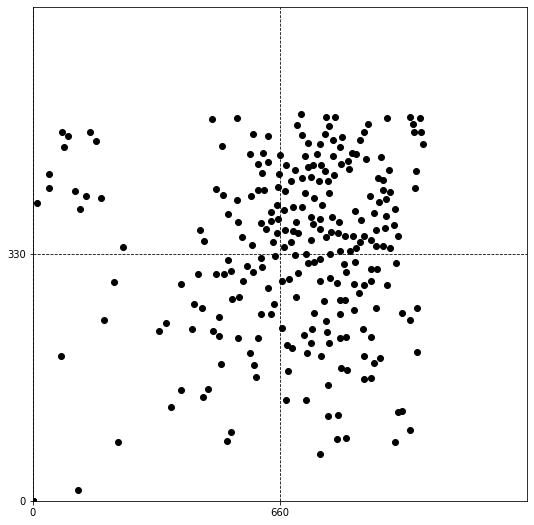

In [474]:
#Region-based seed-mapped pairwise correlation maps
import copy as cp
import math as m
import seaborn as sns
#from matplotlib.patches import Rectangle

#pick a target ROI
target_name=str(input('Which brain area is the seed target?'))
target_index=roi_names.index(target_name)

#Split images into grid
grid_count=input("How many grid cells along each side(x=y)?")
grid_count=int(grid_count)
grid_cell_x=m.floor(x_size[target_index]/grid_count)
grid_cell_y=m.floor(y_size[target_index]/grid_count)

#Draw cells in grid in target area, to aid in subregion seed selection

fig = plt.figure(figsize=(24,20))

ax0=fig.add_subplot(2,2,1)
plt.scatter(cell_loc_yflip_scale[target_index,:,0],cell_loc_yflip_scale[target_index,:,1],c='black')
ax0.set_xlim((0,x_size[target_index]))
ax0.set_ylim((0,y_size[target_index]))
ax0.set_xticks(np.arange(0,x_size[target_index],grid_cell_x))
ax0.set_yticks(np.arange(0,y_size[target_index],grid_cell_y))

x0,x1 = ax0.get_xlim()
y0,y1 = ax0.get_ylim()
ax0.set_aspect(abs(x1-x0)/abs(y1-y0))
ax0.grid(b=True, which='major', color='k', linestyle='--')
pos1 = ax0.get_position() # get the original position 
pos2 = [pos1.x0+0.058, pos1.y0,  pos1.width*1, pos1.height*1] 
ax0.set_position(pos2) # set a new position

Pick a seed x grid coord: 1
Pick a seed y grid coord: 1


0


Which CCF sub-area is the seed? rt_M2_o
Pick a behavioral z-score cutoff, bidir: 1.6
Pick a pairwise z-score cutoff, bidir: 1.6


Now processing behaviorally thresholded pairwise correlation maps between rt_M2 and rt_M2.


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:184: RuntimeWarning: divide by zero encountered in double_scalars


Now processing behaviorally thresholded pairwise correlation maps between rt_M2 and rt_S1b.


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:180: RuntimeWarning: divide by zero encountered in double_scalars


Now processing behaviorally thresholded pairwise correlation maps between rt_M2 and rt_A1.


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:184: RuntimeWarning: invalid value encountered in double_scalars


Now processing behaviorally thresholded pairwise correlation maps between rt_M2 and rt_V1.


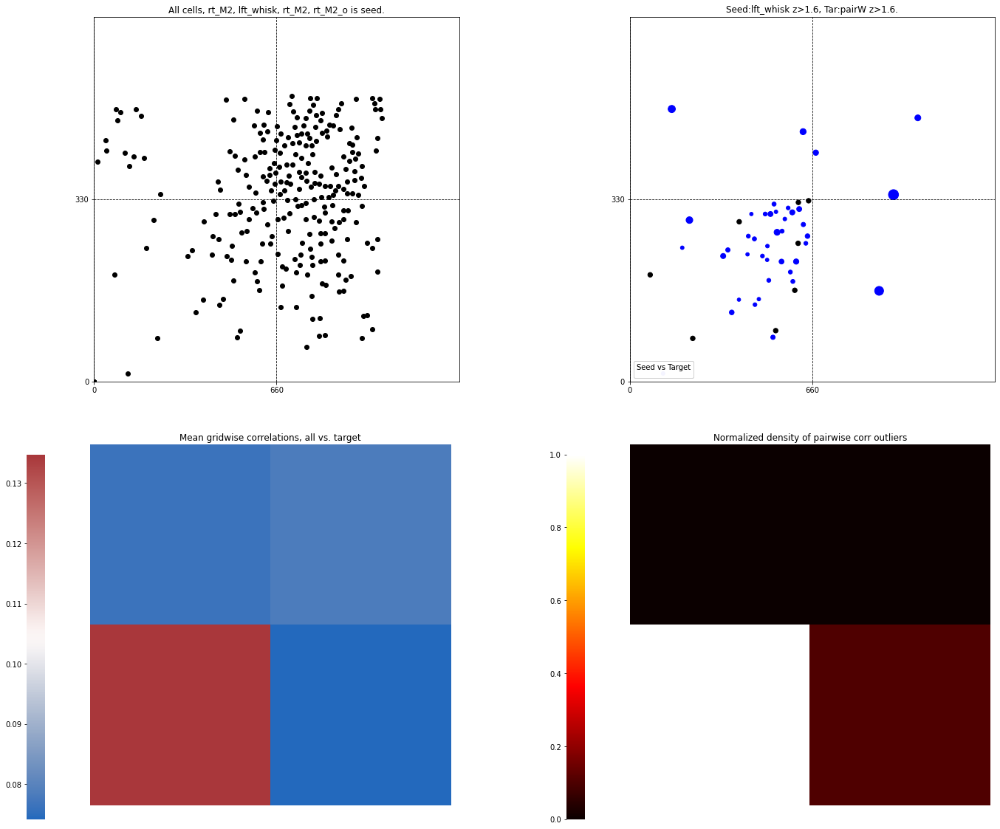

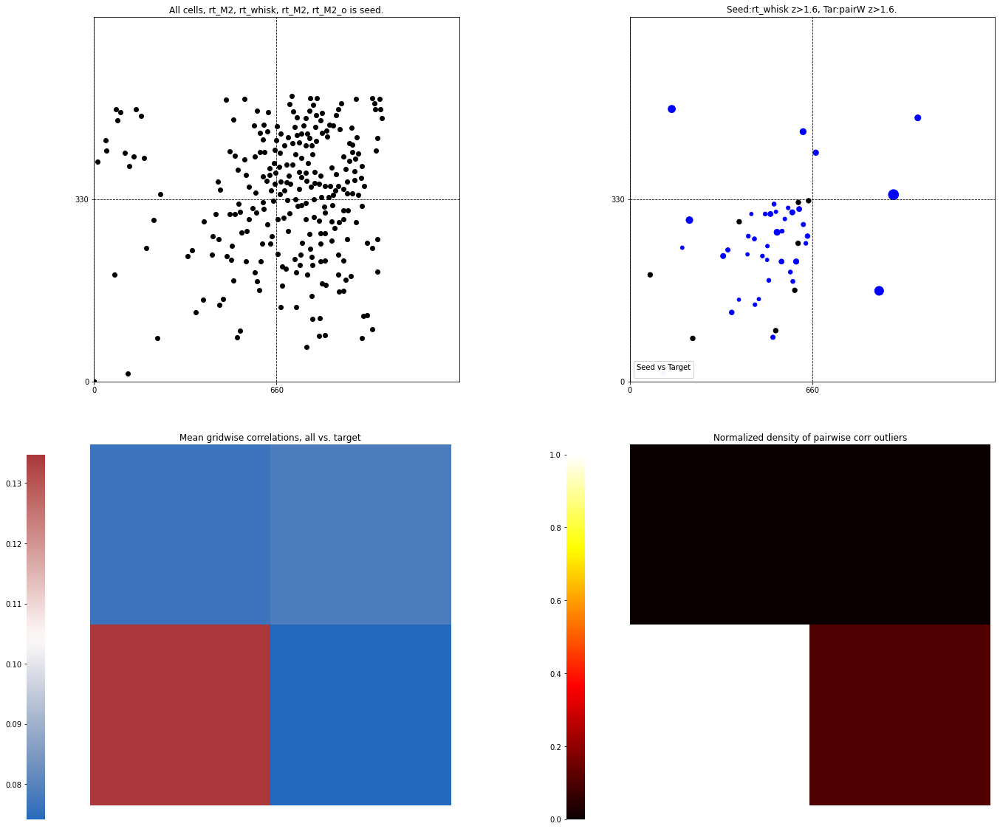

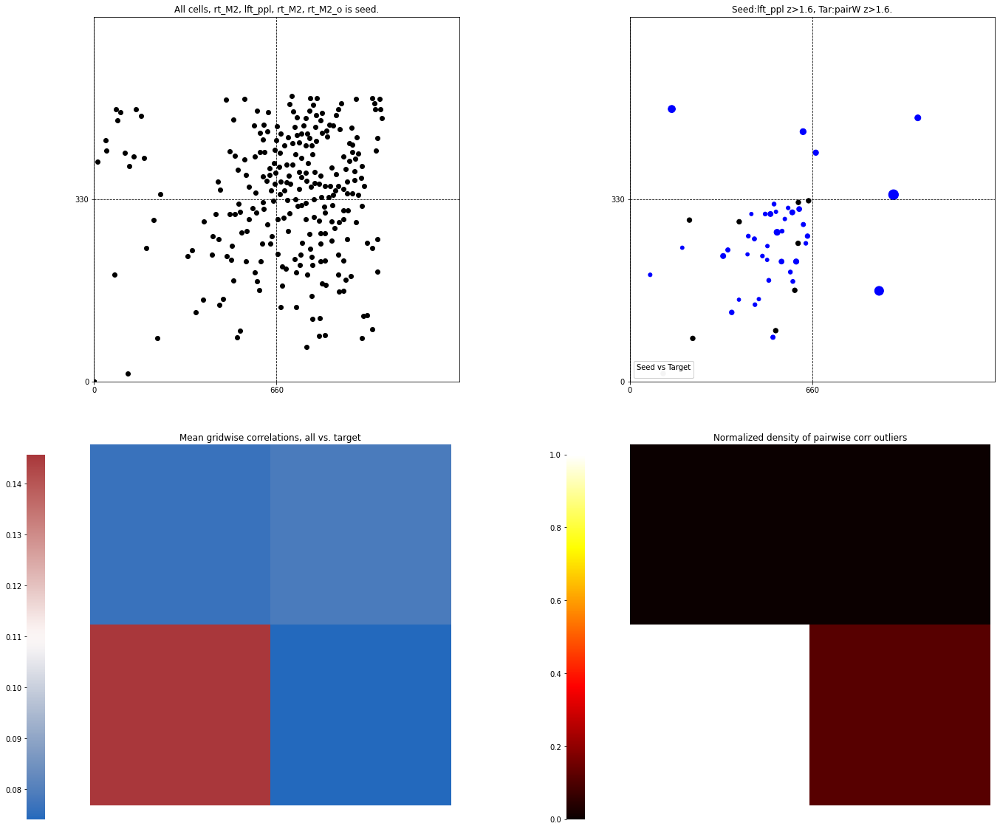

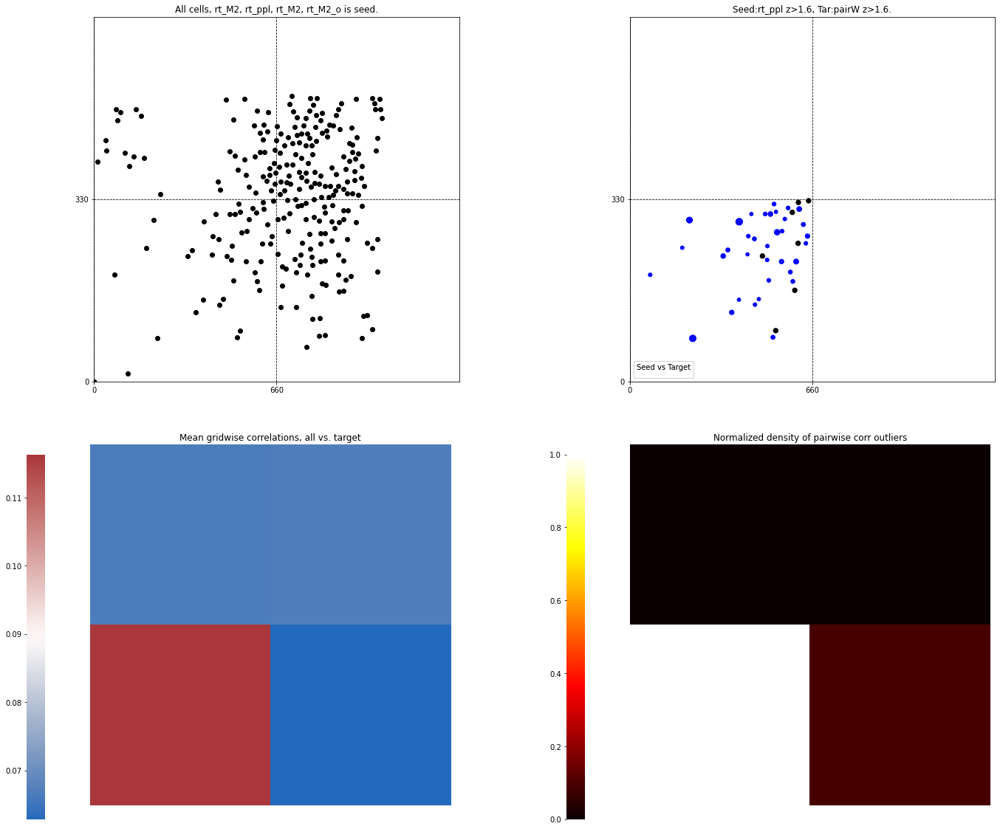

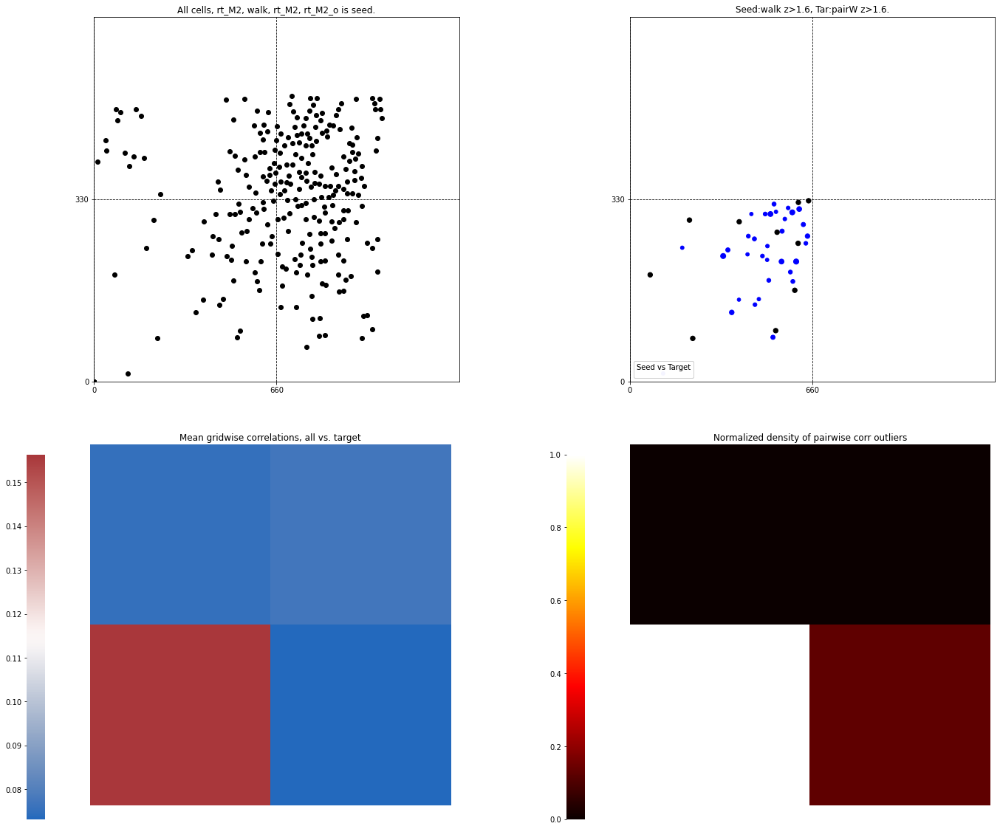

...

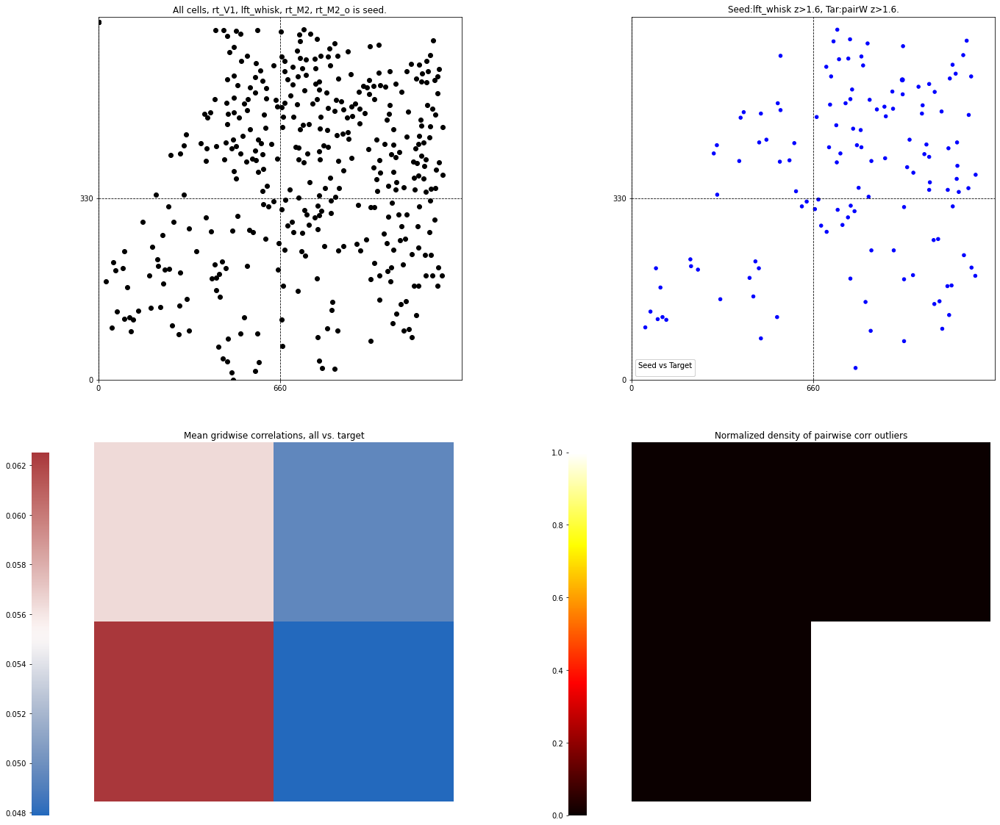

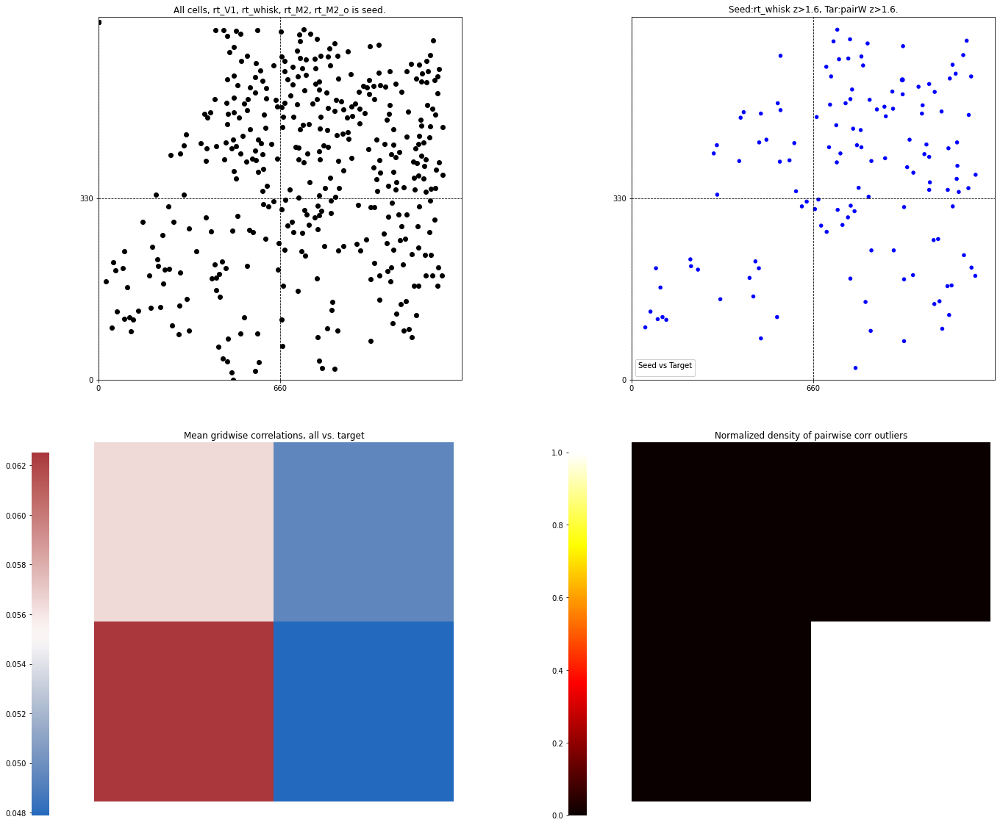

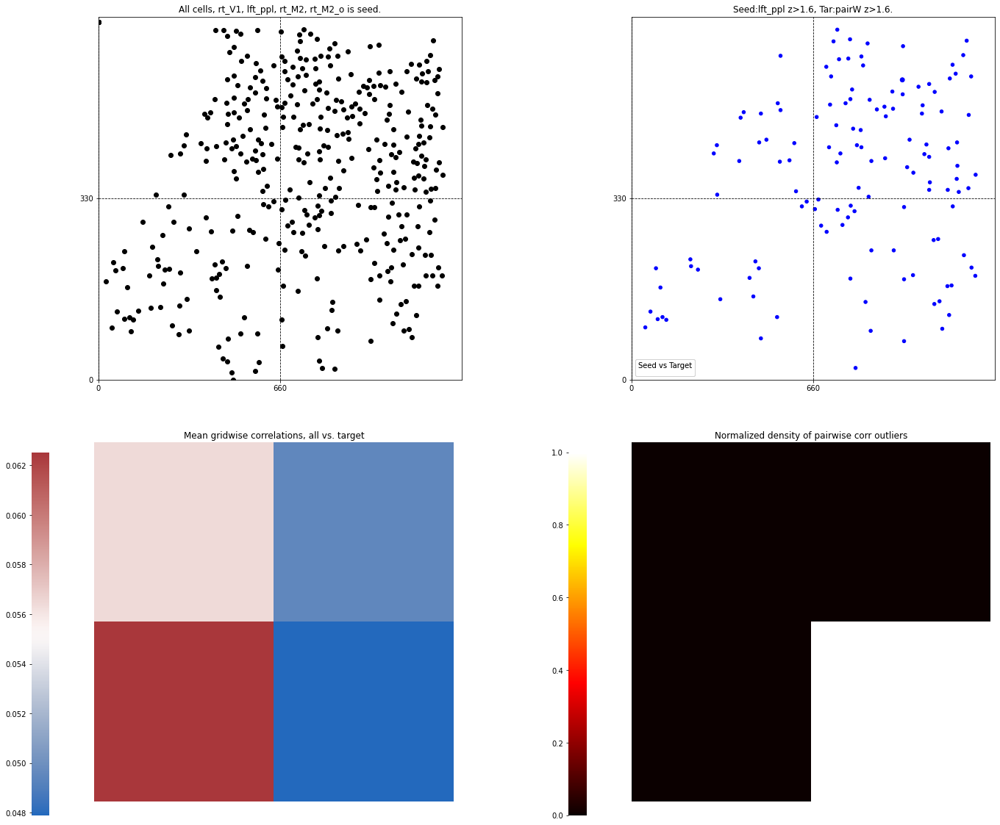

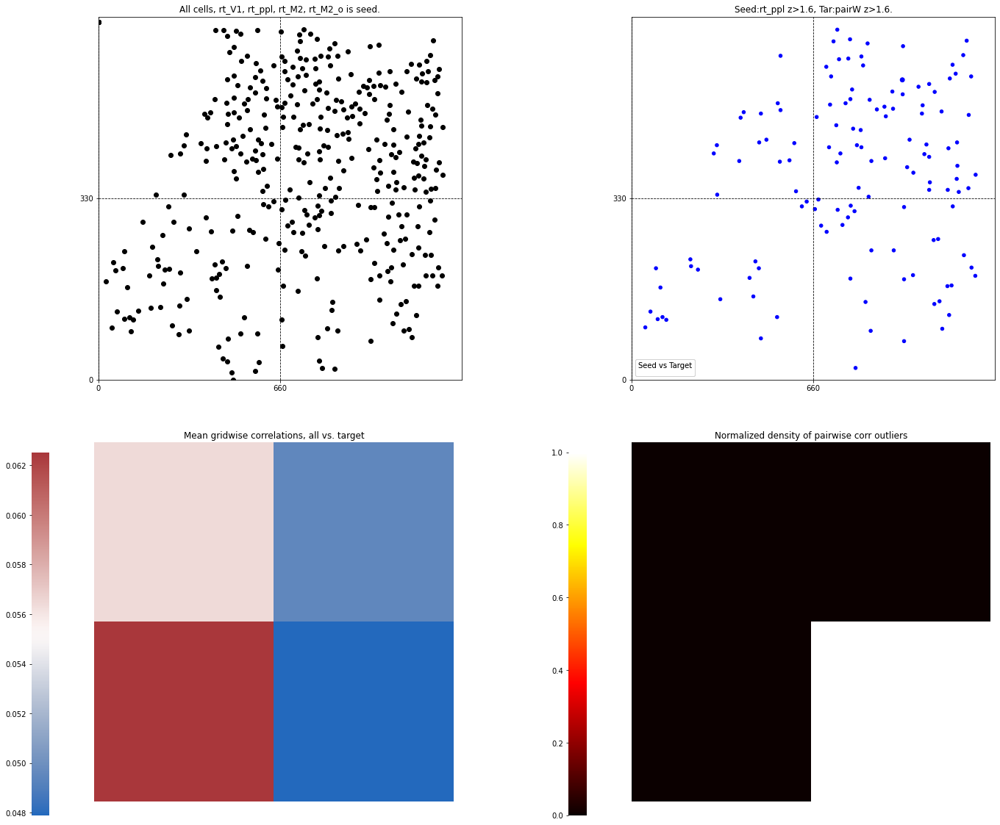

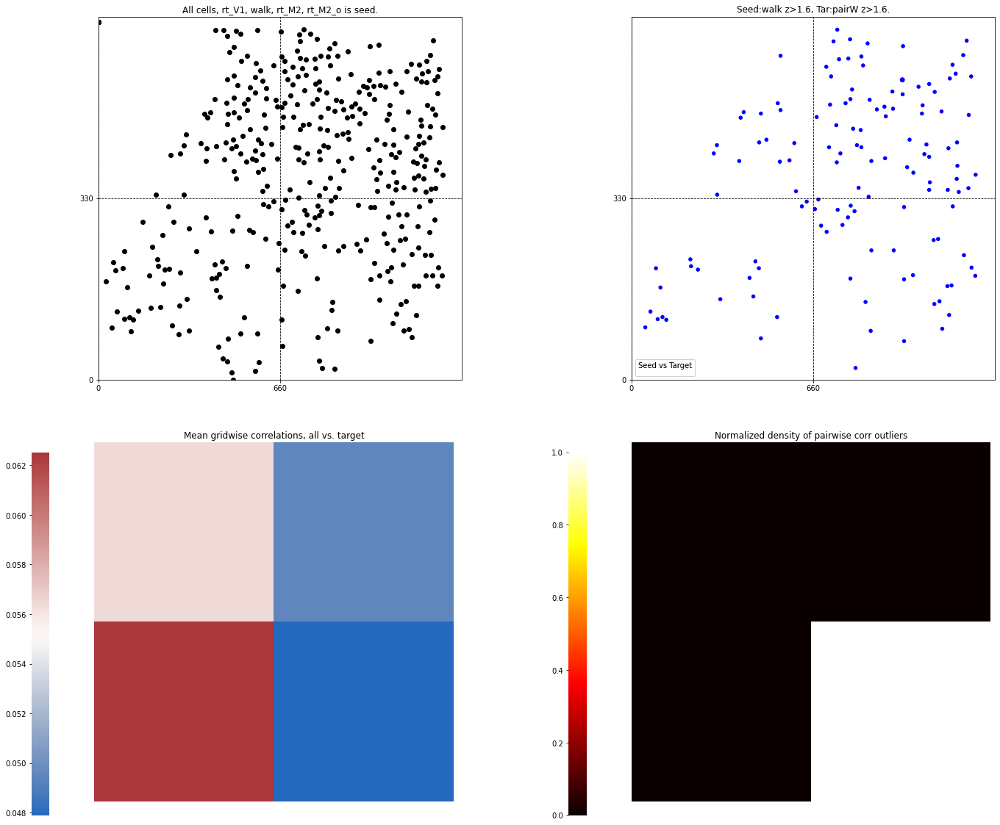

In [493]:
x_seed=int(input("Pick a seed x grid coord:"))
y_seed=int(input("Pick a seed y grid coord:"))
seed_cell=(x_seed-1)+(grid_count*(y_seed-1))
print(seed_cell)
 
seed_area=input("Which CCF sub-area is the seed?")

seed_zCut=float(input("Pick a behavioral z-score cutoff, bidir:"))
pairwise_zCut=float(input("Pick a pairwise z-score cutoff, bidir:"))

F_df_cMat_cross=F_df_cMat_list.copy()

for p in range(0,len(roi_names)-1):
    #create cross area z scores#
    if p!=target_index:
        F_df_cMat_cross[p]=np.corrcoef(F_df_iscell_norm[target_index,:],F_df_iscell_norm[p,:])
        for i in range(0,len(F_df_cMat_cross[p][:])):
            for j in range(0,len(F_df_cMat_cross[p][:])):
                if np.isnan(F_df_cMat_cross[p][i,j]):
                    F_df_cMat_cross[p][i,j]=0

cell_loc_temp_seed=cp.copy(cell_loc_yflip_scale)
cell_loc_temp_target=cp.copy(cell_loc_yflip_scale)

target_count=np.zeros((len(roi_names)-1, len(behav),grid_count**2),dtype=float)
cell_cnt=np.zeros((len(roi_names)-1, len(behav),grid_count**2),dtype=int)
scn_tar_cnt=np.zeros((len(roi_names)-1, len(behav),grid_count**2),dtype=int)

corr_sums=np.zeros((len(roi_names)-1, len(behav),grid_count**2),dtype=float)
corr_means=np.zeros((len(roi_names)-1, len(behav),grid_count**2),dtype=float)

corr_hm=np.zeros((len(roi_names)-1,len(behav),grid_count,grid_count),dtype=float)
corr_hm_norm=np.zeros((len(roi_names)-1,len(behav),grid_count,grid_count),dtype=float)

#target_corr=np.zeros((len(roi_names)-1, len(behav),int(ncells[p]),int(cell_cnt[p,z,seed_cell])),dtype=float)
        
p=target_index
while p<len(roi_names)-1:
#for p in range(0,len(roi_names)-1):
    print("Now processing behaviorally thresholded pairwise correlation maps between "+target_name+" and "+roi_names[p]+".")

    grid_code=np.zeros((grid_count,grid_count),dtype=int)
    grid_cell_count=np.zeros((grid_count**2),dtype=float)
    grid_IDs=np.zeros((int(ncells[p])),dtype=float)
        
    for i in range(0,int(ncells[p])):            
        grid_IDs[i]=(m.floor((cell_loc_yflip_scale[p,i,0]/float(x_size[p]))*grid_count))+(grid_count*(m.floor(((cell_loc_yflip_scale[p,i,1]-1)/float(y_size[p]))*grid_count)))       
        grid_cell_count[int(grid_IDs[i])]=grid_cell_count[int(grid_IDs[i])]+1
    
    for z in range(0,len(behav)):
        behav_zscore=np.zeros((len(behav),int(ncells[p])),dtype=float)

        behav_zscore[z,:]=scipy.stats.zscore(behav_corr_cell_loc_frame_list[p][behav[z]],axis=0,ddof=0,nan_policy='omit')
        
        for i in range(0,int(ncells[p])):
            if grid_IDs[i]==seed_cell and abs(behav_zscore[z,i])>seed_zCut and p==target_index:
                cell_cnt[p,z,int(grid_IDs[i])]=cell_cnt[p,z,int(grid_IDs[i])]+1
                #print('OK')
            elif p==target_index and grid_IDs[i]!=seed_cell:
                cell_loc_temp_seed[p,i,0]=-1
                cell_loc_temp_seed[p,i,1]=-1

            if grid_IDs[i]!=seed_cell:
                cell_cnt[p,z,int(grid_IDs[i])]=cell_cnt[p,z,int(grid_IDs[i])]+1
            elif grid_IDs[i]==seed_cell and p==target_index and abs(behav_zscore[z,i])<=seed_zCut:
                scn_tar_cnt[p,z,int(grid_IDs[i])]=scn_tar_cnt[p,z,int(grid_IDs[i])]+1
            elif grid_IDs[i]==seed_cell and p!=target_index:
                scn_tar_cnt[p,z,int(grid_IDs[i])]=scn_tar_cnt[p,z,int(grid_IDs[i])]+1
        if p==target_index:
            seed_ID=np.zeros((int(cell_cnt[p,z,seed_cell])), dtype=int)        

        q=0
        temp_zscore=np.zeros((int(ncells[p]),int(ncells[target_index])))
        
        for i in range(0,int(ncells[p])):
            if grid_IDs[i]==seed_cell and abs(behav_zscore[z,i])>seed_zCut and p==target_index:
                seed_ID[q]=i
                q=q+1
        for i in range(0,int(ncells[p])):
            temp_zscore[i,:]=scipy.stats.zscore(F_df_cMat_cross[p][i,0:int(ncells[target_index])], axis=0, ddof=0, nan_policy='propagate')
            if i<ncells[target_index]:
                temp_zscore[i,i]=0

        fail_count=0
        target_cmap = ['' for i in range(int(ncells[p]))]
        target_smap = np.zeros(int(ncells[p]))

        for i in range(0,int(ncells[p])):
            for j in range(0,len(seed_ID)):
                if grid_IDs[i]==seed_cell and p==target_index and abs(behav_zscore[z,i])>seed_zCut:
                    target_smap[i]=20*(2**(1))
                else:
                    target_smap[i]=20*(2**(abs(F_df_cMat_cross[p][i,seed_ID[j]])*10))+target_smap[i]
                    
                if abs(temp_zscore[i,seed_ID[j]])<=pairwise_zCut and grid_IDs[i]!=seed_cell:
                    cell_loc_temp_target[p,i,0]=-999
                    cell_loc_temp_target[p,i,1]=-999
                    target_cmap[i]='blue'
                    fail_count=fail_count+1
                elif abs(temp_zscore[i,seed_ID[j]])>pairwise_zCut and grid_IDs[i]!=seed_cell:
                    cell_loc_temp_target[p,i,0]=cell_loc_yflip_scale[p,i,0]
                    cell_loc_temp_target[p,i,1]=cell_loc_yflip_scale[p,i,1]
                    if F_df_cMat_cross[p][i,seed_ID[j]]>0:
                        target_cmap[i]='blue'
                    if F_df_cMat_cross[p][i,seed_ID[j]]<0:
                        target_cmap[i]='red'
                elif grid_IDs[i]==seed_cell and abs(temp_zscore[i,seed_ID[j]])>pairwise_zCut:
                    cell_loc_temp_target[p,i,0]=cell_loc_yflip_scale[p,i,0]
                    cell_loc_temp_target[p,i,1]=cell_loc_yflip_scale[p,i,1]
                    if F_df_cMat_cross[p][i,seed_ID[j]]>0:
                        target_cmap[i]='blue'
                    if F_df_cMat_cross[p][i,seed_ID[j]]<0:
                        target_cmap[i]='red'
                elif abs(temp_zscore[i,seed_ID[j]])<=pairwise_zCut and p!=target_index:
                    cell_loc_temp_target[p,i,0]=-999
                    cell_loc_temp_target[p,i,1]=-999
                    target_cmap[i]='blue'
                    fail_count=fail_count+1 
                elif abs(temp_zscore[i,seed_ID[j]])>pairwise_zCut and p!=target_index:
                    cell_loc_temp_target[p,i,0]=cell_loc_yflip_scale[i,0]
                    cell_loc_temp_target[p,i,1]=cell_loc_yflip_scale[i,1]
                    if F_df_cMat_cross[p][i,seed_ID[j]]>0:
                        target_cmap[i]='blue'
                    if F_df_cMat_cross[p][i,seed_ID[j]]<0:
                        target_cmap[i]='red'      
                else:
                    cell_loc_temp_target[p,i,0]=cell_loc_yflip_scale[p,i,0]
                    cell_loc_temp_target[p,i,1]=cell_loc_yflip_scale[p,i,1]
                    target_cmap[i]='blue'
                if p==target_index:
                    target_cmap[seed_ID[j]]='black'

            if cell_loc_temp_target[p,i,0]==0 and cell_loc_temp_target[p,i,1]==0:
                cell_loc_temp_target[p,i,0]=-1
                cell_loc_temp_target[p,i,1]=-1
        
        for i in range(0,int(ncells[p])):
            if grid_IDs[i]==seed_cell and p==target_index and abs(behav_zscore[z,i])>seed_zCut:
                target_smap[i]=target_smap[i]
            else:
                target_smap[i]=target_smap[i]/len(seed_ID)     
                
        for i in range(0,int(ncells[p])):
            for j in range(0,len(seed_ID)):
                if abs(temp_zscore[i,seed_ID[j]])>pairwise_zCut and p!=target_index:
                    target_count[p,z,int(grid_IDs[i])]=target_count[p,z,int(grid_IDs[i])]+1
                if abs(temp_zscore[i,seed_ID[j]])>pairwise_zCut and p==target_index and i!=seed_ID[j]:
                    target_count[p,z,int(grid_IDs[i])]=target_count[p,z,int(grid_IDs[i])]+1
        target_corr_temp=np.zeros((int(ncells[p]),int(len(seed_ID))),dtype=float)
        
        for i in range(0,int(ncells[p])):
            for j in range(0,len(seed_ID)):
                if i!=seed_ID[j]:
                    target_corr_temp[i,j]=F_df_cMat_cross[p][i,seed_ID[j]]
                else:
                    target_corr_temp[i,j]=0
                #print(i)
                #print(j)
                #print(target_corr_temp.shape)

        for i in range(0,int(ncells[p])):
            for j in range(0,len(seed_ID)):
                if p!=target_index:
                    corr_sums[p,z,int(grid_IDs[i])]=corr_sums[p,z,int(grid_IDs[i])]+abs(target_corr_temp[i,j])
                if p==target_index and i!=seed_ID[j]:
                    corr_sums[p,z,int(grid_IDs[i])]=corr_sums[p,z,int(grid_IDs[i])]+abs(target_corr_temp[i,j])

        for i in range(0,grid_count**2):
            if i!=seed_cell:
                corr_means[p,z,i]=corr_sums[p,z,i]/(cell_cnt[p,z,i]*len(seed_ID))
            elif i==seed_cell:
                corr_means[p,z,i]=corr_sums[p,z,i]/((scn_tar_cnt[p,z,seed_cell]-len(seed_ID))*len(seed_ID))
            if np.isnan(corr_means[p,z,i]) or np.isinf(corr_means[p,z,i]):
                corr_means[p,z,i]=0

        for i in range(0,grid_count):
            for j in range(0,grid_count):
                corr_hm[p,z,grid_count-i-1,j]=corr_means[p,z,j+grid_count*i]
                if (grid_count-i-1)!=seed_cell:
                    corr_hm_norm[p,z,grid_count-i-1,j]=target_count[p,z,j+grid_count*i]/cell_cnt[p,z,j+grid_count*i]
                    if np.isnan(corr_hm_norm[p,z,grid_count-i-1,j]) or np.isinf(corr_hm_norm[p,z,grid_count-i-1,j]):
                        corr_hm_norm[p,z,grid_count-i-1,j]=0
                elif (grid_count-i-1)==seed_cell:
                    corr_hm_norm[p,z,grid_count-i-1,j]=target_count[p,z,j+grid_count*i]/(scn_tar_cnt[p,z,j+grid_count*i])
                    if np.isnan(corr_hm_norm[p,z,grid_count-i-1,j]) or np.isinf(corr_hm_norm[p,z,grid_count-i-1,j]):
                        corr_hm_norm[p,z,grid_count-i-1,j]=0
        if np.amax(corr_hm_norm[p,z,:,:])>0:
            corr_hm_norm[p,z,:,:]=corr_hm_norm[p,z,:,:]/np.amax(corr_hm_norm[p,z,:,:]) 
        else:
            corr_hm_norm[p,z,:,:]=0

        fig = plt.figure(figsize=(24,20))

        ax0=fig.add_subplot(2,2,1)
        plt.scatter(cell_loc_yflip_scale[p,:,0],cell_loc_yflip_scale[p,:,1],c='black')
        ax0.set_xlim((0,x_size[p]))
        ax0.set_ylim((0,y_size[p]))
        ax0.set_xticks(np.arange(0,x_size[p],grid_cell_x))
        ax0.set_yticks(np.arange(0,y_size[p],grid_cell_y))

        x0,x1 = ax0.get_xlim()
        y0,y1 = ax0.get_ylim()
        ax0.set_aspect(abs(x1-x0)/abs(y1-y0))
        ax0.grid(b=True, which='major', color='k', linestyle='--')
        ax0.set_title('All cells, '+roi_names[p]+', '+behav[z]+', '+str(target_name)+', '+str(seed_area)+' is seed.')
        pos1 = ax0.get_position() # get the original position 
        pos2 = [pos1.x0+0.058, pos1.y0,  pos1.width*1, pos1.height*1] 
        ax0.set_position(pos2) # set a new position

        #someX, someY = 2, 3
        #ax0.add_patch(Rectangle((someX - .5, someY - .5), 1, 1, facecolor="none"))
        
        cell_local_target=np.zeros((int(ncells[p]),2))
        cell_local_target=cell_loc_temp_target[p,0:int(ncells[p]),:]
        
        ax1=fig.add_subplot(2,2,2)
        scatter=plt.scatter(cell_local_target[:,0],cell_local_target[:,1],s=target_smap,color=target_cmap)
        ax1.set_xlim((0,x_size[p]))
        ax1.set_ylim((0,y_size[p]))
        ax1.set_xticks(np.arange(0,x_size[p],grid_cell_x))
        ax1.set_yticks(np.arange(0,y_size[p],grid_cell_y))

        x0,x1 = ax1.get_xlim()
        y0,y1 = ax1.get_ylim()
        ax1.set_aspect(abs(x1-x0)/abs(y1-y0))
        ax1.grid(b=True, which='major', color='k', linestyle='--')
        ax1.set_title('Seed:'+behav[z]+' z>'+str(seed_zCut)+', Tar:pairW z>'+str(pairwise_zCut)+'.')
        pos1 = ax1.get_position() # get the original position 
        pos2 = [pos1.x0+0.055, pos1.y0,  pos1.width*1, pos1.height*1] 
        ax1.set_position(pos2) # set a new position

        # produce a legend with the unique colors from the scatter
        legend1 = ax1.legend(*scatter.legend_elements(),
                            loc="lower left", title="Seed vs Target")
        ax1.add_artist(legend1)

        # produce a legend with a cross section of sizes from the scatter
        #handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6,color='Blue')
        #legend2 = ax1.legend(handles, labels, loc="upper right", title="Corr mag")

        #for corr in [0.1, 0.5, 1.0]:
        #    ax1.scatter([], [], c='k', alpha=0.3, s=m.log(target_smap/20,2)/10,
        #                label=str(corr) + ' corr')
        #legend2 = ax1.legend(scatterpoints=1, frameon=False, labelspacing=1, title='bCorr')


        ax2=fig.add_subplot(2,2,3)
        ax2=sns.heatmap(corr_hm[p,z,:,:],xticklabels=False,yticklabels=False,cmap='vlag',cbar_kws = dict(use_gridspec=False,location="left"))
        x0,x1 = ax2.get_xlim()
        y0,y1 = ax2.get_ylim()
        ax2.set_aspect(abs(x1-x0)/abs(y1-y0))
        ax2.set_title('Mean gridwise correlations, all vs. target')
        pos1 = ax2.get_position() # get the original position 
        pos2 = [pos1.x0, pos1.y0,  pos1.width*1.07, pos1.height*1.07] 
        ax2.set_position(pos2) # set a new position

        ax3=fig.add_subplot(2,2,4)
        ax3=sns.heatmap(corr_hm_norm[p,z,:,:],xticklabels=False,yticklabels=False,cmap='hot',cbar_kws = dict(use_gridspec=False,location="left"))
        x0,x1 = ax3.get_xlim()
        y0,y1 = ax3.get_ylim()
        ax3.set_aspect(abs(x1-x0)/abs(y1-y0))
        ax3.set_title('Normalized density of pairwise corr outliers')
        pos1 = ax3.get_position() # get the original position 
        pos2 = [pos1.x0, pos1.y0,  pos1.width*1.07, pos1.height*1.07] 
        ax3.set_position(pos2) # set a new position

        plt.savefig(save_paths[p]+'/pairwise_seed_corr_mapping_'+roi_names[p]+'_'+behav[z]+'_'+str(target_name)+'_'+str(seed_area)+'_'+str(pairwise_zCut)+'_pairWzCut.png', 
                        dpi=300, bbox_inches='tight')
        
    if p==target_index and p!=0:
        p=0
    elif p!=target_index-1:
        p=p+1
    else:
        p=p+2
        #perform pairwise corr of these cells with strong behavioral correlations and cells in other grid cells, to create
        #prob density map (i.e. first count, then cell density normed) of high pos or high neg corr (i.e. pairwise z > thresh cutoff)

        #then, redo this analysis for three diff behavioral epochs (i.e. low, med, and high arousal as defined by whisk, walk,
        #pupil, or combinations thereof

In [501]:
import json

#f_obj.close()

usr_fname=input("Choose a filename to save (ending in .json):")
filename=save_paths[len(roi_names)-1]+"\\"+usr_fname

with open(filename, 'w') as f_obj:
    json.dump(locals(), f_obj, default=repr)
    
f_obj.close()
print("success!")

Choose a filename to save (ending in .json): 3056_200904_E235_4_1_1_all_HAL_Sept0920_all_master_11.json


success!


In [502]:
np.save(save_paths[len(roi_names)-1]+'/F_df_iscell_norm.npy',F_df_iscell_norm)
np.save(save_paths[len(roi_names)-1]+'/F_df_iscell_'+str(rate)+'Hz.npy',F_df_iscell_upsamp)

np.save(save_paths[len(roi_names)-1]+'/lft_whisk_'+str(rate)+'Hz.npy',lft_whisk_dwnsamp)
np.save(save_paths[len(roi_names)-1]+'/rt_whisk_'+str(rate)+'Hz.npy',rt_whisk_dwnsamp)
np.save(save_paths[len(roi_names)-1]+'/lft_ppl_'+str(rate)+'Hz.npy',lft_ppl_upsamp)
np.save(save_paths[len(roi_names)-1]+'/rt_ppl_'+str(rate)+'Hz.npy',rt_ppl_upsamp)
np.save(save_paths[len(roi_names)-1]+'/walk_'+str(rate)+'Hz.npy',walk_dwnsamp)

lft_whisk_temp=np.zeros(F.shape[1], dtype=np.float16)
lft_whisk_temp=scipy.signal.resample(lft_whisk_dwnsamp, F.shape[1], axis=0)
lft_whisk_native=np.zeros(F.shape[1])
lft_whisk_native[:]=lft_whisk_temp[:,0]
np.save(save_paths[len(roi_names)-1]+'/lft_whisk_native_freq.npy',lft_whisk_native)

rt_whisk_temp=np.zeros(F.shape[1], dtype=np.float16)
rt_whisk_temp=scipy.signal.resample(rt_whisk_dwnsamp, F.shape[1], axis=0)
rt_whisk_native=np.zeros(F.shape[1])
rt_whisk_native[:]=rt_whisk_temp[:,0]
np.save(save_paths[len(roi_names)-1]+'/rt_whisk_native_freq.npy',rt_whisk_native)

lft_ppl_temp=np.zeros(F.shape[1], dtype=np.float16)
lft_ppl_temp=scipy.signal.resample(lft_ppl_upsamp, F.shape[1], axis=0)
lft_ppl_native=np.zeros(F.shape[1])
lft_ppl_native[:]=lft_ppl_temp[:,0]
np.save(save_paths[len(roi_names)-1]+'/lft_ppl_native_freq.npy',lft_ppl_native)

rt_ppl_temp=np.zeros(F.shape[1], dtype=np.float16)
rt_ppl_temp=scipy.signal.resample(rt_ppl_upsamp, F.shape[1], axis=0)
rt_ppl_native=np.zeros(F.shape[1])
rt_ppl_native[:]=rt_ppl_temp[:,0]
np.save(save_paths[len(roi_names)-1]+'/rt_ppl_native_freq.npy',rt_ppl_native)

walk_temp=np.zeros(F.shape[1], dtype=np.float16)
walk_temp=scipy.signal.resample(walk_dwnsamp, F.shape[1], axis=0)
walk_native=np.zeros(F.shape[1])
walk_native[:]=walk_temp[:,0]
np.save(save_paths[len(roi_names)-1]+'/walk_native_freq.npy',walk_native)

print("success!")

success!


In [508]:
import h5py

#f_obj.close()
filename=input("Enter filename, without extension:")
f_obj=h5py.File(save_paths[len(roi_names)-1]+'/'+filename+'.hdf5','w')
ophys=f_obj.create_group('ophys')
behav=f_obj.create_group('behav')

F_df_dset=ophys.create_dataset('F_df_dset',data=F_df_iscell_upsamp)
F_df_dset.attrs['rate']=rate
F_df_dset.attrs['ncells']=ncells[:]
F_df_dset.attrs['rois']=roi_names[:]
F_df_norm_dset=ophys.create_dataset('F_df_norm_dset',data=F_df_iscell_norm)
F_df_norm_dset.attrs['laser_pwr']=99
F_df_behav_dset=ophys.create_dataset('F_df_behav_dset',data=F_df_behav_frame)
F_df_behav_dset.attrs['behaviors']=behav

lft_whisk_dset=behav.create_dataset('lft_whisk_dset',data=lft_whisk_dwnsamp)
lft_whisk_dset.attrs['sampl_freq']=5000
rt_whisk_dset=behav.create_dataset('rt_whisk_dset',data=rt_whisk_dwnsamp)
lft_ppl_dset=behav.create_dataset('lft_ppl_dset',data=lft_ppl_upsamp)
rt_ppl_dset=behav.create_dataset('rt_ppl_dset',data=rt_ppl_upsamp)
walk_dset=behav.create_dataset('walk_dset',data=walk_dwnsamp)

lft_whisk_corr_dset=behav.create_dataset('lft_whisk_corr_dset',data=lft_whisk_corr)
rt_whisk_corr_dset=behav.create_dataset('rt_whisk_corr_dset',data=rt_whisk_corr)
lft_ppl_corr_dset=behav.create_dataset('lft_ppl_corr_dset',data=lft_ppl_corr)
rt_ppl_corr_dset=behav.create_dataset('rt_ppl_corr_dset',data=rt_ppl_corr)
walk_corr_dset=behav.create_dataset('walk_corr_dset',data=walk_corr)

f_obj.close()
print("success!")

Enter filename, without extension: 3056_200904_E235_4_1_1_all_HAL_Sept0920_all_master_11


success!


In [62]:
lft_whisk_temp=np.zeros(F.shape[1], dtype=np.float16)
lft_whisk_temp=scipy.signal.resample(lft_whisk_dwnsamp, F.shape[1], axis=0)
lft_whisk_native=np.zeros(F.shape[1])
lft_whisk_native=lft_whisk_temp[:]
np.save(save_path+'/lft_whisk_native_l.npy',lft_whisk_native_l)

In [59]:
lft_whisk_temp=np.zeros(F.shape[1], dtype=np.float16)
lft_whisk_temp=scipy.signal.resample(lft_whisk_dwnsamp, F.shape[1], axis=0)

In [60]:
lft_whisk_temp=np.zeros(F.shape[1]+1, dtype=np.float16)
lft_whisk_temp=scipy.signal.resample(lft_whisk_dwnsamp, F.shape[1]+1, axis=0)
lft_whisk_native_l=np.zeros(F.shape[1]+1)
lft_whisk_native_l[:]=lft_whisk_temp[:,0]
np.save(save_path+'/lft_whisk_native_l.npy',lft_whisk_native_l)

In [61]:
lft_whisk_temp=np.zeros(F.shape[1]-1, dtype=np.float16)
lft_whisk_temp=scipy.signal.resample(lft_whisk_dwnsamp, F.shape[1]-1, axis=0)
lft_whisk_native_s=np.zeros(F.shape[1]-1)
lft_whisk_native_s[:]=lft_whisk_temp[:,0]
np.save(save_path+'/lft_whisk_native_s.npy',lft_whisk_native_s)

In [13]:
lft_whisk_dwnsamp=lft_whisk_dwnsamp[:-1,:]
rt_whisk_dwnsamp=rt_whisk_dwnsamp[:-1,:]
walk_dwnsamp=walk_dwnsamp[:-1,:]

In [14]:
lft_whisk_dwnsamp.shape

(50144, 1)

In [126]:
rt_whisk_dwnsamp=rt_whisk_dwnsamp[:-1,:]

In [11]:
lft_ppl_upsamp.shape

(50144, 1)

In [12]:
walk_dwnsamp.shape

(50145, 1)

In [128]:
walk_dwnsamp=walk_dwnsamp[:-1,:]

In [127]:
walk_dwnsamp.shape

In [127]:
#run rastermap

# >> from github <<
import sys
sys.path.append('/media/carsen/DATA2/Github/rastermap/rastermap/')
from mapping import Rastermap

# >> from pip <<
from rastermap import Rastermap

model = Rastermap(n_components=1, n_X=30, nPC=200, init='pca')

# fit does not return anything, it adds attributes to model
# attributes: embedding, u, s, v, isort1

model.fit(sp)
plt.imshow(sp[model.isort1, :])

# fit_transform returns embedding (upsampled cluster identities)
embedding = model.fit_transform(sp)

# transform can be used on new samples with the same number of features as sp
embed2 = model.transform(sp2)

In [127]:
#rastermap load embedding
import numpy as np
model = np.load('embedding.npy')
model = model.dict()
y = model['embedding'] # neurons x n_components

(46922, 1)

False

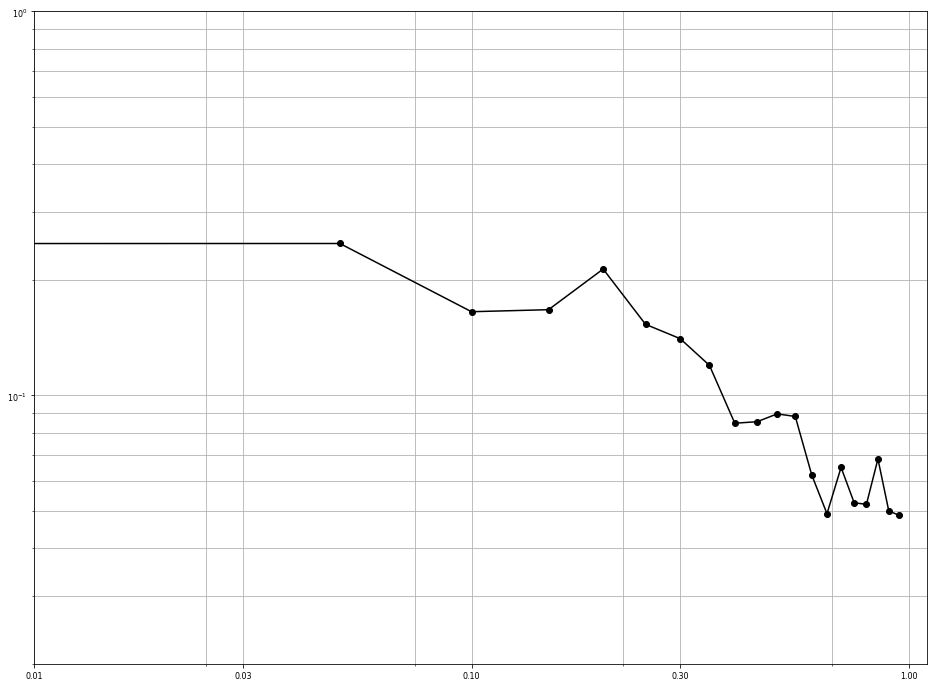

In [142]:
f=np.zeros(int(f_pts))
for i in range(0,int(f_pts)):
    f[i]=(i*(rate/2))/(f_pts-1)
Cxy_ser=pd.Series(Cxy[0:m.floor((rate*(win_len/2)+1)/(rate/2))])
f_ser=pd.Series(f[0:m.floor((rate*(win_len/2)+1)/(rate/2))])
Cxy_ser_smth=pd.Series(Cxy[0:m.floor(((rate*(win_len/2)+1)/(rate/2))/10)])
f_ser_smth=pd.Series(f[0:m.floor(((rate*(win_len/2)+1)/(rate/2))/10)])

for i in range(0,m.floor(((rate*(win_len/2)+1)/(rate/2))/10)):
    if i<1:
        Cxy_ser_smth[i]=pd.Series.mean(Cxy_ser[0:4])
        f_ser_smth[i]=0
    elif i<(m.floor(((rate*(win_len/2)+1)/(rate/2))/10)-1):
        Cxy_ser_smth[i]=pd.Series.mean(Cxy_ser[((i*10)-5):((i*10)+4)])
        f_ser_smth[i]=f[i]*rate
    else:
        Cxy_ser_smth[i]=pd.Series.mean(Cxy_ser[((i*10)-5):(i*10)])
        f_ser_smth[i]=f[i]*rate

fig = plt.figure(figsize=(16,12))
axj = fig.add_subplot(1,1,1)
plt.semilogy(f_ser_smth, Cxy_ser_smth, color='black', marker='o')

axj.set_xscale('log',base=3)
axj.set_ylim(0.02,1)
#axj.set_xlim(0.001,1)
axj.set_xticks([0.01,0.03,0.1,0.3,1])
axj.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
axj.grid(b="True", which="both")

Cxy_ser_smth[1:8].is_monotonic_decreasing

In [198]:
len(roi_names)-1

4

In [200]:
len(behav)

5

In [333]:
target_corr_temp.shape

(387, 5)

In [297]:
corr_hm_norm[2,0,:,:]

array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.0754717 , 0.10555556, 0.25      , 0.        , 0.        ],
       [0.07142857, 0.11702128, 0.2       , 0.        , 0.        ],
       [0.10909091, 1.        , 0.18333333, 0.        , 0.        ],
       [0.07236842, 0.14375   , 0.1375    , 0.        , 0.        ]])

In [220]:
corr_hm[2,0,:,:]

array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.06954326, 0.07817914, 0.13383   , 0.        , 0.        ],
       [0.0716201 , 0.07837799, 0.11674157, 0.        , 0.        ],
       [0.06923026,        inf, 0.11478979, 0.        , 0.        ],
       [0.0706004 , 0.08544342, 0.10321583, 0.        , 0.        ]])

In [219]:
corr_means[2,0,:]

array([0.0706004 , 0.08544342, 0.10321583, 0.        , 0.        ,
       0.06923026,        inf, 0.11478979, 0.        , 0.        ,
       0.0716201 , 0.07837799, 0.11674157, 0.        , 0.        ,
       0.06954326, 0.07817914, 0.13383   , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ])

In [222]:
corr_sums[2,0,:]

array([13.41407579, 17.08868444, 10.32158306,  0.        ,  0.        ,
       19.03832147, 17.37334883,  8.60923452,  0.        ,  0.        ,
       25.06703671, 18.41882839,  5.8370785 ,  0.        ,  0.        ,
       18.42896475, 17.59030707,  6.69150008,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ])

In [223]:
corr_sums[0,0,:]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0.])

In [332]:
target_corr_temp

array([[0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.]])

In [301]:
F_df_cMat_cross[0][0,seed_ID[1]]

0.21721519430286682

In [282]:
seed_ID

array([  5,   9,  30, 146, 434])

In [331]:
cell_cnt[2,z,:]

array([38, 40, 20,  0,  0, 55,  5, 15,  0,  0, 70, 47, 10,  0,  0, 53, 45,
       10,  0,  0,  0,  0,  0,  0,  0])

In [316]:
temp_zscore[0,259]

-0.02777850292758064

In [313]:
temp_zscore.shape

(257, 449)

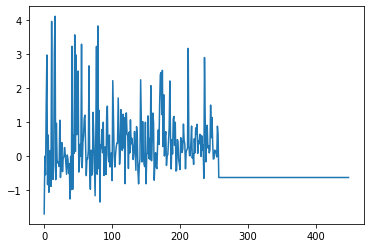

In [312]:
plt.plot(temp_zscore[1,:])

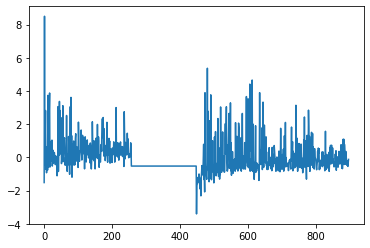

In [304]:
plt.plot(scipy.stats.zscore(F_df_cMat_cross[0][1,:]))

In [305]:
ncells[p]

257.0

In [308]:
temp_zscore[p,z,257]

IndexError: too many indices for array: array is 2-dimensional, but 3 were indexed

In [270]:
len(F_df_cMat_cross[p][:])

898

In [274]:
F_df_cMat_cross[0][1,2]

0.008101029197791343

In [276]:
corr_hm_norm[p,z,:,:]

array([[nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan]])

In [277]:
corr_hm_norm[2,0,:,:]

array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.0754717 , 0.10555556, 0.25      , 0.        , 0.        ],
       [0.07142857, 0.11702128, 0.2       , 0.        , 0.        ],
       [0.10909091, 1.        , 0.18333333, 0.        , 0.        ],
       [0.07236842, 0.14375   , 0.1375    , 0.        , 0.        ]])

In [329]:
target_smap.shape

(387,)

In [286]:
20*(2**(abs(F_df_cMat_cross[p][0,seed_ID[1]])*10))

90.13903112186155

In [287]:
len(seed_ID)

5

In [288]:
seed_ID

array([  5,   9,  30, 146, 434])

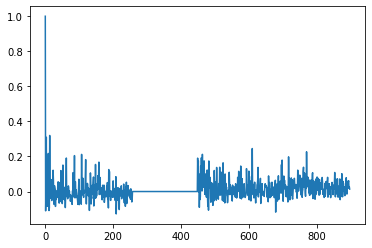

In [317]:
plt.plot(F_df_cMat_cross[p][0,:])

In [290]:
temp_zscore[1,1]

9.11463912846556

In [291]:
temp_zscore[2,2]

20.615830096629292

In [293]:
temp_zscore[1,2]

-0.5482874822968838

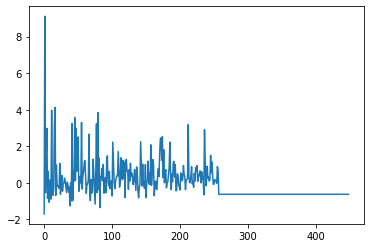

In [295]:
plt.plot(temp_zscore[1,:])

In [320]:
corr_hm.shape

(4, 5, 5, 5)

In [327]:
corr_hm[1,z,:,:]

array([[0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.]])

In [322]:
p

4

In [323]:
roi_names

['rt_M2', 'rt_S1b', 'rt_A1', 'rt_V1', 'combined']

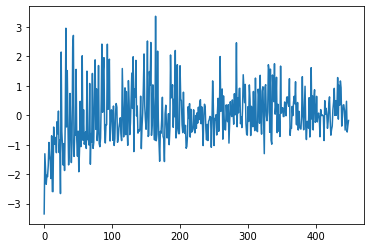

In [340]:
plt.plot(temp_zscore[100,:])

In [341]:
target_corr_temp[0,1]=F_df_cMat_cross[0][0,seed_ID[1]]

In [342]:
target_corr_temp

array([[0.        , 0.27550839, 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       ...,
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])

In [343]:
target_corr_temp.shape

(387, 5)

In [351]:
int(cell_cnt[0,2,seed_cell])

0

In [348]:
seed_cell

6

In [354]:
cell_cnt[0,0,:]

array([ 2,  2,  3,  7,  0,  2,  0, 24, 18,  0,  3,  8, 48, 40,  0, 11,  4,
       39, 34,  0,  0,  0,  0,  0,  0])

In [356]:
target_corr_temp.shape

(257, 7)

In [357]:
seed_ID.shape

(5,)

In [358]:
int(cell_cnt[target_index,z,seed_cell])

7

In [368]:
cell_cnt[2,0,6]

5

In [365]:
seed_cell

6

In [371]:
seed_ID.shape

(5,)

In [373]:
seed_ID[5]

IndexError: index 5 is out of bounds for axis 0 with size 5

In [374]:
i

0

In [375]:
j

5

In [383]:
corr_hm[1,0,:,:]

array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.04877441, 0.04848702, 0.04505503, 0.        , 0.        ],
       [0.04578295, 0.04173185, 0.04329898, 0.        , 0.        ],
       [0.05259964,        inf, 0.0571855 , 0.04007377, 0.        ],
       [0.0468959 , 0.04828277, 0.04503879, 0.06463291, 0.        ]])

In [384]:
cell_cnt[2,0,:]

array([38, 40, 20,  0,  0, 55,  5, 15,  0,  0, 70, 47, 10,  0,  0, 53, 45,
       10,  0,  0,  0,  0,  0,  0,  0])

In [385]:
cell_cnt[1,0,:]

array([21, 27, 18,  1,  0, 24,  0, 26,  2,  0, 17, 23, 25,  0,  0, 13, 32,
       15,  0,  0,  0,  0,  0,  0,  0])

In [386]:
cell_cnt[0,0,:]

array([ 2,  2,  3,  7,  0,  2,  0, 24, 18,  0,  3,  8, 48, 40,  0, 11,  4,
       39, 34,  0,  0,  0,  0,  0,  0])

In [388]:
corr_sums[2,0,:]

array([ 9.18815107, 11.29811585,  7.15143203,  0.        ,  0.        ,
       12.61826315, 11.32824833,  5.75185241,  0.        ,  0.        ,
       16.82356835, 11.75351293,  3.84573641,  0.        ,  0.        ,
       12.10753384, 11.80736102,  4.24449532,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ])

In [389]:
corr_sums[0,0,:]

array([ 0.6478963 ,  0.46002018,  0.56200702,  1.27635003,  0.        ,
        0.41360351,  4.00522032,  6.80288185,  4.40123396,  0.        ,
        0.65438155,  1.4706657 , 11.43679687,  9.54150032,  0.        ,
        2.59378012,  1.13543091, 10.8124317 ,  7.67240303,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ])

In [390]:
corr_means[2,0,:]

array([0.04835869, 0.05649058, 0.07151432, 0.        , 0.        ,
       0.04588459,        inf, 0.07669137, 0.        , 0.        ,
       0.04806734, 0.05001495, 0.07691473, 0.        , 0.        ,
       0.04568881, 0.05247716, 0.08488991, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ])

In [391]:
corr_means[0,0,:]

array([0.06478963, 0.04600202, 0.03746713, 0.03646714, 0.        ,
       0.04136035,        inf, 0.05669068, 0.0489026 , 0.        ,
       0.04362544, 0.03676664, 0.04765332, 0.0477075 , 0.        ,
       0.04715964, 0.05677155, 0.05544837, 0.04513178, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ])

In [392]:
len(seed_ID)

5

In [393]:
 seed_cell

6

In [394]:
cell_cnt[2,0,6]

5

In [395]:
cell_cnt[0,0,6]

0

In [396]:
cell_cnt[1,0,6]

0

In [397]:
cell_cnt[3,0,6]

0

In [402]:
corr_hm.shape

(4, 5, 5, 5)

In [407]:
corr_hm[3,z,1,1]

0.04927071352779286

In [411]:
scn_tar_cnt[0,z,:]

array([ 0,  0,  0,  0,  0,  0, 12,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0])

In [412]:
cell_cnt[0,z,:]

array([ 2,  2,  3,  7,  0,  2,  0, 24, 18,  0,  3,  8, 48, 40,  0, 11,  4,
       39, 34,  0,  0,  0,  0,  0,  0])

In [413]:
target_count[0,z,:]

array([0., 1., 0., 1., 0., 0., 2., 2., 1., 0., 0., 1., 5., 3., 0., 1., 1.,
       3., 1., 0., 0., 0., 0., 0., 0.])

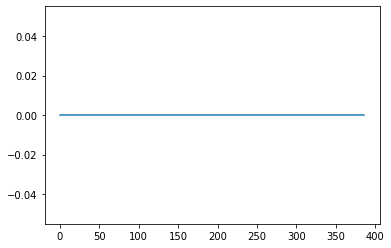

In [420]:
plt.plot(target_corr_temp[:,4])

In [422]:
ncells[3]

387.0

In [423]:
target_corr_temp.shape

(387, 5)

In [424]:
F_df_cMat_cross[0].shape

(898, 898)

In [426]:
target_count[2,0,6]

20.0

In [427]:
target_count[2,0,1]

23.0

In [440]:
target_count[2,0,:]

array([ 88., 110.,  57.,   0.,   0., 137.,  97.,  43.,   0.,   0., 173.,
       115.,  32.,   0.,   0., 126., 106.,  34.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.])

In [441]:
target_count[2,0,:]

array([ 88., 110.,  57.,   0.,   0., 137.,  97.,  43.,   0.,   0., 173.,
       115.,  32.,   0.,   0., 126., 106.,  34.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.])

In [443]:
cell_cnt[2,0,:]*5

array([190, 200, 100,   0,   0, 275,  25,  75,   0,   0, 350, 235,  50,
         0,   0, 265, 225,  50,   0,   0,   0,   0,   0,   0,   0])

In [444]:
target_count[2,0,:]/(cell_cnt[2,0,:]*5)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


array([0.46315789, 0.55      , 0.57      ,        nan,        nan,
       0.49818182, 3.88      , 0.57333333,        nan,        nan,
       0.49428571, 0.4893617 , 0.64      ,        nan,        nan,
       0.4754717 , 0.47111111, 0.68      ,        nan,        nan,
              nan,        nan,        nan,        nan,        nan])

In [445]:
cell_cnt[2,0,:]

array([38, 40, 20,  0,  0, 55,  5, 15,  0,  0, 70, 47, 10,  0,  0, 53, 45,
       10,  0,  0,  0,  0,  0,  0,  0])

In [437]:
isinstance(5,seed_ID)

TypeError: isinstance() arg 2 must be a type or tuple of types

In [447]:
scn_tar_cnt[2,0,:]*5

array([  0,   0,   0,   0,   0,   0, 205,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0])

In [454]:
p

0

In [455]:
F_df_cMat_cross[0].shape

(898, 898)

In [456]:
seed_ID.shape

(26,)

In [457]:
j

23

In [458]:
corr_hm_norm[0,0,:]

array([[1.]])

In [463]:
target_corr_temp.shape

(257, 23)

In [464]:
j

23

In [465]:
len(seed_ID)

26

In [466]:
cell_cnt[target_index,z,seed_cell]

23

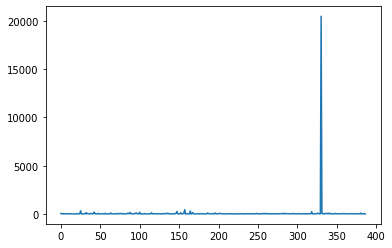

In [468]:
plt.plot(target_smap[:])

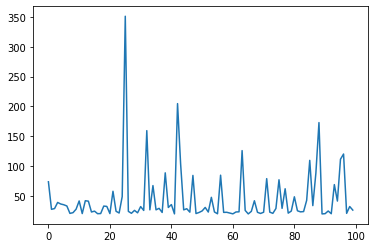

In [469]:
plt.plot(target_smap[0:100])

In [470]:
target_smap=target_smap/len(seed_ID)

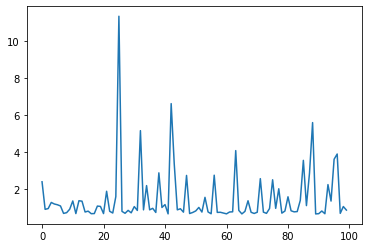

In [471]:
plt.plot(target_smap[0:100])

In [472]:
len(seed_ID)

31

In [480]:
temp_zscore.shape

(279, 257)

In [482]:
corr_hm_norm[p,z,:,:]

array([[nan, nan],
       [nan, nan]])

In [483]:
corr_hm[p,z,:,:]

array([[0.04564242, 0.01679825],
       [0.04490902, 0.02846597]])

In [485]:
temp_zscore.shape

(279, 279)

In [486]:
p

1

In [487]:
ncells[p]

279.0

In [488]:
F_df_cMat_cross[p].shape

(898, 898)

In [490]:
target_corr_temp.shape

(279, 8)

In [491]:
len(seed_ID)

10

In [500]:
save_paths[5]

IndexError: list index out of range

In [499]:
len(roi_names)

5

In [507]:
f_obj.close()